# TDL 8.2 Thinking with Deep Learning: Week 8 Part 2
# Active, Adaptive, and Continuous Learning 

__Instructor:__ James Evans

__Teaching Assistants & Content Creators/Organisers:__ Bhargav Srinivasa Desikan (Notebook Author), James Evans (Notebook Editor), Likun Cao (Notebook Reviewer)


# Active Learning

(from the [Active Learning handbook](http://burrsettles.com/pub/settles.activelearning.pdf))

The key idea behind active learning is that a machine learning algorithm can
achieve greater accuracy with fewer training labels if it is allowed to choose the data from which it learns. An active learner may pose queries, usually in the form of unlabeled data instances to be labeled by an oracle (e.g., a human annotator). Active learning is well-motivated in many modern machine learning problems, where unlabeled data may be abundant or easily obtained, but labels are difficult, time-consuming, or expensive to obtain.

Here are some useful links on Active Learning that we recommend:

- [Robert Munroe Active Learning with PyTorch](https://medium.com/pytorch/https-medium-com-robert-munro-active-learning-with-pytorch-2f3ee8ebec)

- [Robert Munroe's Human in the Loop Learning code](https://github.com/rmunro/pytorch_active_learning)

- [Human-in-the-Loop Methods for Data-Driven and Reinforcement Learning Systems](https://arxiv.org/abs/2008.13221)

- [Google Active Learning code](https://github.com/google/active-learning)

To illustrate Active Learning, we will be using the python package [modAL-python](https://github.com/modAL-python/modAL), who have an extensive documentation with examples. 





## Interactive labeling with Jupyter

In this example, the active learning workflow of modAL is demonstrated - with you in the loop! By running this notebook, you'll be queried to label digits using the [DIGITS dataset](http://archive.ics.uci.edu/ml/datasets/Optical+Recognition+of+Handwritten+Digits). If you would like to try this out, you can [download this notebook here](https://github.com/modAL-python/modAL/blob/master/docs/source/content/examples/interactive_labeling.ipynb)!

In [ ]:
import numpy as np

from modAL.models import ActiveLearner
from modAL.uncertainty import uncertainty_sampling

from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

from IPython import display
from matplotlib import pyplot as plt
%matplotlib inline

/home/namazu/.local/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


### The dataset

Now we set up the initial training set for our classifier. If you would like to play around, you can try to modifiy the value ```n_initial``` below and see if it impacts the algorithm!

In [ ]:
n_initial = 100

In [ ]:
X, y = load_digits(return_X_y=True)
X_train, X_test, y_train, y_test = train_test_split(X, y)

initial_idx = np.random.choice(range(len(X_train)), size=n_initial, replace=False)

X_initial, y_initial = X_train[initial_idx], y_train[initial_idx]
X_pool, y_pool = np.delete(X_train, initial_idx, axis=0), np.delete(y_train, initial_idx, axis=0)

### Initializing the learner

Now we initialize the active learner. Feel free to change the underlying ```RandomForestClassifier``` or the ```uncertainty_sampling```!

In [ ]:
learner = ActiveLearner(
    estimator=RandomForestClassifier(),
    query_strategy=uncertainty_sampling,
    X_training=X_initial, y_training=y_initial
)

We also set how many queries we want to make. The more the better! (Usually :) )

In [ ]:
n_queries = 20

### The active learning loop

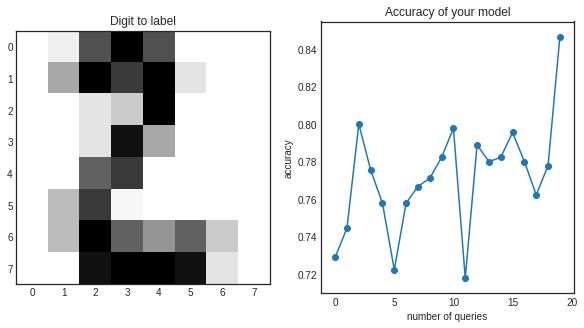

Which digit is this?
2


In [ ]:
accuracy_scores = [learner.score(X_test, y_test)]

for i in range(n_queries):
    display.clear_output(wait=True)
    query_idx, query_inst = learner.query(X_pool)
    with plt.style.context('seaborn-white'):
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.title('Digit to label')
        plt.imshow(query_inst.reshape(8, 8))
        plt.subplot(1, 2, 2)
        plt.title('Accuracy of your model')
        plt.plot(range(i+1), accuracy_scores)
        plt.scatter(range(i+1), accuracy_scores)
        plt.xlabel('number of queries')
        plt.ylabel('accuracy')
        display.display(plt.gcf())
        plt.close('all')
        
    print("Which digit is this?")
    y_new = np.array([int(input())], dtype=int)
    learner.teach(query_inst.reshape(1, -1), y_new)
    X_pool, y_pool = np.delete(X_pool, query_idx, axis=0), np.delete(y_pool, query_idx, axis=0)
    accuracy_scores.append(learner.score(X_test, y_test))

Finally, we can visualize the accuracy during the training.

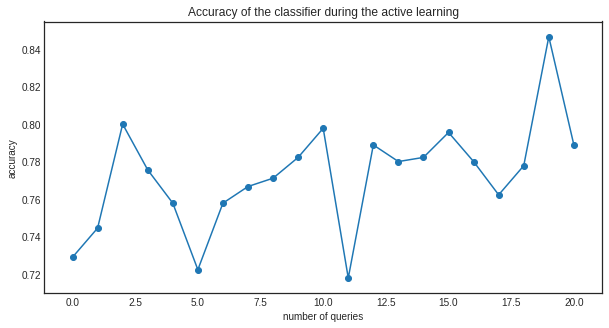

In [ ]:
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(10, 5))
    plt.title('Accuracy of the classifier during the active learning')
    plt.plot(range(n_queries+1), accuracy_scores)
    plt.scatter(range(n_queries+1), accuracy_scores)
    plt.xlabel('number of queries')
    plt.ylabel('accuracy')
    plt.show()

## Uncertainty sampling


When you present unlabelled examples to an active learner, it finds you the most *useful* example and presents it for you to be labelled. This is done by first calculating the *usefulness* of prediction (whatever it means) for each example and select an instance based on the usefulness. The thing is, there are several ways to measure this. They are based upon the classification uncertainty, hence they are called *uncertainty measures*. In modAL, currently you can select from three built-in measures: *classification uncertainty*, *classification margin* and *classification entropy*. In this quick tutorial, we are going to review them. For more details, see Section 2.3 of the awesome book [Active learning by Burr Settles](http://active-learning.net/)!

In [ ]:
import numpy as np

### Classification uncertainty


The simplest measure is the uncertainty of classification defined by

$$U(x)=1-P(\hat{x}|x)$$

where $x$ is the instance to be predicted and $\hat{x}$ is the most likely prediction.

For example, if you have classes ``[0, 1, 2]`` and classification probabilities ``[0.1, 0.2, 0.7]``, the most likely class according to the classifier is ``2`` with uncertainty 0.3. If you have three instances with class probabilities

In [ ]:
proba = np.array([[0.1 , 0.85, 0.05],
                  [0.6 , 0.3 , 0.1 ],
                  [0.39, 0.61, 0.0 ]])

the corresponding uncertainties are:

In [ ]:
1 - proba.max(axis=1)

array([0.15, 0.4 , 0.39])

In the above example, the most uncertain sample is the second one. When
querying for labels based on this measure, the strategy selects the
sample with the highest uncertainty.

For this ternary classification problem, given the first two
probabilities, the classification uncertainty looks like the following.

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

from itertools import product
n_res = 100
p1, p2 = np.meshgrid(np.linspace(0, 1, n_res), np.linspace(0, 1, n_res))
p3 = np.maximum(1 - p1 - p2, 0)

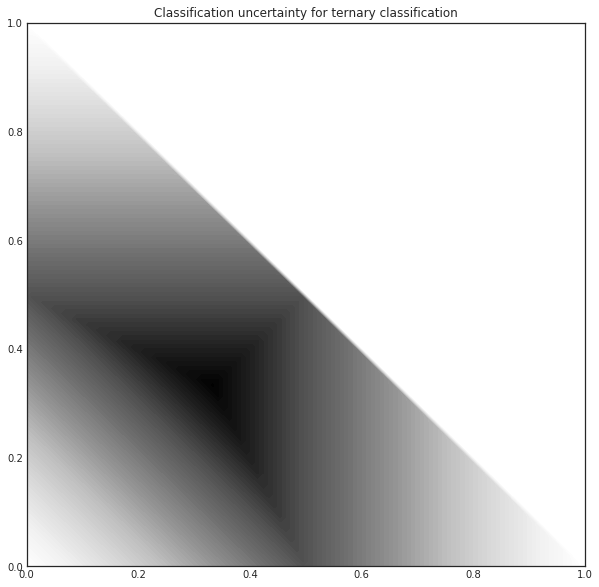

In [ ]:
uncertainty = 1 - np.maximum.reduce([p1, p2, p3])

with plt.style.context('seaborn-white'):
    plt.figure(figsize=(10, 10))
    plt.contourf(p1, p2, uncertainty*((p1+p2) < 1), 100)
    plt.title('Classification uncertainty for ternary classification')

### Classification margin


Classification margin is the difference in probability of the first and second most likely prediction, that is, it is defined by

$$M(x)=P(\hat{x_1}|x)-P(\hat{x_2}|x)$$

where $\hat{x_1}$ and $\hat{x_2}$ are the first and second most likely classes. Using the same example we used for classification uncertainty, if the class probabilities are

In [ ]:
proba = np.array([[0.1 , 0.85, 0.05],
                  [0.6 , 0.3 , 0.1 ],
                  [0.39, 0.61, 0.0 ]])

the corresponding margins are:

In [ ]:
part = np.partition(-proba, 1, axis=1)
margin = - part[:, 0] + part[:, 1]

In [ ]:
margin

array([0.75, 0.3 , 0.22])

When querying for labels, the strategy selects the sample with the *smallest* margin, since the smaller the decision margin is, the more unsure the decision. In this case, it would be the third sample. For this ternary classification problem, the classifier margin plotted against the first two probabilities are the following.

In [ ]:
proba = np.vstack((p1.ravel(), p2.ravel(), p3.ravel())).T

part = np.partition(-proba, 1, axis=1)
margin = - part[:, 0] + part[:, 1]

margin = margin.reshape(p1.shape)

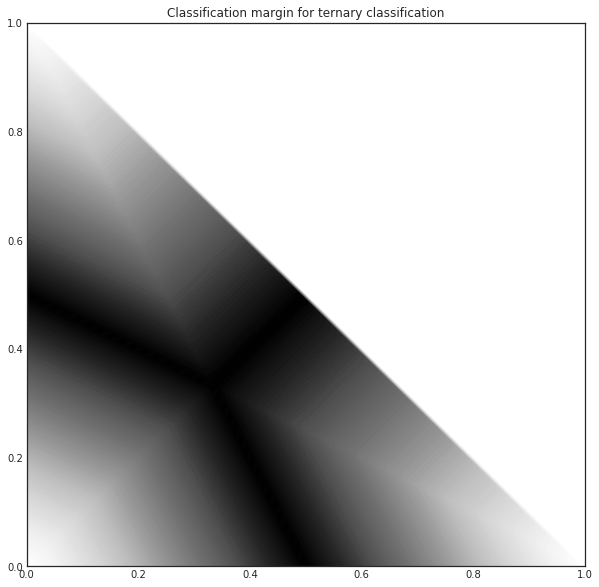

In [ ]:
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(10, 10))
    plt.contourf(p1, p2, (1-margin)*((p1+p2) < 1), 100)
    plt.title('Classification margin for ternary classification')

### Classification entropy


The third built-in uncertainty measure is the classification entropy, which is defined by

$$H(x)=-\sum_{k}p_k\log(p_k)$$

where $p_k$ is the probability of the sample belonging to the $k$-th class. Heuristically, the entropy is proportional to the average number of guesses one has to make to find the true class. In our usual example

In [ ]:
proba = np.array([[0.1 , 0.85, 0.05],
                  [0.6 , 0.3 , 0.1 ],
                  [0.39, 0.61, 0.0 ]])

the corresponding entropies are

In [ ]:
from scipy.stats import entropy

entropy(proba.T)

array([0.51818621, 0.89794572, 0.66874809])

The closer the distribution to uniform, the larger the entropy. Again, if we plot the entropy against the first two probabilities of a ternary classification problem, we obtain the following.

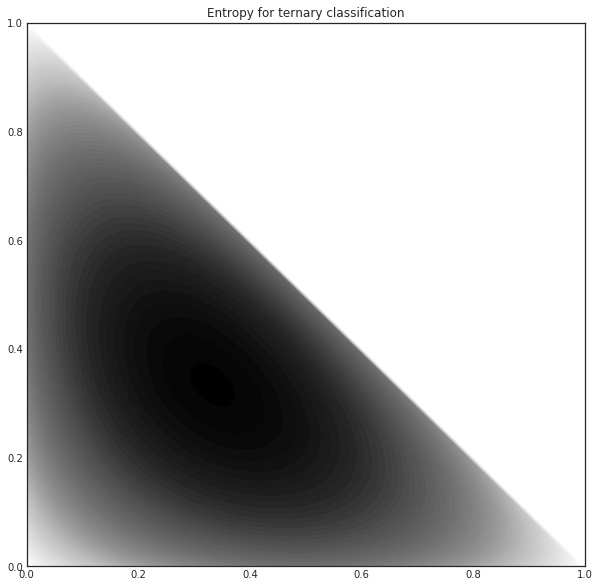

In [ ]:
proba = np.vstack((p1.ravel(), p2.ravel(), p3.ravel())).T
entr = entropy(proba.T).reshape(p1.shape)

with plt.style.context('seaborn-white'):
    plt.figure(figsize=(10, 10))
    plt.contourf(p1, p2, entr*((p1+p2) < 1), 100)
    plt.title('Entropy for ternary classification')

## Information density


When using uncertainty sampling (or other similar strategies), we are unable to take the structure of the data into account. This can lead us to suboptimal queries. To alleviate this, one method is to use information density measures to help us guide our queries.

For an unlabeled dataset $X_{u}$, the information density of an instance $x$ can be calculated as

$$ I(x) = \frac{1}{|X_{u}|} \sum_{x^\prime \in X} sim(x, x^\prime),$$

where $sim(x, x^\prime)$ is a similarity function such as [cosine similarity](https://en.wikipedia.org/wiki/Cosine_similarity) or Euclidean similarity, which is the reciprocal of [Euclidean distance](https://en.wikipedia.org/wiki/Euclidean_distance). The higher the information density, the more similar the given instance is to the rest of the data. To illustrate this, we shall use a simple synthetic dataset.

For more details, see Section 5.1 of the [Active Learning book by Burr Settles](https://www.morganclaypool.com/doi/abs/10.2200/S00429ED1V01Y201207AIM018)!

In [ ]:
from sklearn.datasets import make_blobs

X, y = make_blobs(n_features=2, n_samples=1000, centers=3, random_state=0, cluster_std=0.7)

In [ ]:
from modAL.density import information_density

cosine_density = information_density(X, 'cosine')
euclidean_density = information_density(X, 'euclidean')

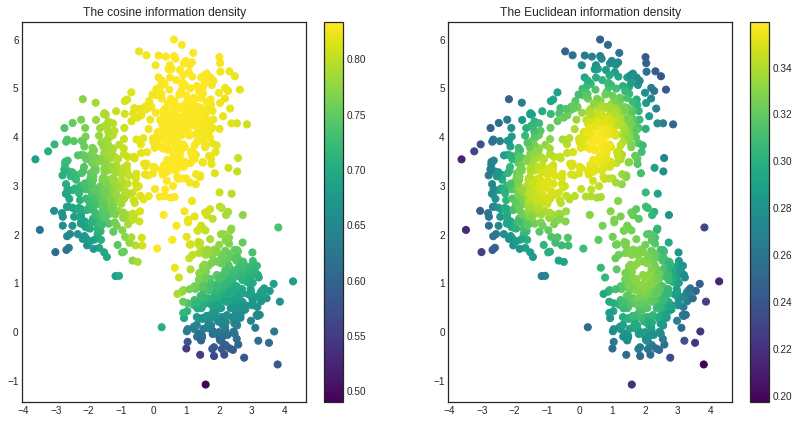

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

# visualizing the cosine and euclidean information density
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(14, 7))
    plt.subplot(1, 2, 1)
    plt.scatter(x=X[:, 0], y=X[:, 1], c=cosine_density, cmap='viridis', s=50)
    plt.title('The cosine information density')
    plt.colorbar()
    plt.subplot(1, 2, 2)
    plt.scatter(x=X[:, 0], y=X[:, 1], c=euclidean_density, cmap='viridis', s=50)
    plt.title('The Euclidean information density')
    plt.colorbar()
    plt.show()

As you can see, the certain similarity functions highlight distinct features of the dataset. The Euclidean information density prefers the center of clusters, while the cosine describes the middle cluster as most important.

## Pool-based sampling

### Overview

In this example, we apply an `ActiveLearner` onto the iris dataset using pool-based sampling. In this setting, we assume a small set of labeled data $\mathcal{L}$ and a large set of unlabeled data $\mathcal{U}$ such that $\left| \mathcal{L} \right| \ll \left| \mathcal{U} \right|$. In his review of the active learning literature, Settles covers a high-level overview of the general pool-based sampling algorithm:

> Queries are selectively drawn from the pool, which is usually assumed to be closed (i.e., static or non-changing), although this is not strictly necessary. Typically, instances are queried in a greedy fashion, according to an informativeness measure used to evaluate all instances in the pool (or, perhaps if $\mathcal{U}$ is very large, some subsample thereof).

Along with our pool-based sampling strategy, `modAL`'s modular design allows you to vary parameters surrounding the active learning process, including the core estimator and query strategy. In this example, we use `scikit-learn`'s [k-nearest neighbors classifier](http://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html) as our estimator and default to `modAL`'s [uncertainty sampling](https://cosmic-cortex.github.io/modAL/Uncertainty-sampling) query strategy.

For further reading on pool-based sampling, we highly recommend the following resources:
- Burr Settles. [Active Learning Literature Survey](http://burrsettles.com/pub/settles.activelearning.pdf) [**Section 2.3: Pool-based Sampling**]. Computer Sciences Technical Report 1648, University of Wisconsin-Madison. 2009.

To enforce a reproducible result across runs, we set a random seed.

In [ ]:
import numpy as np

# Set our RNG seed for reproducibility.
RANDOM_STATE_SEED = 123
np.random.seed(RANDOM_STATE_SEED)

### The dataset

Now we load the dataset. In this example, we are going to use the famous Iris dataset. For more information on the iris dataset, see:
  - [The dataset documentation on Wikipedia](https://en.wikipedia.org/wiki/Iris_flower_data_set)
  - [The scikit-learn interface](http://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_iris.html)

In [ ]:
from sklearn.datasets import load_iris

iris = load_iris()
X_raw = iris['data'] 
y_raw = iris['target']

For visualization purposes, we apply PCA to the original dataset.

In [ ]:
from sklearn.decomposition import PCA

# Define our PCA transformer and fit it onto our raw dataset.
pca = PCA(n_components=2, random_state=RANDOM_STATE_SEED)
transformed_iris = pca.fit_transform(X=X_raw)

This is how the dataset looks like.

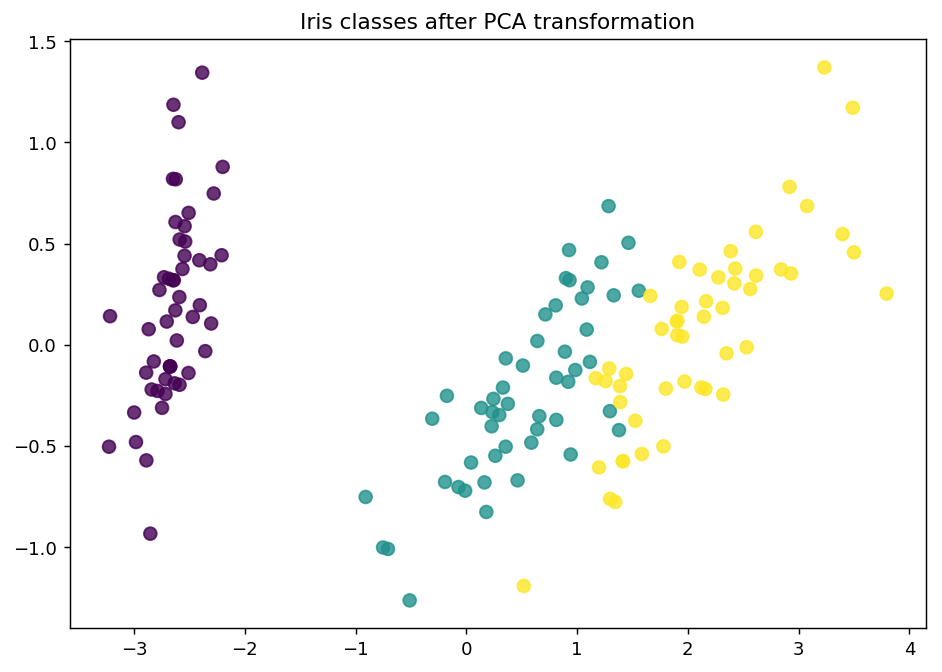

In [ ]:
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

# Isolate the data we'll need for plotting.
x_component, y_component = transformed_iris[:, 0], transformed_iris[:, 1]

# Plot our dimensionality-reduced (via PCA) dataset.
plt.figure(figsize=(8.5, 6), dpi=130)
plt.scatter(x=x_component, y=y_component, c=y_raw, cmap='viridis', s=50, alpha=8/10)
plt.title('Iris classes after PCA transformation')
plt.show()

Now we partition our `iris` dataset into a training set $\mathcal{L}$ and $\mathcal{U}$. We first specify our training set $\mathcal{L}$ consisting of 3 random examples. The remaining examples go to our "unlabeled" pool $\mathcal{U}$.

In [ ]:
# Isolate our examples for our labeled dataset.
n_labeled_examples = X_raw.shape[0]
training_indices = np.random.randint(low=0, high=n_labeled_examples + 1, size=3)

X_train = X_raw[training_indices]
y_train = y_raw[training_indices]

# Isolate the non-training examples we'll be querying.
X_pool = np.delete(X_raw, training_indices, axis=0)
y_pool = np.delete(y_raw, training_indices, axis=0)

### Active learning with pool-based sampling

For the classification, we are going to use a simple k-nearest neighbors classifier. In this step, we are also going to initialize the ```ActiveLearner```.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from modAL.models import ActiveLearner

# Specify our core estimator along with it's active learning model.
knn = KNeighborsClassifier(n_neighbors=3)
learner = ActiveLearner(estimator=knn, X_training=X_train, y_training=y_train)

Let's see how our classifier performs on the initial training set!

In [ ]:
# Isolate the data we'll need for plotting.
predictions = learner.predict(X_raw)
is_correct = (predictions == y_raw)

predictions

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

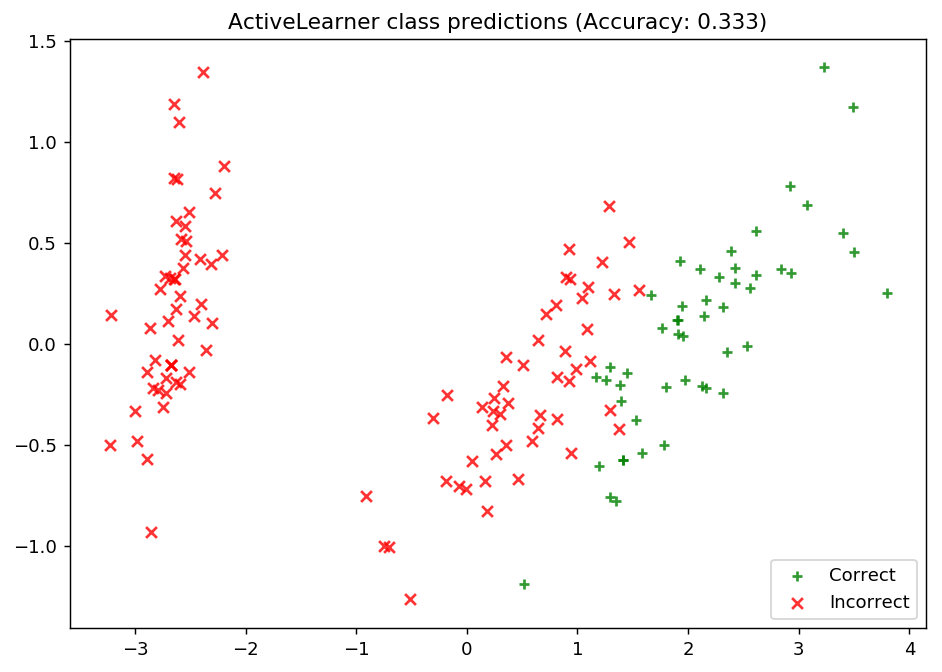

In [ ]:
# Record our learner's score on the raw data.
unqueried_score = learner.score(X_raw, y_raw)

# Plot our classification results.
fig, ax = plt.subplots(figsize=(8.5, 6), dpi=130)
ax.scatter(x=x_component[is_correct],  y=y_component[is_correct],  c='g', marker='+', label='Correct',   alpha=8/10)
ax.scatter(x=x_component[~is_correct], y=y_component[~is_correct], c='r', marker='x', label='Incorrect', alpha=8/10)
ax.legend(loc='lower right')
ax.set_title("ActiveLearner class predictions (Accuracy: {score:.3f})".format(score=unqueried_score))
plt.show()

### Update our model by pool-based sampling our "unlabeled" dataset $\mathcal{U}$

As we can see, our model is unable to properly learn the underlying data distribution. All of its predictions are for the third class label, and as such it is only as competitive as defaulting its predictions to a single class – if only we had more data!

Below, we tune our classifier by allowing it to query 20 instances it hasn't seen before. Using uncertainty sampling, our classifier aims to reduce the amount of uncertainty in its predictions using a variety of measures — see the documentation for more on specific [classification uncertainty measures](https://modal-python.readthedocs.io/en/latest/content/query_strategies/Uncertainty-sampling.html). With each requested query, we remove that record from our pool $\mathcal{U}$ and record our model's accuracy on the raw dataset.

In [ ]:
N_QUERIES = 20
performance_history = [unqueried_score]

# Allow our model to query our unlabeled dataset for the most
# informative points according to our query strategy (uncertainty sampling).
for index in range(N_QUERIES):
  query_index, query_instance = learner.query(X_pool)
  
  # Teach our ActiveLearner model the record it has requested.
  X, y = X_pool[query_index].reshape(1, -1), y_pool[query_index].reshape(1, )
  learner.teach(X=X, y=y)
  
  # Remove the queried instance from the unlabeled pool.
  X_pool, y_pool = np.delete(X_pool, query_index, axis=0), np.delete(y_pool, query_index)
  
  # Calculate and report our model's accuracy.
  model_accuracy = learner.score(X_raw, y_raw)
  print('Accuracy after query {n}: {acc:0.4f}'.format(n=index + 1, acc=model_accuracy))
  
  # Save our model's performance for plotting.
  performance_history.append(model_accuracy)

Accuracy after query 1: 0.6667
Accuracy after query 2: 0.6667
Accuracy after query 3: 0.8800
Accuracy after query 4: 0.8800
Accuracy after query 5: 0.8733
Accuracy after query 6: 0.8400
Accuracy after query 7: 0.7400
Accuracy after query 8: 0.7267
Accuracy after query 9: 0.7267
Accuracy after query 10: 0.7267
Accuracy after query 11: 0.7267
Accuracy after query 12: 0.7267
Accuracy after query 13: 0.7267
Accuracy after query 14: 0.7267
Accuracy after query 15: 0.7200
Accuracy after query 16: 0.8400
Accuracy after query 17: 0.8800
Accuracy after query 18: 0.8933
Accuracy after query 19: 0.9267
Accuracy after query 20: 0.9267


### Evaluate our model's performance

Here, we first plot the query iteration index against model accuracy. To visualize the performance of our classifier, we also plot the correct and incorrect predictions on the full dataset.

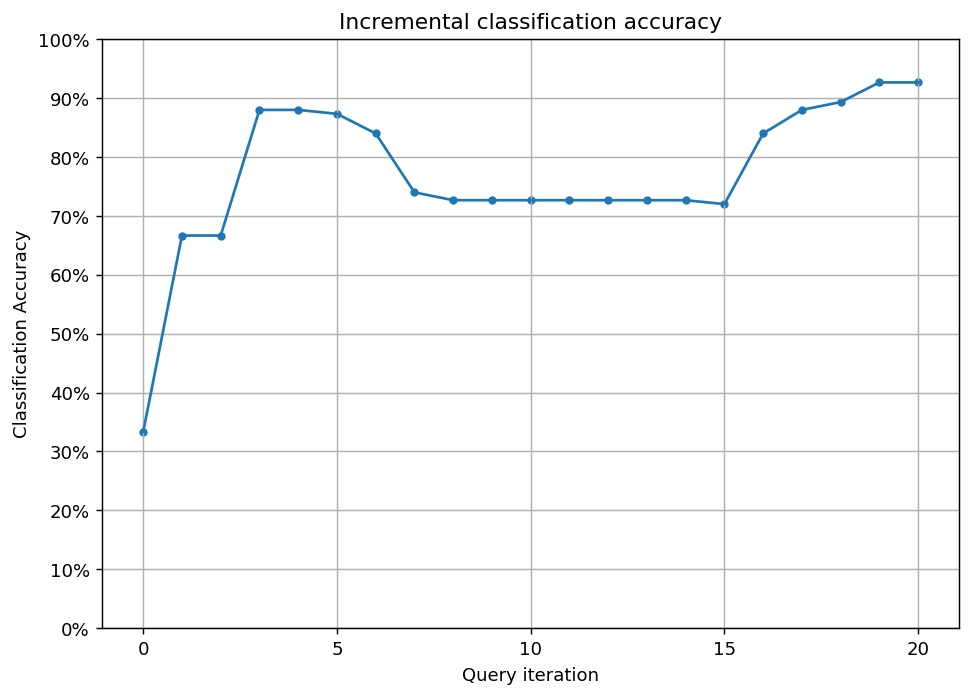

In [ ]:
# Plot our performance over time.
fig, ax = plt.subplots(figsize=(8.5, 6), dpi=130)

ax.plot(performance_history)
ax.scatter(range(len(performance_history)), performance_history, s=13)

ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=5, integer=True))
ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=10))
ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(xmax=1))

ax.set_ylim(bottom=0, top=1)
ax.grid(True)

ax.set_title('Incremental classification accuracy')
ax.set_xlabel('Query iteration')
ax.set_ylabel('Classification Accuracy')

plt.show()

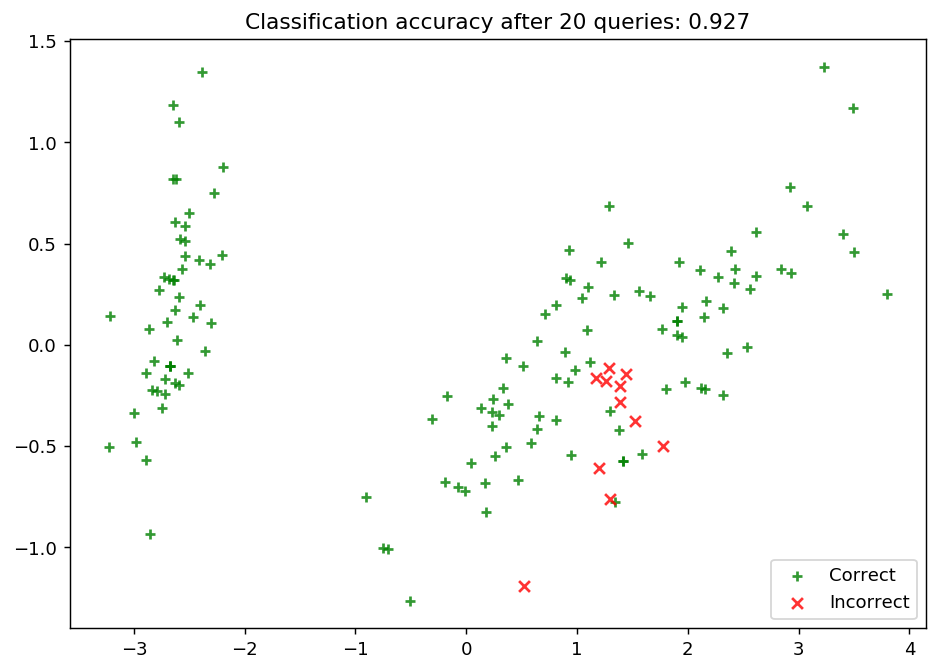

In [ ]:
# Isolate the data we'll need for plotting.
predictions = learner.predict(X_raw)
is_correct = (predictions == y_raw)

# Plot our updated classification results once we've trained our learner.
fig, ax = plt.subplots(figsize=(8.5, 6), dpi=130)

ax.scatter(x=x_component[is_correct],  y=y_component[is_correct],  c='g', marker='+', label='Correct',   alpha=8/10)
ax.scatter(x=x_component[~is_correct], y=y_component[~is_correct], c='r', marker='x', label='Incorrect', alpha=8/10)

ax.set_title('Classification accuracy after {n} queries: {final_acc:.3f}'.format(n=N_QUERIES, final_acc=performance_history[-1]))
ax.legend(loc='lower right')

plt.show()

## Ranked batch-mode sampling


When querying from unlabeled data, sometimes you have the resources to label multiple instances at the same time. Classical uncertainty sampling however, does not quite support this scenario. To address this issue, multiple strategies were proposed, for instance [Ranked batch-mode queries](https://www.sciencedirect.com/science/article/pii/S0020025516313949) by Cardoso et al., which is implemented in modAL.

In this method, each example $x$ is scored using the formula

$$score = \alpha(1 - \Phi(x, X_{labeled})) + (1 - \alpha) U(x),$$

where $\alpha = \frac{|X_{unlabeled}|}{|X_{unlabeled}| + |X_{labeled}|}$, $X_{labeled}$ is the labeled dataset, $U(x)$ is the uncertainty of predictions for $x$, and $\Phi$ is a so-called similarity function, for instance [cosine similarity](https://en.wikipedia.org/wiki/Cosine_similarity). This latter function measures how well the feature space is explored near $x$. (The lower the better.)

After scoring, the highest scored instance is put at the top of a list. The instance is removed from the pool and the score is recalculated until the desired amount of instances are selected.

In here, we will use the Iris dataset to demonstrate this. For more information on the iris dataset, see its [wikipedia page](https://en.wikipedia.org/wiki/Iris_flower_data_set) or the documentation of its [scikit-learn interface](http://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_iris.html).

In [ ]:
import numpy as np
from sklearn.datasets import load_iris

# Loading the dataset
iris = load_iris()
X_raw = iris['data'] 
y_raw = iris['target']

# Isolate our examples for our labeled dataset.
n_labeled_examples = X_raw.shape[0]
training_indices = np.random.randint(low=0, high=len(X_raw)+1, size=3)

# Defining the training data
X_training = X_raw[training_indices]
y_training = y_raw[training_indices]

# Isolate the non-training examples we'll be querying.
X_pool = np.delete(X_raw, training_indices, axis=0)
y_pool = np.delete(y_raw, training_indices, axis=0)

For visualization purposes, we also perform a PCA transformation on the dataset.

In [ ]:
from sklearn.decomposition import PCA

# Define our PCA transformer and fit it onto our raw dataset.
pca = PCA(n_components=2)
pca.fit(X=X_raw)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

Now we initialize an ActiveLearner.

In [ ]:
from modAL.models import ActiveLearner
from modAL.batch import uncertainty_batch_sampling
from sklearn.neighbors import KNeighborsClassifier

# Specify our core estimator.
knn = KNeighborsClassifier(n_neighbors=3)

learner = ActiveLearner(
    estimator=knn, 
    query_strategy=uncertainty_batch_sampling,
    X_training=X_training, y_training=y_training
)

In [ ]:
from modAL.batch import ranked_batch
from modAL.uncertainty import classifier_uncertainty
from sklearn.metrics.pairwise import pairwise_distances

uncertainty = classifier_uncertainty(learner, X_pool)
distance_scores = pairwise_distances(X_pool, X_training, metric='euclidean').min(axis=1)
similarity_scores = 1 / (1 + distance_scores)

alpha = len(X_pool)/len(X_raw)

scores = alpha * (1 - similarity_scores) + (1 - alpha) * uncertainty

Now we can visualize the scores for the first instance during the first query.

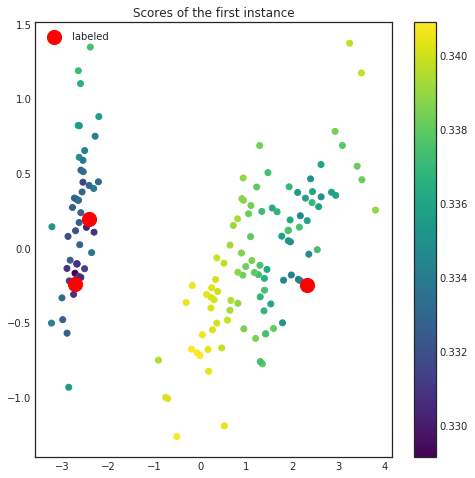

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
transformed_pool = pca.transform(X_pool)
transformed_training = pca.transform(X_training)

with plt.style.context('seaborn-white'):
    plt.figure(figsize=(8, 8))
    plt.scatter(transformed_pool[:, 0], transformed_pool[:, 1], c=scores, cmap='viridis')
    plt.colorbar()
    plt.scatter(transformed_training[:, 0], transformed_training[:, 1], c='r', s=200, label='labeled')
    plt.title('Scores of the first instance')
    plt.legend()

After the scores have been calculated, the highest scoring instance is selected and removed from the pool. **This instance is not queried yet!** The scores will be recalculated until the desired number of examples are available to send for query. In this setting, we shall visualize the instances to be queried in the first batch.

In [ ]:
query_idx, query_instances = learner.query(X_pool, n_instances=5)

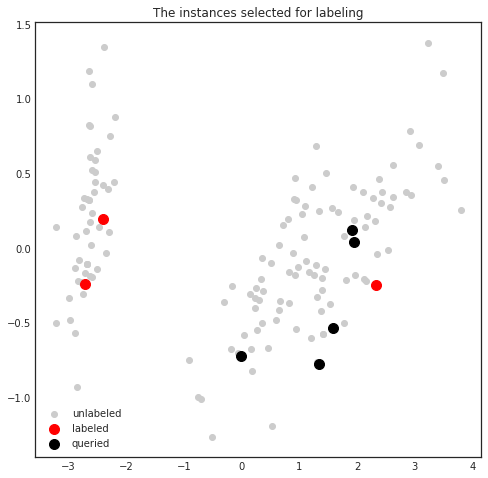

In [ ]:
transformed_batch = pca.transform(query_instances)

with plt.style.context('seaborn-white'):
    plt.figure(figsize=(8, 8))
    plt.scatter(transformed_pool[:, 0], transformed_pool[:, 1], c='0.8', label='unlabeled')
    plt.scatter(transformed_training[:, 0], transformed_training[:, 1], c='r', s=100, label='labeled')
    plt.scatter(transformed_batch[:, 0], transformed_batch[:, 1], c='k', s=100, label='queried')
    plt.title('The instances selected for labeling')
    plt.legend()

## Ranked batch-mode sampling Example

### Overview

In this example, we apply an `ActiveLearner` onto the iris dataset using **ranked batch-mode active learning**. Much like pool-based sampling, in this setting we assume a small (potentially empty) set of labeled data $\mathcal{L}$ and a large set of unlabeled data $\mathcal{U}$ such that $\left| \mathcal{L} \right| \ll \left| \mathcal{U} \right|$.

One of the drawbacks of standard pool-based sampling (indeed, most sampling techniques) is their interactive nature: these sampling methods are best fit for cases where we have an attentive human-in-the-loop for maximizing the model's performance. Although these sampling methods (ours included!) _do_ support returning multiple samples per query, they tend to return redundant/sub-optimal queries if we return more than one instance from the unlabeled set. This is a bit prohibitive in settings where we'd like to ask an active learner to return multiple (if not all) examples from the unlabeled set/pool.

This implementation (see the original issue [here](https://github.com/cosmic-cortex/modAL/issues/11)) implements Cardoso et al.'s **ranked batch-mode** sampling, which not only supports batch-mode sampling (sampling methods that are built with querying multiple labels from the unlabeled set) but also establishes a _ranking_ among the batch in order for end-users to prioritize which records to label from the unlabeled set. In their own words:

> Our new approach allows the algorithm to generate an arbitrarily long query, thus making its execution less frequent. For example, a ranked query containing every available instance could be generated outside working hours. This would allow hired analysts to label instances for a full day, in parallel, if desired, without waiting for the learner update and query reconstruction.

For further reading on ranked batch-mode active learning, we highly recommend the following resources:

- Thiago N.C. Cardoso, Rodrigo M. Silva, Sérgio Canuto, Mirella M. Moro, Marcos A. Gonçalves. [Ranked batch-mode active learning](http://www.sciencedirect.com/science/article/pii/S0020025516313949). Information Sciences, Volume 379, 2017, Pages 313-337.

### Note

Although this notebook only highlights the benefits of batch sampling (as opposed to interactive sampling), the same ideas hold for ranked batch-mode sampling. One day we'll get around to producing examples where ranked batch-mode sampling is the core idea being evaluated :)

To enforce a reproducible result across runs, we set a random seed.

In [ ]:
import numpy as np

# Set our RNG for reproducibility.
RANDOM_STATE_SEED = 123
np.random.seed(RANDOM_STATE_SEED)

### The dataset

Now we load the dataset. In this example, we are going to use the famous Iris dataset. For more information on the iris dataset, see:
  - [The dataset documentation on Wikipedia](https://en.wikipedia.org/wiki/Iris_flower_data_set)
  - [The scikit-learn interface](http://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_iris.html)

In [ ]:
from sklearn.datasets import load_iris

iris = load_iris()
X_raw = iris['data'] 
y_raw = iris['target']

For visualization purposes, we apply PCA to the original dataset.

In [ ]:
from sklearn.decomposition import PCA

# Define our PCA transformer and fit it onto our raw dataset.
pca = PCA(n_components=2, random_state=RANDOM_STATE_SEED)
transformed_iris = pca.fit_transform(X=X_raw)

This is how the dataset looks like.

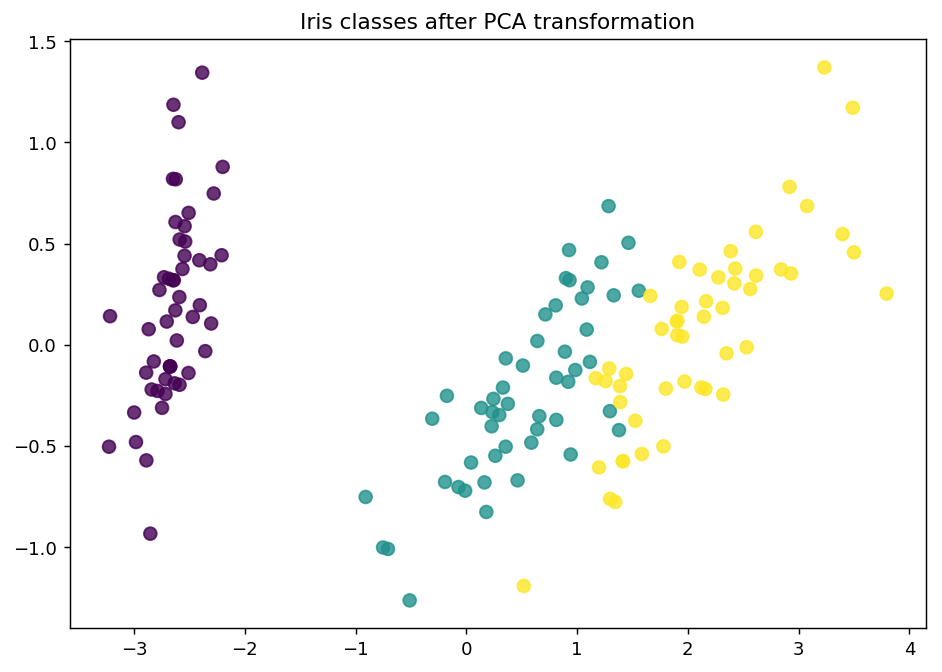

In [ ]:
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

# Isolate the data we'll need for plotting.
x_component, y_component = transformed_iris[:, 0], transformed_iris[:, 1]

# Plot our dimensionality-reduced (via PCA) dataset.
plt.figure(figsize=(8.5, 6), dpi=130)
plt.scatter(x=x_component, y=y_component, c=y_raw, cmap='viridis', s=50, alpha=8/10)
plt.title('Iris classes after PCA transformation')
plt.show()

Now we partition our `iris` dataset into a training set $\mathcal{L}$ and $\mathcal{U}$. We first specify our training set $\mathcal{L}$ consisting of 3 random examples. The remaining examples go to our "unlabeled" pool $\mathcal{U}$.

In [ ]:
# Isolate our examples for our labeled dataset.
n_labeled_examples = X_raw.shape[0]
training_indices = np.random.randint(low=0, high=n_labeled_examples + 1, size=3)

X_train = X_raw[training_indices]
y_train = y_raw[training_indices]

# Isolate the non-training examples we'll be querying.
X_pool = np.delete(X_raw, training_indices, axis=0)
y_pool = np.delete(y_raw, training_indices, axis=0)

### Active learning with ranked batch mode sampling

For the classification, we are going to use a simple k-nearest neighbors classifier.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

# Specify our core estimator.
knn = KNeighborsClassifier(n_neighbors=3)

Now we initialize the ```ActiveLearner```.

In [ ]:
from functools import partial
from modAL.batch import uncertainty_batch_sampling
from modAL.models import ActiveLearner

# Pre-set our batch sampling to retrieve 3 samples at a time.
BATCH_SIZE = 3
preset_batch = partial(uncertainty_batch_sampling, n_instances=BATCH_SIZE)

# Specify our active learning model.
learner = ActiveLearner(
  estimator=knn, 
  
  X_training=X_train,
  y_training=y_train, 
  
  query_strategy=preset_batch
)

Let's see how our classifier performs on the initial training set!

In [ ]:
# Isolate the data we'll need for plotting.
predictions = learner.predict(X_raw)
is_correct = (predictions == y_raw)

predictions

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

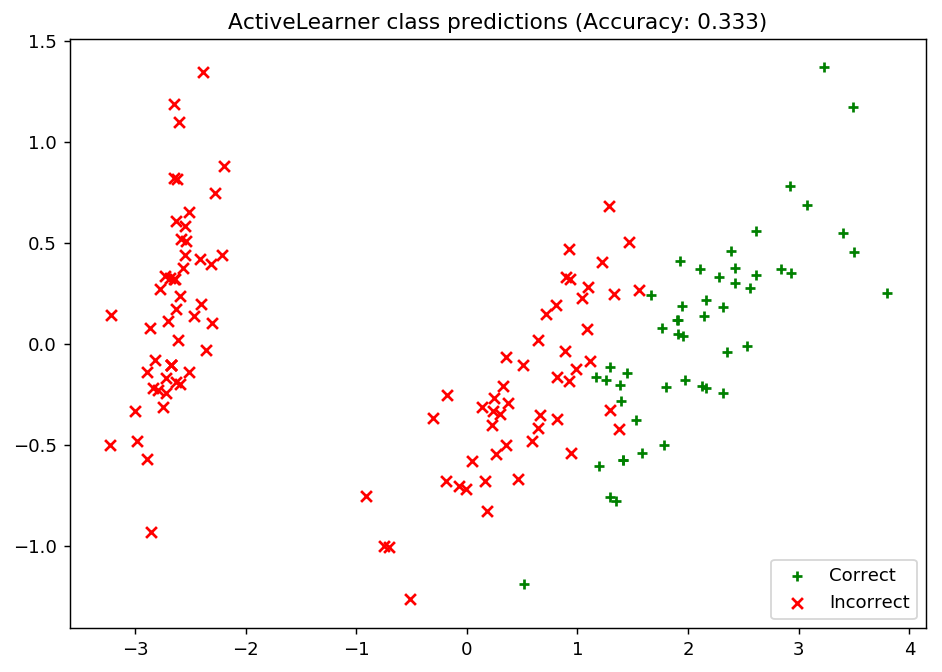

In [ ]:
# Record our learner's score on the raw data.
unqueried_score = learner.score(X_raw, y_raw)

# Plot our classification results.
fig, ax = plt.subplots(figsize=(8.5, 6), dpi=130)
ax.scatter(x=x_component[is_correct],  y=y_component[is_correct],  c='g', marker='+', label='Correct')
ax.scatter(x=x_component[~is_correct], y=y_component[~is_correct], c='r', marker='x', label='Incorrect')
ax.legend(loc='lower right')
ax.set_title("ActiveLearner class predictions (Accuracy: {score:.3f})".format(score=unqueried_score))
plt.show()

Now we Update our model by batch-mode sampling our "unlabeled" dataset $\mathcal{U}$. We tune our classifier by allowing it to query at most 20 instances it hasn't seen before. To properly utilize batch-mode sampling, we allow our model to request three records per query (instead of 1) but subsequently only allow our model to make 6 queries. Under the hood, our classifier aims to balance the ideas behind uncertainty and dissimilarity in its choices.

With each requested query, we remove that record from our pool $\mathcal{U}$ and record our model's accuracy on the raw dataset.

In [ ]:
# Pool-based sampling
N_RAW_SAMPLES = 20
N_QUERIES = N_RAW_SAMPLES // BATCH_SIZE

performance_history = [unqueried_score]

for index in range(N_QUERIES):
    query_index, query_instance = learner.query(X_pool)
    
    # Teach our ActiveLearner model the record it has requested.
    X, y = X_pool[query_index], y_pool[query_index]
    learner.teach(X=X, y=y)
    
    # Remove the queried instance from the unlabeled pool.
    X_pool = np.delete(X_pool, query_index, axis=0)
    y_pool = np.delete(y_pool, query_index)
    
    # Calculate and report our model's accuracy.
    model_accuracy = learner.score(X_raw, y_raw)
    print('Accuracy after query {n}: {acc:0.4f}'.format(n=index + 1, acc=model_accuracy))
    
    # Save our model's performance for plotting.
    performance_history.append(model_accuracy)

Accuracy after query 1: 0.5400
Accuracy after query 2: 0.8733
Accuracy after query 3: 0.8933
Accuracy after query 4: 0.9267
Accuracy after query 5: 0.9467
Accuracy after query 6: 0.9467


### Evaluate our model's performance

Here, we first plot the query iteration index against model accuracy. As you can see, our model is able to obtain an accuracy of ~0.90 within its first query, and isn't as susceptible to getting "stuck" with querying uninformative records from our unlabeled set.
To visualize the performance of our classifier, we also plot the correct and incorrect predictions on the full dataset.

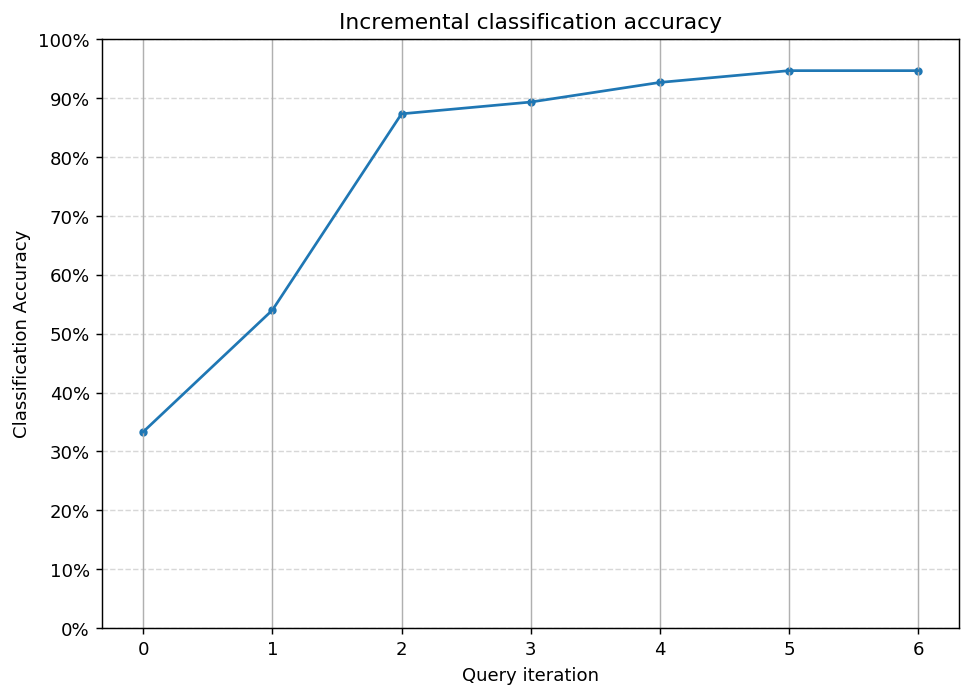

In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt

# Plot our performance over time.
fig, ax = plt.subplots(figsize=(8.5, 6), dpi=130)

ax.plot(performance_history)
ax.scatter(range(len(performance_history)), performance_history, s=13)

ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=N_QUERIES + 3, integer=True))
ax.xaxis.grid(True)

ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=10))
ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(xmax=1))
ax.set_ylim(bottom=0, top=1)
ax.yaxis.grid(True, linestyle='--', alpha=1/2)

ax.set_title('Incremental classification accuracy')
ax.set_xlabel('Query iteration')
ax.set_ylabel('Classification Accuracy')

plt.show()

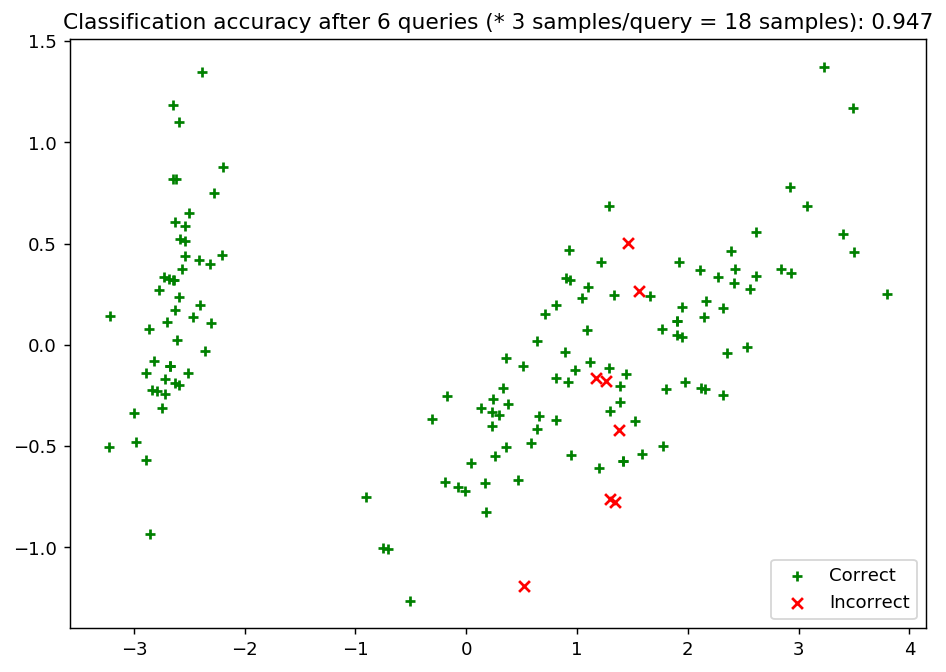

In [ ]:
# Isolate the data we'll need for plotting.
predictions = learner.predict(X_raw)
is_correct = (predictions == y_raw)

# Plot our updated classification results once we've trained our learner.
fig, ax = plt.subplots(figsize=(8.5, 6), dpi=130)

ax.scatter(x=x_component[is_correct],  y=y_component[is_correct],  c='g', marker='+', label='Correct')
ax.scatter(x=x_component[~is_correct], y=y_component[~is_correct], c='r', marker='x', label='Incorrect')

ax.set_title('Classification accuracy after {n} queries (* {batch_size} samples/query = {total} samples): {final_acc:.3f}'.format(
    n=N_QUERIES, 
    batch_size=BATCH_SIZE,
    total=N_QUERIES * BATCH_SIZE,
    final_acc=performance_history[-1]
))
ax.legend(loc='lower right')

plt.show()

## Stream-based sampling


In addition to pool-based sampling, the stream-based scenario can also be implemented easily with modAL. In this case, the labels are not queried from a pool of instances. Rather, they are given one-by-one for the learner, which queries for its label if it finds the example useful. For instance, an example can be marked as useful if the prediction is uncertain, because acquiring its label would remove this uncertainty.

The executable script for this example can be [found here](https://github.com/cosmic-cortex/modAL/blob/master/examples/stream-based_sampling.py)!

To enforce a reproducible result across runs, we set a random seed.

### The dataset

In this example, we are going to learn a black square on a white background. We are going to use a random forest classifier in a stream-based setting. First, let's generate some data!

In [ ]:
import numpy as np

# creating the image
im_width = 500
im_height = 500
im = np.zeros((im_height, im_width))
im[100:im_width - 1 - 100, 100:im_height - 1 - 100] = 1

# create the data to stream from
X_full = np.transpose(
    [np.tile(np.asarray(range(im.shape[0])), im.shape[1]),
     np.repeat(np.asarray(range(im.shape[1])), im.shape[0])]
)
# map the intensity values against the grid
y_full = np.asarray([im[P[0], P[1]] for P in X_full])

# create the data to stream from
X_full = np.transpose(
    [np.tile(np.asarray(range(im.shape[0])), im.shape[1]),
     np.repeat(np.asarray(range(im.shape[1])), im.shape[0])]
)
# map the intensity values against the grid
y_full = np.asarray([im[P[0], P[1]] for P in X_full])

In case you are wondering, here is how this looks like! 

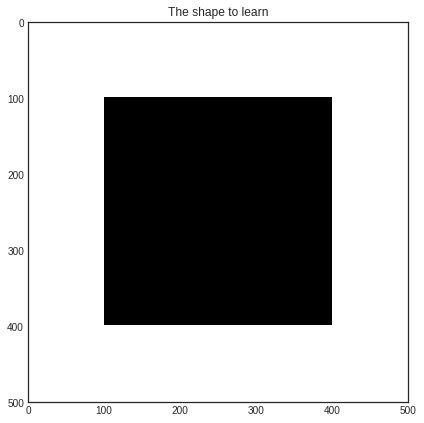

In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

with plt.style.context('seaborn-white'):
    plt.figure(figsize=(7, 7))
    plt.imshow(im)
    plt.title('The shape to learn')
    plt.show()

### Active learning with stream-based sampling

For classification, we will use a random forest classifier. Initializing the learner is the same as always.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from modAL.models import ActiveLearner

# assembling initial training set
n_initial = 5
initial_idx = np.random.choice(range(len(X_full)), size=n_initial, replace=False)
X_train, y_train = X_full[initial_idx], y_full[initial_idx]

# initialize the learner
learner = ActiveLearner(
    estimator=RandomForestClassifier(),
    X_training=X_train, y_training=y_train
)
unqueried_score = learner.score(X_full, y_full)

print('Initial prediction accuracy: %f' % unqueried_score)

Initial prediction accuracy: 0.500020


/home/namazu/.local/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


Let's see how our classifier performs on the initial training set! This is how the class prediction probabilities look like for each pixel.

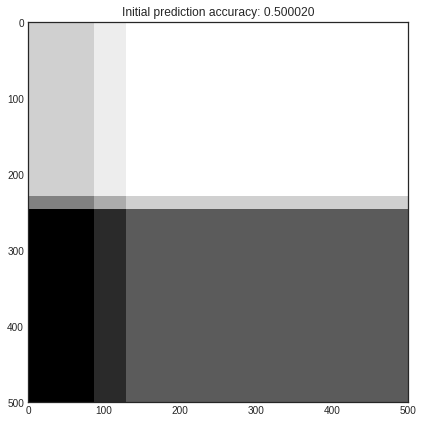

In [ ]:
# visualizing initial prediciton
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(7, 7))
    prediction = learner.predict_proba(X_full)[:, 0]
    plt.imshow(prediction.reshape(im_width, im_height))
    plt.title('Initial prediction accuracy: %f' % unqueried_score)
    plt.show()

Now we are going to randomly sample pixels from the image. If the prediction of the pixel's value is uncertain, we query the true value and teach it to the classifier. We are going to do this until we reach at least 90% accuracy.

In [ ]:
from modAL.uncertainty import classifier_uncertainty

performance_history = [unqueried_score]

# learning until the accuracy reaches a given threshold
while learner.score(X_full, y_full) < 0.90:
    stream_idx = np.random.choice(range(len(X_full)))
    if classifier_uncertainty(learner, X_full[stream_idx].reshape(1, -1)) >= 0.4:
        learner.teach(X_full[stream_idx].reshape(1, -1), y_full[stream_idx].reshape(-1, ))
        new_score = learner.score(X_full, y_full)
        performance_history.append(new_score)
        print('Pixel no. %d queried, new accuracy: %f' % (stream_idx, new_score))

Pixel no. 192607 queried, new accuracy: 0.525604
Pixel no. 249064 queried, new accuracy: 0.458388
Pixel no. 235489 queried, new accuracy: 0.596292
Pixel no. 194087 queried, new accuracy: 0.712372
Pixel no. 91580 queried, new accuracy: 0.710612
Pixel no. 199404 queried, new accuracy: 0.649388
Pixel no. 11005 queried, new accuracy: 0.767728
Pixel no. 151961 queried, new accuracy: 0.751044
Pixel no. 17891 queried, new accuracy: 0.783008
Pixel no. 117487 queried, new accuracy: 0.728964
Pixel no. 206353 queried, new accuracy: 0.836684
Pixel no. 154880 queried, new accuracy: 0.876088
Pixel no. 27770 queried, new accuracy: 0.848776
Pixel no. 194658 queried, new accuracy: 0.892492
Pixel no. 178776 queried, new accuracy: 0.943476


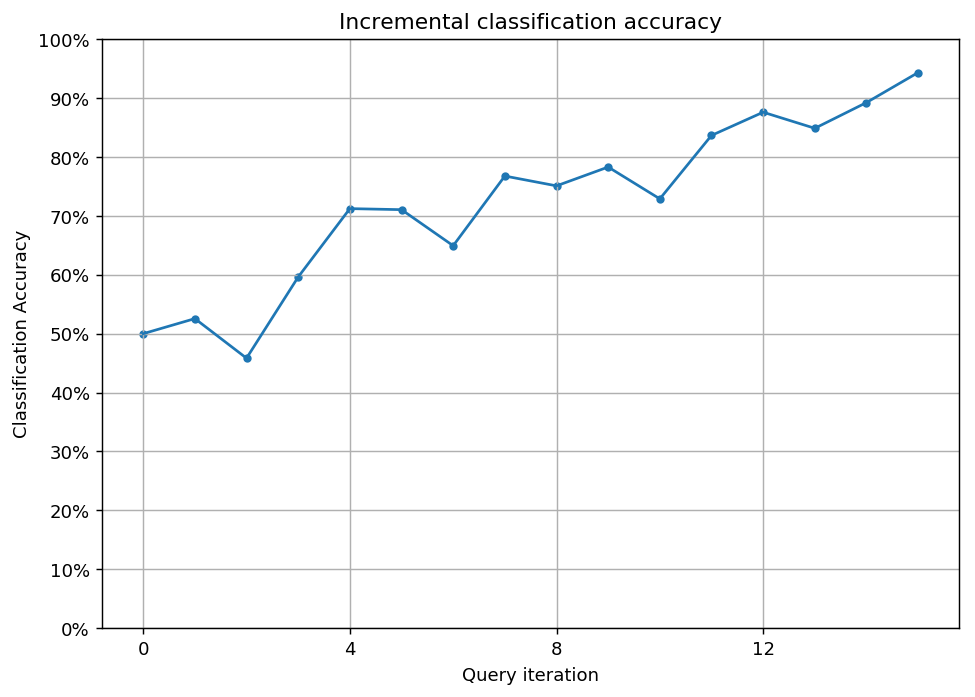

In [ ]:
# Plot our performance over time.
fig, ax = plt.subplots(figsize=(8.5, 6), dpi=130)

ax.plot(performance_history)
ax.scatter(range(len(performance_history)), performance_history, s=13)

ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=5, integer=True))
ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=10))
ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(xmax=1))

ax.set_ylim(bottom=0, top=1)
ax.grid(True)

ax.set_title('Incremental classification accuracy')
ax.set_xlabel('Query iteration')
ax.set_ylabel('Classification Accuracy')

plt.show()

## Active regression
In this example, we are going to demonstrate how can the ActiveLearner be used for active regression using Gaussian processes. Since Gaussian processes provide a way to quantify uncertainty of the predictions as the covariance function of the process, they can be used in an active learning setting.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import WhiteKernel, RBF
from modAL.models import ActiveLearner

%matplotlib inline

### The dataset
For this example, we shall try to learn the *noisy sine* function:

In [ ]:
X = np.random.choice(np.linspace(0, 20, 10000), size=200, replace=False).reshape(-1, 1)
y = np.sin(X) + np.random.normal(scale=0.3, size=X.shape)

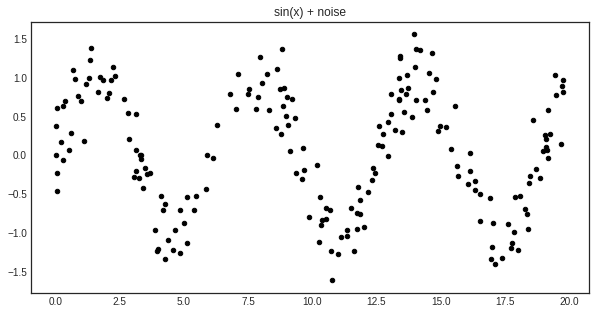

In [ ]:
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(10, 5))
    plt.scatter(X, y, c='k', s=20)
    plt.title('sin(x) + noise')
    plt.show()

### Uncertainty measure and query strategy for Gaussian processes

For active learning, we shall define a custom query strategy tailored to Gaussian processes. More information on how to write your custom query strategies can be found at the page [Extending modAL](https://cosmic-cortex.github.io/modAL/Extending-modAL). In a nutshell, a *query stategy* in modAL is a function taking (at least) two arguments (an estimator object and a pool of examples), outputting the index of the queried instance. In our case, the arguments are ```regressor``` and ```X```.

In [ ]:
def GP_regression_std(regressor, X):
    _, std = regressor.predict(X, return_std=True)
    return np.argmax(std)

### Active learning

Initializing the active learner is as simple as always.

In [ ]:
n_initial = 5
initial_idx = np.random.choice(range(len(X)), size=n_initial, replace=False)
X_training, y_training = X[initial_idx], y[initial_idx]

kernel = RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e3)) \
         + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+1))

regressor = ActiveLearner(
    estimator=GaussianProcessRegressor(kernel=kernel),
    query_strategy=GP_regression_std,
    X_training=X_training.reshape(-1, 1), y_training=y_training.reshape(-1, 1)
)

The initial regressor is not very accurate.

In [ ]:
X_grid = np.linspace(0, 20, 1000)
y_pred, y_std = regressor.predict(X_grid.reshape(-1, 1), return_std=True)
y_pred, y_std = y_pred.ravel(), y_std.ravel()

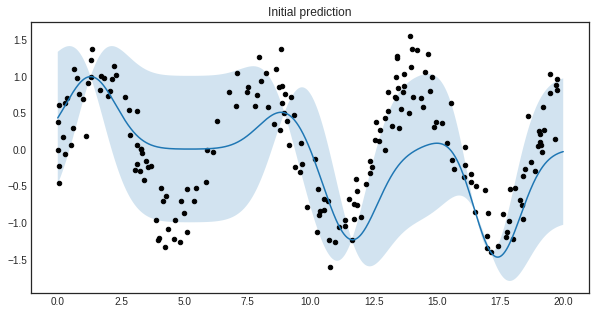

In [ ]:
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(10, 5))
    plt.plot(X_grid, y_pred)
    plt.fill_between(X_grid, y_pred - y_std, y_pred + y_std, alpha=0.2)
    plt.scatter(X, y, c='k', s=20)
    plt.title('Initial prediction')
    plt.show()

The blue band enveloping the regressor represents the standard deviation of the Gaussian process at the given point. Now we are ready to do active learning!

In [ ]:
n_queries = 10
for idx in range(n_queries):
    query_idx, query_instance = regressor.query(X)
    regressor.teach(X[query_idx].reshape(1, -1), y[query_idx].reshape(1, -1))

In [ ]:
y_pred_final, y_std_final = regressor.predict(X_grid.reshape(-1, 1), return_std=True)
y_pred_final, y_std_final = y_pred_final.ravel(), y_std_final.ravel()

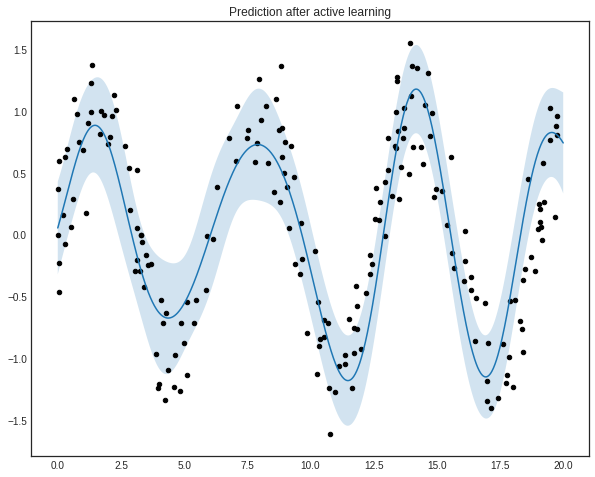

In [ ]:
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(10, 8))
    plt.plot(X_grid, y_pred_final)
    plt.fill_between(X_grid, y_pred_final - y_std_final, y_pred_final + y_std_final, alpha=0.2)
    plt.scatter(X, y, c='k', s=20)
    plt.title('Prediction after active learning')
    plt.show()

## Disagreement Sampling

When you have several hypotheses about your data, selecting the next instances to label can be done by measuring the disagreement between the hypotheses. Naturally, there are many ways to do that. In modAL, there are three built-in disagreement measures and query strategies: vote entropy, consensus entropy and maximum disagreement. In this [quick tutorial](https://modal-python.readthedocs.io/en/latest/content/query_strategies/Disagreement-sampling.html), we are going to review them.

In [1]:
# review that tutorial!

## Ensemble regression
With an ensemble of regressors, the standard deviation of the predictions at a given point can be thought of as a measure of disagreement. This can be used for active regression. In the following example, we are going to see how can it be done using the CommitteeRegressor class.

The executable script for this example can be [found here!](https://github.com/cosmic-cortex/modAL/blob/master/examples/ensemble_regression.py)

### The dataset
For the sake of this example, we are going to learn the *noisy absolute value* function.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import WhiteKernel, RBF
from modAL.models import ActiveLearner, CommitteeRegressor
from modAL.disagreement import max_std_sampling

In [ ]:
# generating the data
X = np.concatenate((np.random.rand(100)-1, np.random.rand(100)))
y = np.abs(X) + np.random.normal(scale=0.2, size=X.shape)

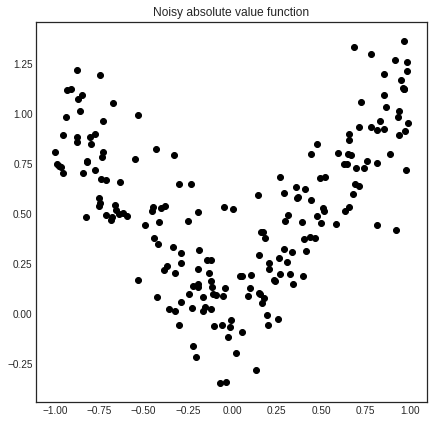

In [ ]:
# visualizing the data
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(7, 7))
    plt.scatter(X, y, c='k')
    plt.title('Noisy absolute value function')
    plt.show()

### Measuring disagreement with CommitteeRegression
If you have several regressors, measuring disagreement can be done by calculating the standard deviation of the predictions for each point. This of course cannot be achieved with classifier algorithms, where averaging the class labels doesn't make sense. (Or it is undefined even, if the class labels are strings for example.) In the simplest setting, this is implemented in the function ```modAL.disagreement.max_std_sampling```.

This measure is default for CommitteeRegressors, so we don't need to specify this upon initialization.

### Active regression
With an ensemble of regressors, it can happen that each one explains part of your data particularly well, while doing poorly on the rest. In our case, it can happen when one of them only seen negative numbers and the other only seen positive ones.

In [ ]:
# initializing the regressors
n_initial = 10
kernel = RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e3)) \
         + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+1))

initial_idx = list()
initial_idx.append(np.random.choice(range(100), size=n_initial, replace=False))
initial_idx.append(np.random.choice(range(100, 200), size=n_initial, replace=False))
learner_list = [ActiveLearner(
                        estimator=GaussianProcessRegressor(kernel),
                        X_training=X[idx].reshape(-1, 1), y_training=y[idx].reshape(-1, 1)
                )
                for idx in initial_idx]

In [ ]:
# initializing the Committee
committee = CommitteeRegressor(
    learner_list=learner_list,
    query_strategy=max_std_sampling
)

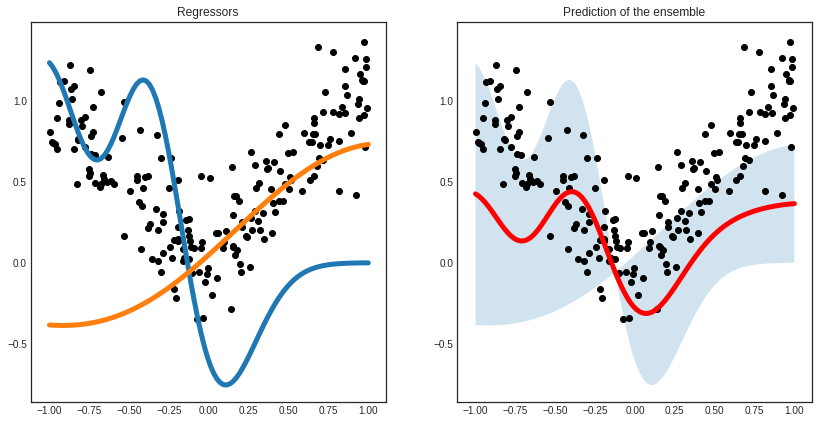

In [ ]:
# visualizing the regressors
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(14, 7))
    x = np.linspace(-1, 1, 100)

    plt.subplot(1, 2, 1)
    for learner_idx, learner in enumerate(committee):
        plt.plot(x, learner.predict(x.reshape(-1, 1)), linewidth=5)
    plt.scatter(X, y, c='k')
    plt.title('Regressors')

    plt.subplot(1, 2, 2)
    pred, std = committee.predict(x.reshape(-1, 1), return_std=True)
    pred = pred.reshape(-1, )
    std = std.reshape(-1, )
    plt.plot(x, pred, c='r', linewidth=5)
    plt.fill_between(x, pred - std, pred + std, alpha=0.2)
    plt.scatter(X, y, c='k')
    plt.title('Prediction of the ensemble')
    plt.show()

After a few queries, the differences are smoothed out and the regressors reach an agreement.

In [ ]:
# active regression
n_queries = 10
for idx in range(n_queries):
    query_idx, query_instance = committee.query(X.reshape(-1, 1))
    committee.teach(X[query_idx].reshape(-1, 1), y[query_idx].reshape(-1, 1))

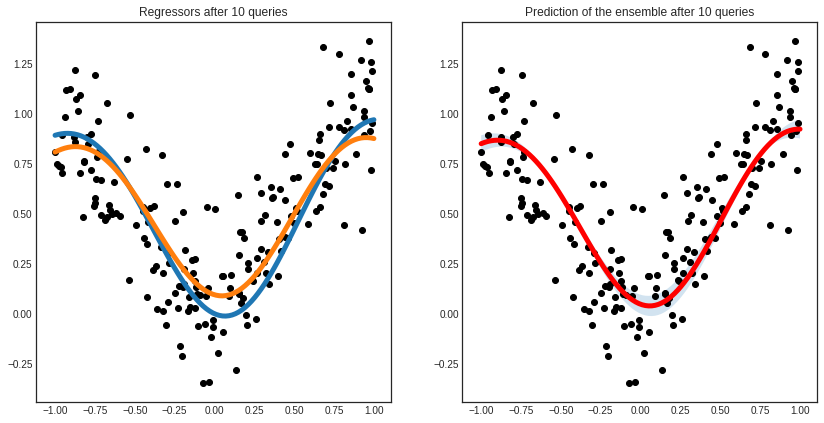

In [ ]:
# visualizing the regressors
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(14, 7))
    x = np.linspace(-1, 1, 100)

    plt.subplot(1, 2, 1)
    for learner_idx, learner in enumerate(committee):
        plt.plot(x, learner.predict(x.reshape(-1, 1)), linewidth=5)
    plt.scatter(X, y, c='k')
    plt.title('Regressors after %d queries' % n_queries)

    plt.subplot(1, 2, 2)
    pred, std = committee.predict(x.reshape(-1, 1), return_std=True)
    pred = pred.reshape(-1, )
    std = std.reshape(-1, )
    plt.plot(x, pred, c='r', linewidth=5)
    plt.fill_between(x, pred - std, pred + std, alpha=0.2)
    plt.scatter(X, y, c='k')
    plt.title('Prediction of the ensemble after %d queries' % n_queries)
    plt.show()

## Bayesian optimization

When a function is expensive to evaluate, or when gradients are not available, optimalizing it requires more sophisticated methods than gradient descent. One such method is Bayesian optimization, which lies close to active learning. In Bayesian optimization, instead of picking queries by maximizing the uncertainty of predictions, function values are evaluated at points where the promise of finding a better value is large. In modAL, these algorithms are implemented with the ```BayesianOptimizer``` class, which is a sibling of ```ActiveLearner```. In the following example, their use is demonstrated on a toy problem.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from functools import partial
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern
from modAL.models import BayesianOptimizer
from modAL.acquisition import optimizer_EI, max_EI

%matplotlib inline

### The function to be optimized

We are going to optimize a simple function to demonstrate the use of ```BayesianOptimizer```.

In [ ]:
import numpy as np

# generating the data
X = np.linspace(0, 20, 1000).reshape(-1, 1)
y = np.sin(X)/2 - ((10 - X)**2)/50 + 2

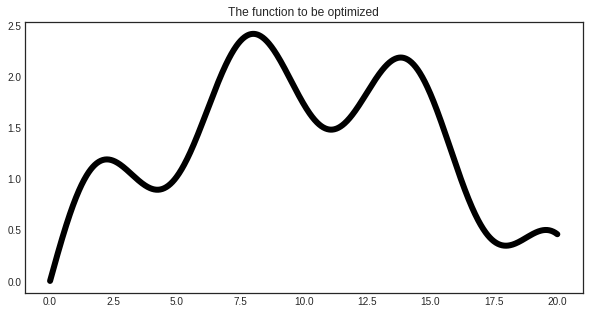

In [ ]:
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(10, 5))
    plt.plot(X, y, c='k', linewidth=6)
    plt.title('The function to be optimized')
    plt.show()

### Gaussian processes
In Bayesian optimization, usually a Gaussian process regressor is used to predict the function to be optimized. One reason is that Gaussian processes can estimate the uncertainty of the prediction at a given point. This in turn can be used to estimate the possible gains at the unknown points.

In [ ]:
# assembling initial training set
X_initial, y_initial = X[150].reshape(1, -1), y[150].reshape(1, -1)

# defining the kernel for the Gaussian process
kernel = Matern(length_scale=1.0)
regressor = GaussianProcessRegressor(kernel=kernel)

### Optimizing using *expected improvement*
During the optimization, the utility of each point is given by the so-called *acquisition function*. In this case, we are going to use the *expected improvement*, which is defined by

$$EI(x) = (\mu(x) - f(x^+)) \psi\Big( \frac{\mu(x) - f(x^+)}{\sigma(x)} \Big) + \sigma(x) \phi\Big( \frac{\mu(x) - f(x^+)}{\sigma(x)} \Big),$$

where $\mu(x)$ and $\sigma(x)$ are the mean and variance of the Gaussian process regressor at $x$, $f$ is the function to be optimized with estimated maximum at $x^+$, and $\psi(z)$, $\phi(z)$ denotes the cumulative distribution function and density function of a standard Gaussian distribution. After each query, the acquisition function is reevaluated and the new query is chosen to maximize the acquisition function. 

In [ ]:
# initializing the optimizer
optimizer = BayesianOptimizer(
    estimator=regressor,
    X_training=X_initial, y_training=y_initial,
    query_strategy=max_EI
)

In [ ]:
# Bayesian optimization
for n_query in range(5):
    query_idx, query_inst = optimizer.query(X)
    optimizer.teach(X[query_idx].reshape(1, -1), y[query_idx].reshape(1, -1))

Using *expected improvement*, the first five queries are the following.

In [ ]:
y_pred, y_std = optimizer.predict(X, return_std=True)
y_pred, y_std = y_pred.ravel(), y_std.ravel()
X_max, y_max = optimizer.get_max()

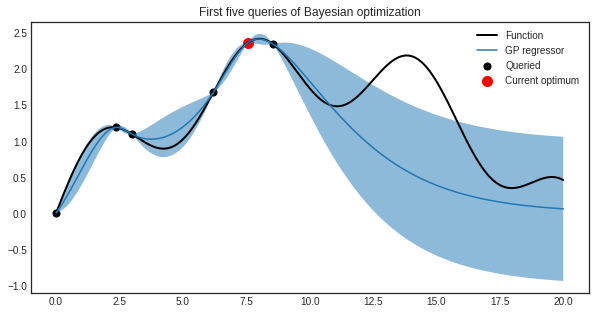

In [ ]:
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(10, 5))
    plt.scatter(optimizer.X_training, optimizer.y_training, c='k', s=50, label='Queried')
    plt.scatter(X_max, y_max, s=100, c='r', label='Current optimum')
    plt.plot(X.ravel(), y, c='k', linewidth=2, label='Function')
    plt.plot(X.ravel(), y_pred, label='GP regressor')
    plt.fill_between(X.ravel(), y_pred - y_std, y_pred + y_std, alpha=0.5)
    plt.title('First five queries of Bayesian optimization')
    plt.legend()
    plt.show()

### Acquisition functions
Currently, there are three built in acquisition functions in the ```modAL.acquisition``` module: *expected improvement*, *probability of improvement* and *upper confidence bounds*. [You can find them in detail here](https://modal-python.readthedocs.io/en/latest/content/query_strategies/Acquisition-functions.html).


## Query by committee

*Query by committee* is another popular active learning strategy, which alleviates many disadvantages of uncertainty sampling. For instance, uncertainty sampling tends to be biased towards the actual learner and it may miss important examples which are not in the sight of the estimator. This is fixed by keeping several hypotheses at the same time, selecting queries where disagreement occurs between them. In this example, we shall see how this works in the simplest case, using the iris dataset.

The executable script for this example is [available here](https://github.com/cosmic-cortex/modAL/blob/master/examples/query_by_committee.py)!

To enforce a reproducible result across runs, we set a random seed.

In [ ]:
import numpy as np

# Set our RNG seed for reproducibility.
RANDOM_STATE_SEED = 1
np.random.seed(RANDOM_STATE_SEED)

### The dataset

We are going to use the iris dataset for this example. For more information on the iris dataset, see [its wikipedia page](https://en.wikipedia.org/wiki/Iris_flower_data_set). For its scikit-learn interface, see [the scikit-learn documentation](http://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_iris.html).

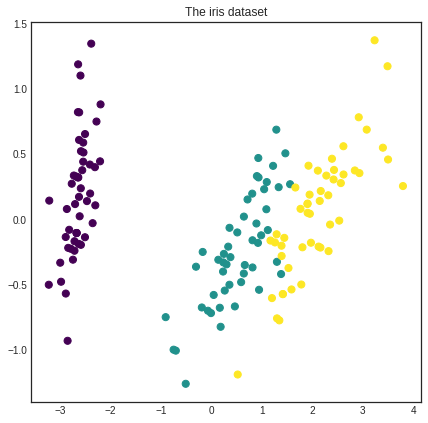

In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.decomposition import PCA
from sklearn.datasets import load_iris

# loading the iris dataset
iris = load_iris()

# visualizing the classes
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(7, 7))
    pca = PCA(n_components=2).fit_transform(iris['data'])
    plt.scatter(x=pca[:, 0], y=pca[:, 1], c=iris['target'], cmap='viridis', s=50)
    plt.title('The iris dataset')
    plt.show()


### Initializing the Committee

In this example, we are going to use the ``Committee`` class from ``modAL.models``. Its interface is almost exactly identical to the
``ActiveLearner``. Upon initialization, ``Committee`` requires a list of active learners. First, we generate the pool of unlabeled data.

In [ ]:
from copy import deepcopy

# generate the pool
X_pool = deepcopy(iris['data'])
y_pool = deepcopy(iris['target'])

Now we are ready to initialize the ```Committee```. For this, we need a list of ```ActiveLearner``` objects, which we will define now.

In [ ]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from modAL.models import ActiveLearner, Committee

# initializing Committee members
n_members = 2
learner_list = list()

for member_idx in range(n_members):
    # initial training data
    n_initial = 2
    train_idx = np.random.choice(range(X_pool.shape[0]), size=n_initial, replace=False)
    X_train = X_pool[train_idx]
    y_train = y_pool[train_idx]

    # creating a reduced copy of the data with the known instances removed
    X_pool = np.delete(X_pool, train_idx, axis=0)
    y_pool = np.delete(y_pool, train_idx)

    # initializing learner
    learner = ActiveLearner(
        estimator=RandomForestClassifier(),
        X_training=X_train, y_training=y_train
    )
    learner_list.append(learner)

# assembling the committee
committee = Committee(learner_list=learner_list)

/home/namazu/.local/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


As you can see, the various hypotheses (which are taking the form of ActiveLearners) can be quite different.

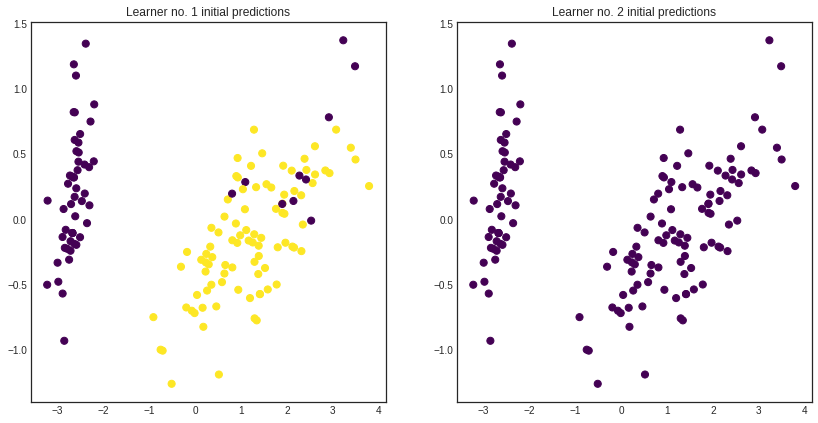

In [ ]:
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(n_members*7, 7))
    for learner_idx, learner in enumerate(committee):
        plt.subplot(1, n_members, learner_idx + 1)
        plt.scatter(x=pca[:, 0], y=pca[:, 1], c=learner.predict(iris['data']), cmap='viridis', s=50)
        plt.title('Learner no. %d initial predictions' % (learner_idx + 1))
    plt.show()

Prediction is done by averaging the class probabilities for each learner and chosing the most likely class.

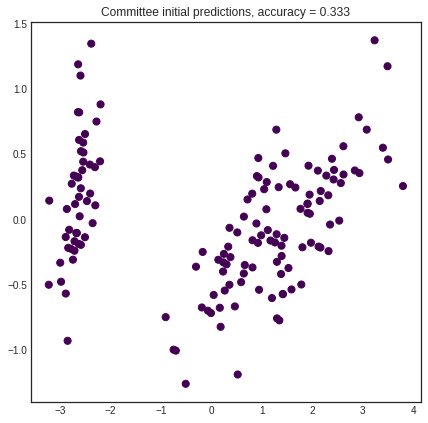

In [ ]:
unqueried_score = committee.score(iris['data'], iris['target'])

with plt.style.context('seaborn-white'):
    plt.figure(figsize=(7, 7))
    prediction = committee.predict(iris['data'])
    plt.scatter(x=pca[:, 0], y=pca[:, 1], c=prediction, cmap='viridis', s=50)
    plt.title('Committee initial predictions, accuracy = %1.3f' % unqueried_score)
    plt.show()

### Active learning

The active learning loop is the same as for the ``ActiveLearner``.

In [ ]:
performance_history = [unqueried_score]

# query by committee
n_queries = 20
for idx in range(n_queries):
    query_idx, query_instance = committee.query(X_pool)
    committee.teach(
        X=X_pool[query_idx].reshape(1, -1),
        y=y_pool[query_idx].reshape(1, )
    )
    performance_history.append(committee.score(iris['data'], iris['target']))
    # remove queried instance from pool
    X_pool = np.delete(X_pool, query_idx, axis=0)
    y_pool = np.delete(y_pool, query_idx)

After a few queries, the hypotheses straighten out their disagreements and they reach consensus. Prediction accuracy is greatly improved in this case.

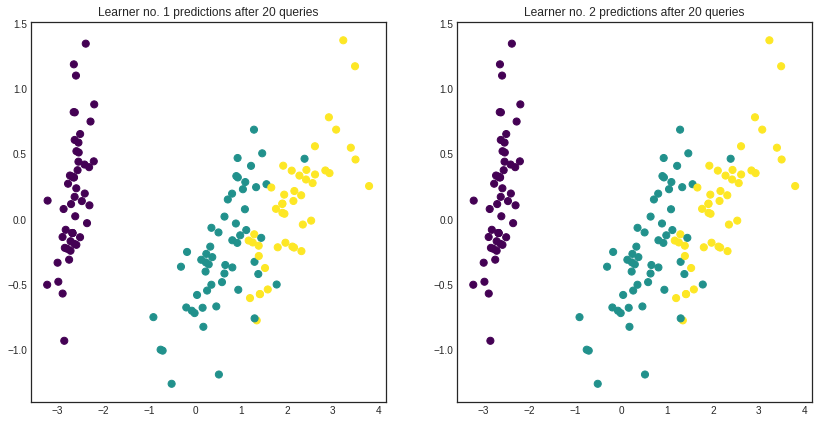

In [ ]:
# visualizing the final predictions per learner
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(n_members*7, 7))
    for learner_idx, learner in enumerate(committee):
        plt.subplot(1, n_members, learner_idx + 1)
        plt.scatter(x=pca[:, 0], y=pca[:, 1], c=learner.predict(iris['data']), cmap='viridis', s=50)
        plt.title('Learner no. %d predictions after %d queries' % (learner_idx + 1, n_queries))
    plt.show()

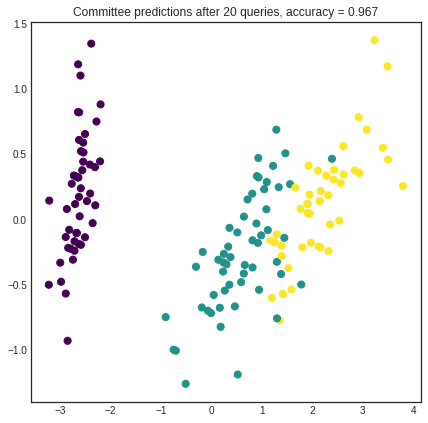

In [ ]:
# visualizing the Committee's predictions
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(7, 7))
    prediction = committee.predict(iris['data'])
    plt.scatter(x=pca[:, 0], y=pca[:, 1], c=prediction, cmap='viridis', s=50)
    plt.title('Committee predictions after %d queries, accuracy = %1.3f'
              % (n_queries, committee.score(iris['data'], iris['target'])))
    plt.show()

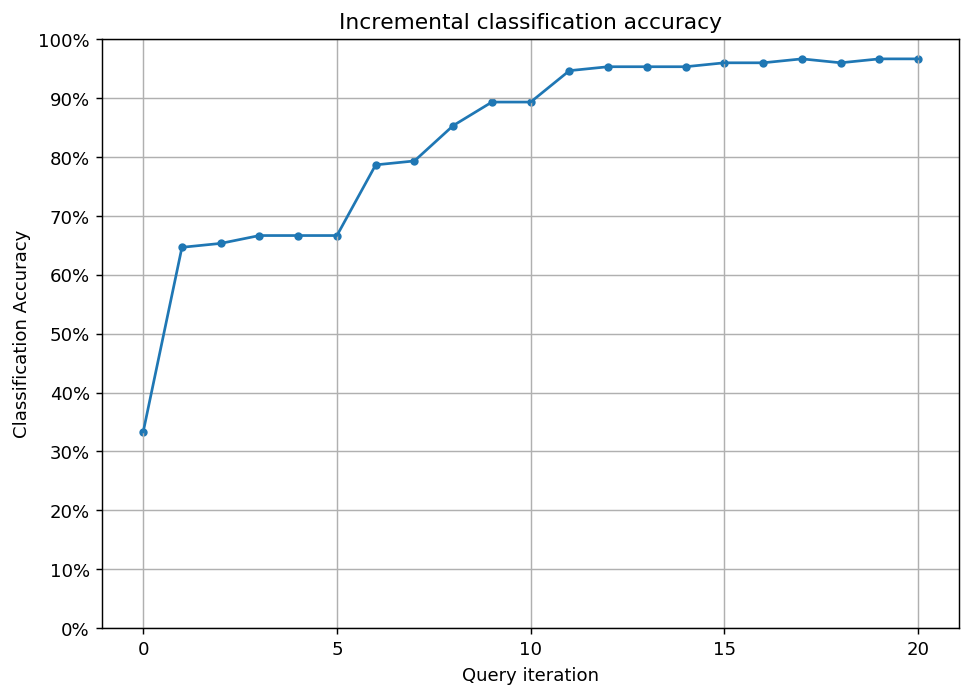

In [ ]:
# Plot our performance over time.
fig, ax = plt.subplots(figsize=(8.5, 6), dpi=130)

ax.plot(performance_history)
ax.scatter(range(len(performance_history)), performance_history, s=13)

ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=5, integer=True))
ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=10))
ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(xmax=1))

ax.set_ylim(bottom=0, top=1)
ax.grid(True)

ax.set_title('Incremental classification accuracy')
ax.set_xlabel('Query iteration')
ax.set_ylabel('Classification Accuracy')

plt.show()

## Bootstrapping and bagging


Bootstrapping and bagging can be very useful when using ensemble models such as the Committee. In essence, bootstrapping is random sampling with replacement from the available training data. Bagging (= bootstrap aggregation) is performing it many times and training an estimator for each bootstrapped dataset. It is available in modAL for both the base ActiveLearner model and the Committee model as well. In this short tutorial, we are going to see how to perform bootstrapping and bagging in your active learning workflow.

The executable script for this example can be [found here](https://github.com/cosmic-cortex/modAL/blob/master/examples/bagging.py)!

To enforce a reproducible result across runs, we set a random seed.

In [ ]:
import numpy as np

# Set our RNG seed for reproducibility.
RANDOM_STATE_SEED = 123
np.random.seed(RANDOM_STATE_SEED)

### The dataset

In this short example, we will try to learn the shape of three black disks on a white background.

In [ ]:
import numpy as np
from itertools import product

# creating the dataset
im_width = 500
im_height = 500
data = np.zeros((im_height, im_width))
# each disk is coded as a triple (x, y, r), where x and y are the centers and r is the radius
disks = [(150, 150, 80), (200, 380, 50), (360, 200, 100)]
for i, j in product(range(im_width), range(im_height)):
    for x, y, r in disks:
        if (x-i)**2 + (y-j)**2 < r**2:
            data[i, j] = 1

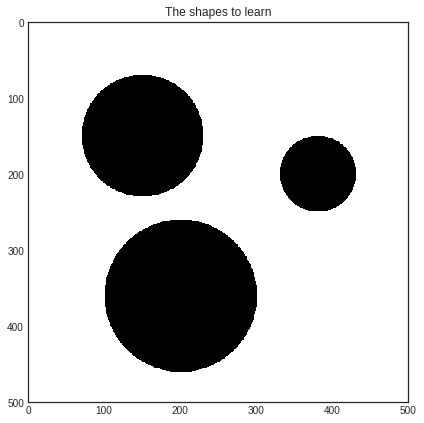

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

# visualizing the dataset
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(7, 7))
    plt.imshow(data)
    plt.title('The shapes to learn')
    plt.show()

### Initializing the learners with bootstrapping

First we shall train three ActiveLearners on a bootstrapped dataset. Then we are going to bundle them together in a Committee and see how bagging is done with modAL.

In [ ]:
# create the pool from the image
X_pool = np.transpose(
    [np.tile(np.asarray(range(data.shape[0])), data.shape[1]),
     np.repeat(np.asarray(range(data.shape[1])), data.shape[0])]
)
# map the intensity values against the grid
y_pool = np.asarray([data[P[0], P[1]] for P in X_pool])

# initial training data
initial_idx = np.random.choice(range(len(X_pool)), size=500)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from modAL.models import ActiveLearner, Committee

# initializing the learners
n_learners = 3
learner_list = []
for _ in range(n_learners):
    learner = ActiveLearner(
        estimator=KNeighborsClassifier(n_neighbors=10),
        X_training=X_pool[initial_idx], y_training=y_pool[initial_idx],
        bootstrap_init=True
    )
    learner_list.append(learner)

As you can see, the main difference in this from the regular use of ActiveLearner is passing ``bootstrap_init=True`` upon initialization. This makes it to train the model on a bootstrapped dataset, although it stores the *complete* training dataset among its known examples. In this exact case, here is how the classifiers perform:

We can put our learners together in a Committee and see how they perform.

In [ ]:
# assembling the Committee
committee = Committee(learner_list)

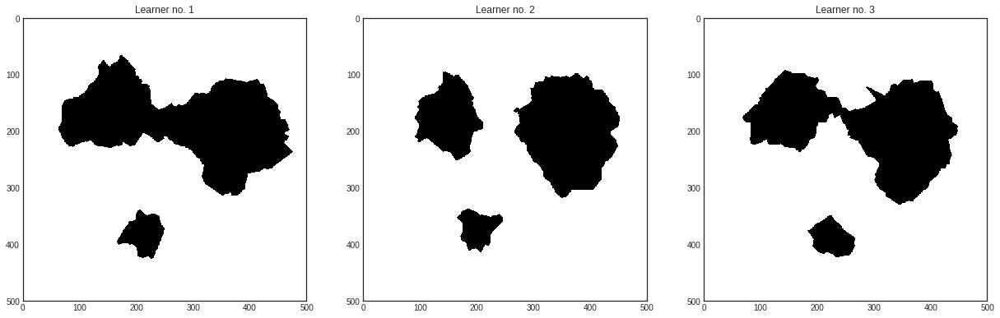

In [ ]:
# visualizing every learner in the Committee
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(7*n_learners, 7))
    for learner_idx, learner in enumerate(committee):
        plt.subplot(1, n_learners, learner_idx+1)
        plt.imshow(learner.predict(X_pool).reshape(im_height, im_width))
        plt.title('Learner no. %d' % (learner_idx + 1))
    plt.show()

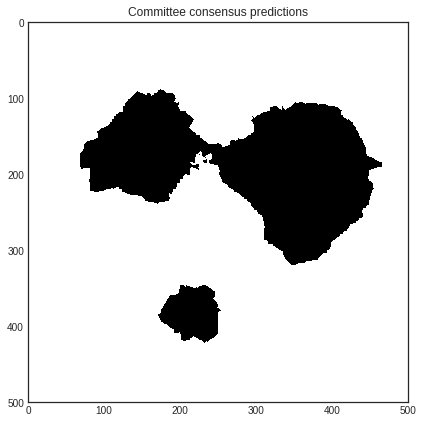

In [ ]:
# visualizing the Committee's predictions
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(7, 7))
    plt.imshow(committee.predict(X_pool).reshape(im_height, im_width))
    plt.title('Committee consensus predictions')
    plt.show()

### Bagging


If you would like to take each learner in the Committee and retrain them using bagging, you can use the ``.rebag()`` method:

In [ ]:
committee.rebag()

In this case, the classifiers perform in the following way after
rebagging.

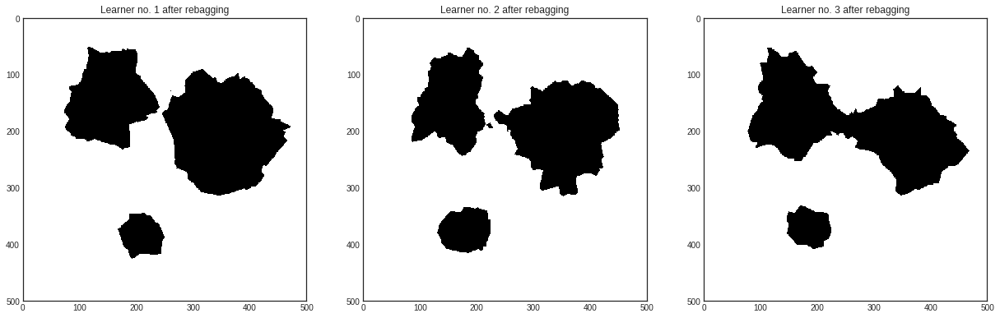

In [ ]:
# visualizing the learners in the retrained Committee
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(7*n_learners, 7))
    for learner_idx, learner in enumerate(committee):
        plt.subplot(1, n_learners, learner_idx+1)
        plt.imshow(learner.predict(X_pool).reshape(im_height, im_width))
        plt.title('Learner no. %d after rebagging' % (learner_idx + 1))
    plt.show()


## Keras models in modAL workflows


Thanks for the scikit-learn API of Keras, you can seamlessly integrate Keras models into your modAL workflow. In this tutorial, we shall quickly introduce how to use the scikit-learn API of Keras and we are going to see how to do active learning with it. More details on the Keras scikit-learn API [can be found here](https://keras.io/scikit-learn-api/).

The executable script for this example can be [found here](https://github.com/cosmic-cortex/modAL/blob/master/examples/keras_integration.py)!

### Keras' scikit-learn API


By default, a Keras model's interface differs from what is used for scikit-learn estimators. However, with the use of its scikit-learn wrapper, it is possible to adapt your model.

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from keras.wrappers.scikit_learn import KerasClassifier

# build function for the Keras' scikit-learn API
def create_keras_model():
    """
    This function compiles and returns a Keras model.
    Should be passed to KerasClassifier in the Keras scikit-learn API.
    """

    model = Sequential()
    model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(28, 28, 1)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(10, activation='softmax'))

    model.compile(loss='categorical_crossentropy', optimizer='adadelta', metrics=['accuracy'])

    return model

/home/namazu/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


For our purposes, the ``classifier`` which we will initialize now acts just like any scikit-learn estimator.

In [ ]:
# create the classifier
classifier = KerasClassifier(create_keras_model)

### Active learning with Keras


In this example, we are going to use the famous MNIST dataset, which is available as a built-in for Keras.

In [ ]:
import numpy as np
from keras.datasets import mnist

# read training data
(X_train, y_train), (X_test, y_test) = mnist.load_data()
X_train = X_train.reshape(60000, 28, 28, 1).astype('float32') / 255
X_test = X_test.reshape(10000, 28, 28, 1).astype('float32') / 255
y_train = keras.utils.to_categorical(y_train, 10)
y_test = keras.utils.to_categorical(y_test, 10)

# assemble initial data
n_initial = 1000
initial_idx = np.random.choice(range(len(X_train)), size=n_initial, replace=False)
X_initial = X_train[initial_idx]
y_initial = y_train[initial_idx]

# generate the pool
# remove the initial data from the training dataset
X_pool = np.delete(X_train, initial_idx, axis=0)[:5000]
y_pool = np.delete(y_train, initial_idx, axis=0)[:5000]

Active learning with data and classifier ready is as easy as always. Because training is *very* expensive in large neural networks, this time we are going to query the best 200 instances each time we measure the uncertainty of the pool.

In [ ]:
from modAL.models import ActiveLearner

# initialize ActiveLearner
learner = ActiveLearner(
    estimator=classifier,
    X_training=X_initial, y_training=y_initial,
    verbose=1
)

Epoch 1/1
1000/1000 [==============================] - 4s 4ms/step - loss: 1.5794 - acc: 0.4790


To make sure that you train only on newly queried labels, pass ``only_new=True`` to the ``.teach()`` method of the learner.

In [ ]:
# the active learning loop
n_queries = 10
for idx in range(n_queries):
    print('Query no. %d' % (idx + 1))
    query_idx, query_instance = learner.query(X_pool, n_instances=100, verbose=0)
    learner.teach(
        X=X_pool[query_idx], y=y_pool[query_idx], only_new=True,
        verbose=1
    )
    # remove queried instance from pool
    X_pool = np.delete(X_pool, query_idx, axis=0)
    y_pool = np.delete(y_pool, query_idx, axis=0)

Query no. 1
Epoch 1/1
100/100 [==============================] - 1s 10ms/step - loss: 2.0987 - acc: 0.3300
Query no. 2
Epoch 1/1
100/100 [==============================] - 1s 7ms/step - loss: 2.1222 - acc: 0.3300
Query no. 3
Epoch 1/1
100/100 [==============================] - 1s 8ms/step - loss: 2.0558 - acc: 0.4900
Query no. 4
Epoch 1/1
100/100 [==============================] - 1s 9ms/step - loss: 1.6943 - acc: 0.4700
Query no. 5
Epoch 1/1
100/100 [==============================] - 1s 12ms/step - loss: 1.5865 - acc: 0.6200
Query no. 6
Epoch 1/1
100/100 [==============================] - 1s 14ms/step - loss: 1.8714 - acc: 0.3500
Query no. 7
Epoch 1/1
100/100 [==============================] - 1s 14ms/step - loss: 1.3940 - acc: 0.6700
Query no. 8
Epoch 1/1
100/100 [==============================] - 1s 14ms/step - loss: 2.1033 - acc: 0.3200
Query no. 9
Epoch 1/1
100/100 [==============================] - 1s 11ms/step - loss: 1.5666 - acc: 0.6700
Query no. 10
Epoch 1/1
100/100 [========

## Pytorch models in modAL workflows


Thanks to Skorch API, you can seamlessly integrate Pytorch models into your modAL workflow. In this tutorial, we shall quickly introduce how to use Skorch API of Keras and we are going to see how to do active learning with it. More details on the Keras scikit-learn API [can be found here](https://skorch.readthedocs.io/en/stable/).

The executable script for this example can be [found here](https://github.com/cosmic-cortex/modAL/blob/master/examples/pytorch_integration.py)!

### Skorch API


By default, a Pytorch model's interface differs from what is used for scikit-learn estimators. However, with the use of Skorch wrapper, it is possible to adapt your model.

In [ ]:
import torch
from torch import nn
from skorch import NeuralNetClassifier

# build class for the skorch API
class Torch_Model(nn.Module):
    def __init__(self,):
        super(Torch_Model, self).__init__()
        self.convs = nn.Sequential(
                                nn.Conv2d(1,32,3),
                                nn.ReLU(),
                                nn.Conv2d(32,64,3),
                                nn.ReLU(),
                                nn.MaxPool2d(2),
                                nn.Dropout(0.25)
        )
        self.fcs = nn.Sequential(
                                nn.Linear(12*12*64,128),
                                nn.ReLU(),
                                nn.Dropout(0.5),
                                nn.Linear(128,10),
        )

    def forward(self, x):
        out = x
        out = self.convs(out)
        out = out.view(-1,12*12*64)
        out = self.fcs(out)
        return out

For our purposes, the ``classifier`` which we will initialize now acts just like any scikit-learn estimator.

In [ ]:
# create the classifier
device = "cuda" if torch.cuda.is_available() else "cpu"
classifier = NeuralNetClassifier(Torch_Model,
                                 criterion=nn.CrossEntropyLoss,
                                 optimizer=torch.optim.Adam,
                                 train_split=None,
                                 verbose=1,
                                 device=device)

### Active learning with Pytorch

In this example, we are going to use the famous MNIST dataset, which is available as a built-in for PyTorch.

In [ ]:
import numpy as np
from torch.utils.data import DataLoader
from torchvision.transforms import ToTensor
from torchvision.datasets import MNIST


mnist_data = MNIST('.', download=True, transform=ToTensor())
dataloader = DataLoader(mnist_data, shuffle=True, batch_size=60000)
X, y = next(iter(dataloader))

# read training data
X_train, X_test, y_train, y_test = X[:50000], X[50000:], y[:50000], y[50000:]
X_train = X_train.reshape(50000, 1, 28, 28)
X_test = X_test.reshape(10000, 1, 28, 28)

# assemble initial data
n_initial = 1000
initial_idx = np.random.choice(range(len(X_train)), size=n_initial, replace=False)
X_initial = X_train[initial_idx]
y_initial = y_train[initial_idx]

# generate the pool
# remove the initial data from the training dataset
X_pool = np.delete(X_train, initial_idx, axis=0)[:5000]
y_pool = np.delete(y_train, initial_idx, axis=0)[:5000]

0it [00:00, ?it/s]

 97%|█████████▋| 9584640/9912422 [00:15<00:00, 1777143.52it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz



0it [00:00, ?it/s]


 57%|█████▋    | 16384/28881 [00:00<00:00, 62622.03it/s]
32768it [00:00, 41627.01it/s]                           
0it [00:00, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz



  0%|          | 0/1648877 [00:00<?, ?it/s]

Active learning with data and classifier ready is as easy as always. Because training is *very* expensive in large neural networks, this time we are going to query the best 200 instances each time we measure the uncertainty of the pool.

In [ ]:
from modAL.models import ActiveLearner

# initialize ActiveLearner
learner = ActiveLearner(
    estimator=classifier,
    X_training=X_initial, y_training=y_initial,
)

To make sure that you train only on newly queried labels, pass ``only_new=True`` to the ``.teach()`` method of the learner.

In [ ]:
# the active learning loop
n_queries = 10
for idx in range(n_queries):
    print('Query no. %d' % (idx + 1))
    query_idx, query_instance = learner.query(X_pool, n_instances=100)
    learner.teach(
        X=X_pool[query_idx], y=y_pool[query_idx], only_new=True,
    )
    # remove queried instance from pool
    X_pool = np.delete(X_pool, query_idx, axis=0)
    y_pool = np.delete(y_pool, query_idx, axis=0)

## Robert Munro Human in the Loop Learning Book

**TODO**: include code from https://github.com/rmunro/pytorch_active_learning, and integrate section with notebook.

This section includes Active Learning topics as organised in the [Human in the Loop Learning book](https://www.manning.com/books/human-in-the-loop-machine-learning#ref).

### Diversity Sampling

- Model-based Outliers: sampling for low activation in your logits and hidden layers to find items that are confusing to your model because of lack of information
- Cluster-based Sampling: using Unsupervised Machine Learning to sample data from all the meaningful trends in your data’s feature-space
- Representative Sampling: sampling items that are the most representative of the target domain for your model, relative to your current training data
- Real-World Diversity: using sampling strategies that increase fairness when trying to support real-world diversity- 


https://towardsdatascience.com/https-towardsdatascience-com-diversity-sampling-cheatsheet-32619693c304

### Uncertainty Sampling

When a Supervised Machine Learning model makes a prediction, it often gives a confidence in that prediction. If the model is uncertain (low confidence), then human feedback can help. Getting human feedback when a model is uncertain is a type of Active Learning known as Uncertainty Sampling.
The four types of Uncertainty Sampling covered in the cheatsheet are:
- Least Confidence: difference between the most confident prediction and 100% confidence
- Margin of Confidence: difference between the top two most confident predictions
- Ratio of Confidence: ratio between the top two most confident predictions
- Entropy: difference between all predictions, as defined by information theory


https://towardsdatascience.com/uncertainty-sampling-cheatsheet-ec57bc067c0b

## Active Transfer Learning

[Active Transfer Learning](https://medium.com/pytorch/active-transfer-learning-with-pytorch-71ed889f08c1)

**TODO**

Integrate https://github.com/rmunro/pytorch_active_learning/blob/master/advanced_active_learning.py into section. Using BERT and pre-trained image model would be idea.

## GANs and Semi-Supervised Learning for Active Learning and Data Augmentation

**TODO** integrate with classification example

- [Generative Adversarial Active Learning
](https://arxiv.org/abs/1702.07956), [code](https://github.com/leibinghe/GAAL-based-outlier-detection)

- [Adversarial Sampling for Active Learning](https://openaccess.thecvf.com/content_WACV_2020/papers/Mayer_Adversarial_Sampling_for_Active_Learning_WACV_2020_paper.pdf)

- [Mean teachers are better role models: Weight-averaged consistency targets improve semi-supervised deep learning results](https://arxiv.org/abs/1703.01780), [code](https://github.com/CuriousAI/mean-teacher)

- [GAN Data Augmentation Through Active Learning Inspired Sample Acquisition ](https://openaccess.thecvf.com/content_CVPRW_2019/papers/Uncertainty%20and%20Robustness%20in%20Deep%20Visual%20Learning/Nielsen_GAN_Data_Augmentation_Through_Active_Learning_Inspired_Sample_Acquisition_CVPRW_2019_paper.pdf), [code](https://github.com/AntreasAntoniou/DAGAN)

# Adaptive Learning and Bayesian Optimization

Adaptive experimentation is the machine-learning guided process of iteratively exploring a (possibly infinite) parameter space in order to identify optimal configurations in a resource-efficient manner. [Ax](https://github.com/facebook/Ax) currently supports Bayesian optimization and bandit optimization as exploration strategies. Bayesian optimization in Ax is powered by [BoTorch](https://github.com/pytorch/botorch
), a modern library for Bayesian optimization research built on PyTorch.

[Facebook AI post on Ax/BOTorch](https://ai.facebook.com/blog/open-sourcing-ax-and-botorch-new-ai-tools-for-adaptive-experimentation/).

[Eytan Backshy paper(s) on BOTorch](https://proceedings.neurips.cc/paper/2020/hash/f5b1b89d98b7286673128a5fb112cb9a-Abstract.html)

We will be following the tutorials on the [Ax tutorial page](https://ax.dev/tutorials/). 

**TODO**: replace all with one (or two) tutorials with Ax.

The 3 API tutorials: Loop, Service, and Developer — are a good place to start. Each tutorial showcases optimization on a constrained Hartmann6 problem, with the Loop API being the simplest to use and the Developer API being the most customizable.

The HARTMANN 6-dimensional function can be found [here](https://www.sfu.ca/~ssurjano/hart6.html), which is the optimsation problem being attempted in the first tutorial.


## Loop API Example on Hartmann6

The loop API is the most lightweight way to do optimization in Ax. The user makes one call to `optimize`, which performs all of the optimization under the hood and returns the optimized parameters.

For more customizability of the optimization procedure, consider the Service or Developer API.

In [ ]:
import numpy as np

from ax.plot.contour import plot_contour
from ax.plot.trace import optimization_trace_single_method
from ax.service.managed_loop import optimize
from ax.metrics.branin import branin
from ax.utils.measurement.synthetic_functions import hartmann6
from ax.utils.notebook.plotting import render, init_notebook_plotting

init_notebook_plotting()

[INFO 05-07 12:56:33] ipy_plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.


### 1. Define evaluation function

First, we define an evaluation function that is able to compute all the metrics needed for this experiment. This function needs to accept a set of parameter values and can also accept a weight. It should produce a dictionary of metric names to tuples of mean and standard error for those metrics.

In [ ]:
def hartmann_evaluation_function(parameterization):
    x = np.array([parameterization.get(f"x{i+1}") for i in range(6)])
    # In our case, standard error is 0, since we are computing a synthetic function.
    return {"hartmann6": (hartmann6(x), 0.0), "l2norm": (np.sqrt((x ** 2).sum()), 0.0)}

If there is only one metric in the experiment – the objective – then evaluation function can return a single tuple of mean and SEM, in which case Ax will assume that evaluation corresponds to the objective. It can also return only the mean as a float, in which case Ax will treat SEM as unknown and use a model that can infer it. For more details on evaluation function, refer to the "Trial Evaluation" section in the docs.

### 2. Run optimization
The setup for the loop is fully compatible with JSON. The optimization algorithm is selected based on the properties of the problem search space.

In [ ]:
best_parameters, values, experiment, model = optimize(
    parameters=[
        {
            "name": "x1",
            "type": "range",
            "bounds": [0.0, 1.0],
            "value_type": "float",  # Optional, defaults to inference from type of "bounds".
            "log_scale": False,  # Optional, defaults to False.
        },
        {
            "name": "x2",
            "type": "range",
            "bounds": [0.0, 1.0],
        },
        {
            "name": "x3",
            "type": "range",
            "bounds": [0.0, 1.0],
        },
        {
            "name": "x4",
            "type": "range",
            "bounds": [0.0, 1.0],
        },
        {
            "name": "x5",
            "type": "range",
            "bounds": [0.0, 1.0],
        },
        {
            "name": "x6",
            "type": "range",
            "bounds": [0.0, 1.0],
        },
    ],
    experiment_name="test",
    objective_name="hartmann6",
    evaluation_function=hartmann_evaluation_function,
    minimize=True,  # Optional, defaults to False.
    parameter_constraints=["x1 + x2 <= 20"],  # Optional.
    outcome_constraints=["l2norm <= 1.25"],  # Optional.
    total_trials=30, # Optional.
)

[INFO 05-07 12:56:33] ax.modelbridge.dispatch_utils: Using Bayesian Optimization generation strategy. Iterations after 6 will take longer to generate due to model-fitting.
[INFO 05-07 12:56:33] ax.service.managed_loop: Started full optimization with 30 steps.
[INFO 05-07 12:56:33] ax.service.managed_loop: Running optimization trial 1...
[INFO 05-07 12:56:33] ax.service.managed_loop: Running optimization trial 2...
[INFO 05-07 12:56:33] ax.service.managed_loop: Running optimization trial 3...
[INFO 05-07 12:56:33] ax.service.managed_loop: Running optimization trial 4...
[INFO 05-07 12:56:33] ax.service.managed_loop: Running optimization trial 5...
[INFO 05-07 12:56:33] ax.service.managed_loop: Running optimization trial 6...
[INFO 05-07 12:56:33] ax.service.managed_loop: Running optimization trial 7...
[INFO 05-07 12:56:43] ax.service.managed_loop: Running optimization trial 8...
[INFO 05-07 12:56:54] ax.service.managed_loop: Running optimization trial 9...
[INFO 05-07 12:57:06] ax.serv

And we can introspect optimization results:

In [ ]:
best_parameters

{'x1': 0.4216336684550585,
 'x2': 0.9077372149314975,
 'x3': 0.3153028268916916,
 'x4': 0.5733001784328788,
 'x5': 0.2680636783388968,
 'x6': 0.06285915210168797}

In [ ]:
means, covariances = values
means

{'l2norm': 1.2270530489376026, 'hartmann6': -3.0942722656221813}

For comparison, minimum of Hartmann6 is:

In [ ]:
hartmann6.fmin

-3.32237

### 3. Plot results
Here we arbitrarily select "x1" and "x2" as the two parameters to plot for both metrics, "hartmann6" and "l2norm".

In [ ]:
render(plot_contour(model=model, param_x='x1', param_y='x2', metric_name='hartmann6'))

In [ ]:
render(plot_contour(model=model, param_x='x1', param_y='x2', metric_name='l2norm'))

We also plot optimization trace, which shows best hartmann6 objective value seen by each iteration of the optimization:

In [ ]:
# `plot_single_method` expects a 2-d array of means, because it expects to average means from multiple 
# optimization runs, so we wrap out best objectives array in another array.
best_objectives = np.array([[trial.objective_mean for trial in experiment.trials.values()]])
best_objective_plot = optimization_trace_single_method(
    y=np.minimum.accumulate(best_objectives, axis=1),
    optimum=hartmann6.fmin,
    title="Model performance vs. # of iterations",
    ylabel="Hartmann6",
)
render(best_objective_plot)

## Service and Developer Ax Tutorials

Because they are a little more involved, we provide links to the tutorials for more functionality on the Hartmann6 problem.

- [Service API Example on Hartmann6](https://colab.research.google.com/drive/1IYoRdrogZAjIy59ap_BNgd0x-4ZzSZc0?usp=sharing)
- [Developer API Example on Hartmann6](https://colab.research.google.com/drive/10IpArYt4363hKtPGN1D3rfxU0_3ARNaa?usp=sharing)

## Tune a CNN on MNIST

This tutorial walks through using Ax to tune two hyperparameters (learning rate and momentum) for a PyTorch CNN on the MNIST dataset trained using SGD with momentum.


In [ ]:
import torch
import numpy as np

from ax.plot.contour import plot_contour
from ax.plot.trace import optimization_trace_single_method
from ax.service.managed_loop import optimize
from ax.utils.notebook.plotting import render, init_notebook_plotting
from ax.utils.tutorials.cnn_utils import load_mnist, train, evaluate, CNN

init_notebook_plotting()

[INFO 08-09 10:30:59] ipy_plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.


In [ ]:
torch.manual_seed(12345)
dtype = torch.float
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### 1. Load MNIST data
First, we need to load the MNIST data and partition it into training, validation, and test sets.

Note: this will download the dataset if necessary.

In [ ]:
BATCH_SIZE = 512
train_loader, valid_loader, test_loader = load_mnist(batch_size=BATCH_SIZE)

### 2. Define function to optimize
In this tutorial, we want to optimize classification accuracy on the validation set as a function of the learning rate and momentum. The function takes in a parameterization (set of parameter values), computes the classification accuracy, and returns a dictionary of metric name ('accuracy') to a tuple with the mean and standard error.

In [ ]:
def train_evaluate(parameterization):
    net = CNN()
    net = train(net=net, train_loader=train_loader, parameters=parameterization, dtype=dtype, device=device)
    return evaluate(
        net=net,
        data_loader=valid_loader,
        dtype=dtype,
        device=device,
    )

### 3. Run the optimization loop
Here, we set the bounds on the learning rate and momentum and set the parameter space for the learning rate to be on a log scale. 

In [ ]:
best_parameters, values, experiment, model = optimize(
    parameters=[
        {"name": "lr", "type": "range", "bounds": [1e-6, 0.4], "log_scale": True},
        {"name": "momentum", "type": "range", "bounds": [0.0, 1.0]},
    ],
    evaluation_function=train_evaluate,
    objective_name='accuracy',
)

[INFO 08-09 10:32:05] ax.modelbridge.dispatch_utils: Using Bayesian Optimization generation strategy. Iterations after 5 will take longer to generate due to model-fitting.
[INFO 08-09 10:32:05] ax.service.managed_loop: Started full optimization with 20 steps.
[INFO 08-09 10:32:05] ax.service.managed_loop: Running optimization trial 1...
[INFO 08-09 10:32:40] ax.service.managed_loop: Running optimization trial 2...
[INFO 08-09 10:33:03] ax.service.managed_loop: Running optimization trial 3...
[INFO 08-09 10:33:26] ax.service.managed_loop: Running optimization trial 4...
[INFO 08-09 10:33:50] ax.service.managed_loop: Running optimization trial 5...
[INFO 08-09 10:34:13] ax.service.managed_loop: Running optimization trial 6...
[INFO 08-09 10:34:41] ax.service.managed_loop: Running optimization trial 7...
[INFO 08-09 10:35:11] ax.service.managed_loop: Running optimization trial 8...
[INFO 08-09 10:35:48] ax.service.managed_loop: Running optimization trial 9...
[INFO 08-09 10:36:26] ax.serv

We can introspect the optimal parameters and their outcomes:

In [ ]:
best_parameters

{'lr': 0.0006307873441197164, 'momentum': 0.39064412336820153}

In [ ]:
means, covariances = values
means, covariances

({'accuracy': 0.9366666468920226},
 {'accuracy': {'accuracy': 6.466514231853397e-09}})

### 4. Plot response surface

Contour plot showing classification accuracy as a function of the two hyperparameters.

The black squares show points that we have actually run, notice how they are clustered in the optimal region.

In [ ]:
render(plot_contour(model=model, param_x='lr', param_y='momentum', metric_name='accuracy'))

### 5. Plot best objective as function of the iteration

Show the model accuracy improving as we identify better hyperparameters.

In [ ]:
# `plot_single_method` expects a 2-d array of means, because it expects to average means from multiple 
# optimization runs, so we wrap out best objectives array in another array.
best_objectives = np.array([[trial.objective_mean*100 for trial in experiment.trials.values()]])
best_objective_plot = optimization_trace_single_method(
    y=np.maximum.accumulate(best_objectives, axis=1),
    title="Model performance vs. # of iterations",
    ylabel="Classification Accuracy, %",
)
render(best_objective_plot)

### 6. Train CNN with best hyperparameters and evaluate on test set
Note that the resulting accuracy on the test set might not be exactly the same as the maximum accuracy achieved on the evaluation set throughout optimization. 

In [ ]:
data = experiment.fetch_data()
df = data.df
best_arm_name = df.arm_name[df['mean'] == df['mean'].max()].values[0]
best_arm = experiment.arms_by_name[best_arm_name]
best_arm

Arm(name='18_0', parameters={'lr': 0.0006307873441197164, 'momentum': 0.39064412336820153})

In [ ]:
combined_train_valid_set = torch.utils.data.ConcatDataset([
    train_loader.dataset.dataset, 
    valid_loader.dataset.dataset,
])
combined_train_valid_loader = torch.utils.data.DataLoader(
    combined_train_valid_set, 
    batch_size=BATCH_SIZE, 
    shuffle=True,
)

In [ ]:
net = train(
    net=CNN(),
    train_loader=combined_train_valid_loader, 
    parameters=best_arm.parameters,
    dtype=dtype,
    device=device,
)
test_accuracy = evaluate(
    net=net,
    data_loader=test_loader,
    dtype=dtype,
    device=device,
)

In [ ]:
print(f"Classification Accuracy (test set): {round(test_accuracy*100, 2)}%")

Classification Accuracy (test set): 97.8%


## Multi-task Bayesian Optimization

This tutorial uses synthetic functions to illustrate Bayesian optimization using a multi-task Gaussian Process in Ax. A typical use case is optimizing an expensive-to-evaluate (online) system with supporting (offline) simulations of that system.

Bayesian optimization with a multi-task kernel (Multi-task Bayesian optimization) is described by Swersky et al.  (2013). Letham and Bakshy (2019) describe using multi-task Bayesian optimization to tune a ranking system with a mix of online and offline (simulator) experiments.

This tutorial produces the results of Online Appendix 2 from [that paper](https://arxiv.org/pdf/1904.01049.pdf).

The synthetic problem used here is to maximize the Hartmann 6 function, a classic optimization test problem in 6 dimensions. The objective is treated as unknown and are modeled with separate GPs. The objective is noisy.

Throughout the optimization we can make nosiy observations directly of the objective (an online observation), and we can make noisy observations of a biased version of the objective (offline observations). Bias is simulated by passing the function values through a piecewise linear function. Offline observations are much less time-consuming than online observations, so we wish to use them to improve our ability to optimize the online objective.

In [ ]:
from copy import deepcopy
import numpy as np
import pandas as pd
from scipy.stats import norm
import time

from ax.core.data import Data
from ax.core.observation import ObservationFeatures, observations_from_data
from ax.core.optimization_config import OptimizationConfig
from ax.core.search_space import SearchSpace
from ax.core.objective import Objective
from ax.runners.synthetic import SyntheticRunner
from ax.modelbridge.random import RandomModelBridge
from ax.core.types import ComparisonOp
from ax.core.parameter import RangeParameter, ParameterType
from ax.core.multi_type_experiment import MultiTypeExperiment
from ax.metrics.hartmann6 import Hartmann6Metric
from ax.metrics.l2norm import L2NormMetric
from ax.modelbridge.factory import get_sobol, get_GPEI, get_MTGP
from ax.core.generator_run import GeneratorRun
from ax.plot.diagnostic import interact_batch_comparison
from ax.plot.trace import optimization_trace_all_methods
from ax.utils.notebook.plotting import init_notebook_plotting, render

init_notebook_plotting()

[INFO 01-25 17:53:37] ax.utils.notebook.plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.


### 1. Define Metric classes
For this example, the online system is optimizing a Hartmann6 function. The Metric objects for these are directly imported above. We create analagous offline versions of this metrics which are identical but have a transform applied (a piecewise linear function). We construct Metric objects for each of them.

In [ ]:
# Create metric with artificial offline bias, for the objective
# by passing the true values through a piecewise linear function.

class OfflineHartmann6Metric(Hartmann6Metric):
    def f(self, x: np.ndarray) -> float:
        raw_res = super().f(x)
        m = -0.35
        if raw_res < m:
            return (1.5* (raw_res - m)) + m
        else:
            return (6.0 * (raw_res - m)) + m

### 2. Create experiment

A MultiTypeExperiment is used for managing online and offline trials together. It is constructed in several steps:

1. <b> Create the search space</b> - This is done in the usual way.
2. <b>Specify optimization config</b> - Also done in the usual way.
3. <b>Initialize Experiment</b> - In addition to the search_space and optimization_config, specify that "online" is the default trial_type. This is the main trial type for which we're optimizing. Optimization metrics are defined to be for this type and new trials assume this trial type by default.
4. <b>Establish offline trial_type</b> - Register the "offline" trial type and specify how to deploy trials of this type.
5. <b>Add offline metrics</b> - Create the offline metrics and add them to the experiment. When adding the metrics, we need to specify the trial type ("offline") and online metric name it is associated with so the model can link them.

Finally, because this is a synthetic benchmark problem where the true function values are known, we will also register metrics with the true (noiseless) function values for plotting below.

In [ ]:
def get_experiment(include_true_metric=True):
    noise_sd = 0.1  # Observations will have this much Normal noise added to them
    
    # 1. Create simple search space for [0,1]^d, d=6
    param_names = [f"x{i}" for i in range(6)]
    parameters=[
        RangeParameter(
            name=param_names[i], parameter_type=ParameterType.FLOAT, lower=0.0, upper=1.0
        )
        for i in range(6)
    ]
    search_space=SearchSpace(parameters=parameters)
    
    # 2. Specify optimization config
    online_objective = Hartmann6Metric("objective", param_names=param_names, noise_sd=noise_sd)
    opt_config = OptimizationConfig(objective=Objective(online_objective, minimize=True))
    
    # 3. Init experiment
    exp = MultiTypeExperiment(
        name="mt_exp",
        search_space=search_space,
        default_trial_type="online",
        default_runner=SyntheticRunner(),
        optimization_config=opt_config,
    )
    
    # 4. Establish offline trial_type, and how those trials are deployed
    exp.add_trial_type("offline", SyntheticRunner())
    
    # 5. Add offline metrics that provide biased estimates of the online metrics
    offline_objective = OfflineHartmann6Metric("offline_objective", param_names=param_names, noise_sd=noise_sd)
    # Associate each offline metric with corresponding online metric
    exp.add_tracking_metric(metric=offline_objective, trial_type="offline", canonical_name="objective")
    
    return exp

### 3. Vizualize the simulator bias

These figures compare the online measurements to the offline measurements on a random set of points, for the objective metric. You can see the offline measurements are biased but highly correlated. This produces Fig. S3 from the paper.

In [ ]:
# Generate 50 points from a Sobol sequence
exp = get_experiment(include_true_metric=False)
s = get_sobol(exp.search_space, scramble=False)
gr = s.gen(50)
# Deploy them both online and offline
exp.new_batch_trial(trial_type="online", generator_run=gr).run()
exp.new_batch_trial(trial_type="offline", generator_run=gr).run()
# Fetch data
data = exp.fetch_data()
observations = observations_from_data(exp, data)
# Plot the arms in batch 0 (online) vs. batch 1 (offline)
render(interact_batch_comparison(observations, exp, 1, 0))

### 4. The Bayesian optimization loop

Here we construct a Bayesian optimization loop that interleaves online and offline batches. The loop defined here is described in Algorithm 1 of the paper. We compare multi-task Bayesian optimization to regular Bayesian optimization using only online observations.

Here we measure performance over 3 repetitions of the loop. Each one takes 1-2 hours so the whole benchmark run will take several hours to complete.

In [ ]:
# Settings for the optimization benchmark.

# This should be changed to 50 to reproduce the results from the paper.
n_reps = 3  # Number of repeated experiments, each with independent observation noise

n_init_online = 5  # Size of the quasirandom initialization run online
n_init_offline = 20  # Size of the quasirandom initialization run offline
n_opt_online = 5  # Batch size for BO selected points to be run online
n_opt_offline = 20  # Batch size for BO selected to be run offline
n_batches = 3  # Number of optimized BO batches

#### 4a. Optimization with online observations only
For the online-only case, we run `n_init_online` sobol points followed by `n_batches` batches of `n_opt_online` points selected by the GP. This is a normal Bayesian optimization loop.

In [ ]:
# This function runs a Bayesian optimization loop, making online observations only.
def run_online_only_bo():
    t1 = time.time()
    ### Do BO with online only
    ## Quasi-random initialization
    exp_online = get_experiment()
    m = get_sobol(exp_online.search_space, scramble=False)
    gr = m.gen(n=n_init_online)
    exp_online.new_batch_trial(trial_type="online", generator_run=gr).run()
    ## Do BO
    for b in range(n_batches):
        print('Online-only batch', b, time.time() - t1)
        # Fit the GP
        m = get_GPEI(
            experiment=exp_online,
            data=exp_online.fetch_data(),
            search_space=exp_online.search_space,
        )
        # Generate the new batch
        gr = m.gen(
            n=n_opt_online,
            search_space=exp_online.search_space,
            optimization_config=exp_online.optimization_config,
        )
        exp_online.new_batch_trial(trial_type="online", generator_run=gr).run()

#### 4b. Multi-task Bayesian optimization
Here we incorporate offline observations to accelerate the optimization, while using the same total number of online observations as in the loop above. The strategy here is that outlined in Algorithm 1 of the paper.

1. <b> Initialization</b> - Run `n_init_online` Sobol points online, and `n_init_offline` Sobol points offline.
2. <b> Fit model </b> - Fit an MTGP to both online and offline observations.
3. <b> Generate candidates </b> - Generate `n_opt_offline` candidates using NEI.
4. <b> Launch offline batch </b> - Run the `n_opt_offline` candidates offline and observe their offline metrics.
5. <b> Update model </b> - Update the MTGP with the new offline observations.
6. <b> Select points for online batch </b> - Select the best (maximum utility) `n_opt_online` of the NEI candidates, after incorporating their offline observations, and run them online.
7. <b> Update model and repeat </b> - Update the model with the online observations, and repeat from step 3 for the next batch.

In [ ]:
# Online batches are constructed by selecting the maximum utility points from the offline
# batch, after updating the model with the offline results. This function selects the max utility points according
# to the MTGP predictions.
def max_utility_from_GP(n, m, experiment, search_space, gr):
    obsf = []
    for arm in gr.arms:
        params = deepcopy(arm.parameters)
        params['trial_type'] = 'online'
        obsf.append(ObservationFeatures(parameters=params))
    # Make predictions
    f, cov = m.predict(obsf)
    # Compute expected utility
    u = -np.array(f['objective']) 
    best_arm_indx = np.flip(np.argsort(u))[:n]
    gr_new = GeneratorRun(
        arms = [
            gr.arms[i] for i in best_arm_indx
        ],
        weights = [1.] * n,
    )
    return gr_new

# This function runs a multi-task Bayesian optimization loop, as outlined in Algorithm 1 and above.
def run_mtbo():
    t1 = time.time()
    online_trials = []
    ## 1. Quasi-random initialization, online and offline
    exp_multitask = get_experiment()
    # Online points
    m = get_sobol(exp_multitask.search_space, scramble=False)
    gr = m.gen(
        n=n_init_online,
    )
    tr = exp_multitask.new_batch_trial(trial_type="online", generator_run=gr)
    tr.run()
    online_trials.append(tr.index)
    # Offline points
    m = get_sobol(exp_multitask.search_space, scramble=False)
    gr = m.gen(
        n=n_init_offline,
    )
    exp_multitask.new_batch_trial(trial_type="offline", generator_run=gr).run()
    ## Do BO
    for b in range(n_batches):
        print('Multi-task batch', b, time.time() - t1)
        # (2 / 7). Fit the MTGP
        m = get_MTGP(
            experiment=exp_multitask,
            data=exp_multitask.fetch_data(),
            search_space=exp_multitask.search_space,
        )

        # 3. Finding the best points for the online task
        gr = m.gen(
            n=n_opt_offline,
            optimization_config=exp_multitask.optimization_config,
            fixed_features=ObservationFeatures(parameters={}, trial_index=online_trials[-1]),
        )

        # 4. But launch them offline
        exp_multitask.new_batch_trial(trial_type="offline", generator_run=gr).run()
        
        # 5. Update the model
        m = get_MTGP(
            experiment=exp_multitask,
            data=exp_multitask.fetch_data(),
            search_space=exp_multitask.search_space,
        )
        
        # 6. Select max-utility points from the offline batch to generate an online batch
        gr = max_utility_from_GP(
            n=n_opt_online,
            m=m,
            experiment=exp_multitask,
            search_space=exp_multitask.search_space,
            gr=gr,
        )
        tr = exp_multitask.new_batch_trial(trial_type="online", generator_run=gr)
        tr.run()
        online_trials.append(tr.index)

#### 4c. Run both loops
Run both Bayesian optimization loops and aggregate results.

In [ ]:
runners = {
    'GP, online only': run_online_only_bo,
    'MTGP': run_mtbo,
}
for rep in range(n_reps):
    print('Running rep', rep)
    for k, r in runners.items():
        r()
   

Running rep 0
Online-only batch 0 0.003924131393432617
Online-only batch 1 4.754389762878418
Online-only batch 2 14.453584909439087
Multi-task batch 0 0.008440256118774414
Multi-task batch 1 43.99668550491333
Multi-task batch 2 107.73957896232605
Running rep 1
Online-only batch 0 0.0035865306854248047
Online-only batch 1 5.526342153549194
Online-only batch 2 13.878161430358887
Multi-task batch 0 0.010107278823852539
Multi-task batch 1 55.25851607322693
Multi-task batch 2 121.53834533691406
Running rep 2
Online-only batch 0 0.003439188003540039
Online-only batch 1 4.926270246505737
Online-only batch 2 17.45656704902649
Multi-task batch 0 0.008320093154907227
Multi-task batch 1 58.37909746170044
Multi-task batch 2 120.14849185943604


#### References
Benjamin Letham and Eytan Bakshy. Bayesian optimization for policy search via online-offline experimentation. _arXiv preprint arXiv:1603.09326_, 2019.

Kevin Swersky, Jasper Snoek, and Ryan P Adams.  Multi-task Bayesian optimization.  In _Advances in Neural Information Processing Systems_ 26, NIPS, pages 2004–2012, 2013.

## Factorial design with empirical Bayes and Thompson Sampling

<markdowncell>
This tutorial illustrates how to run a factorial experiment. In such an experiment, each parameter (factor) can be assigned one of multiple discrete values (levels). A full-factorial experiment design explores all possible combinations of factors and levels.

For instance, consider a banner with a title and an image. We are considering two different titles and three different images. A full-factorial experiment will compare all 2*3=6 possible combinations of title and image, to see which version of the banner performs the best.

In this example, we first run an exploratory batch to collect data on all possible combinations. Then we use empirical Bayes to model the data and shrink noisy estimates toward the mean. Next, we use Thompson Sampling to suggest a set of arms (combinations of factors and levels) on which to collect more data. We repeat the process until we have identified the best performing combination(s).

In [ ]:
import numpy as np
import pandas as pd
import sklearn as skl
from typing import Dict, Optional, Tuple, Union
from ax import Arm, ChoiceParameter, Models, ParameterType, SearchSpace, SimpleExperiment
from ax.plot.scatter import plot_fitted
from ax.utils.notebook.plotting import render, init_notebook_plotting
from ax.utils.stats.statstools import agresti_coull_sem

In [ ]:
init_notebook_plotting()

[INFO 01-24 07:41:25] ipy_plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.


### 1. Define the search space

<markdowncell>
First, we define our search space. A factorial search space contains a ChoiceParameter for each factor, where the values of the parameter are its levels.

In [ ]:
search_space = SearchSpace(
    parameters=[
        ChoiceParameter(
            name="factor1",
            parameter_type=ParameterType.STRING,
            values=["level11", "level12", "level13"],
        ),
        ChoiceParameter(
            name="factor2",
            parameter_type=ParameterType.STRING,
            values=["level21", "level22"],
        ),
        ChoiceParameter(
            name="factor3",
            parameter_type=ParameterType.STRING,
            values=["level31", "level32", "level33", "level34"],
        ),
    ]
)

### 2. Define the evaluation function

<markdowncell>
Second, we define an evaluation function, which is responsible for computing
the mean and standard error of a given arm.

In this example, each possible parameter value is given a coefficient. The higher the level, the higher the coefficient, and the higher the coefficients, the greater the mean.

The standard error of each arm is determined by the weight passed into the evaluation function, which represents the size of the population on which this arm was evaluated. The higher the weight, the greater the sample size, and thus the lower the standard error.

In [ ]:
one_hot_encoder = skl.preprocessing.OneHotEncoder(
    categories=[par.values for par in search_space.parameters.values()], 
)

def factorial_evaluation_function(
    # `parameterization` is a dict of parameter names to values of those parameters.
    parameterization: Dict[str, Optional[Union[str, bool, float]]],
    # `weight` is the weight of the parameterization, 
    # which is used to determine the variance of the estimate.
    weight: Optional[float] = None,
) -> Dict[str, Tuple[float, float]]:  # Mapping of metric names to tuple of mean and standard error.
    batch_size = 10000
    noise_level = 0.0
    weight = weight if weight is not None else 1.0
    coefficients = np.array([
        0.1, 0.2, 0.3,
        0.1, 0.2,
        0.1, 0.2, 0.3, 0.4
    ])
    features = np.array(list(parameterization.values())).reshape(1, -1)
    encoded_features = one_hot_encoder.fit_transform(features)
    z = coefficients @ encoded_features.T + np.sqrt(noise_level) * np.random.randn()
    p = np.exp(z) / (1 + np.exp(z))
    plays = np.random.binomial(batch_size, weight)
    successes = np.random.binomial(plays, p)
    mean = float(successes) / plays
    sem = agresti_coull_sem(successes, plays)
    return {
        "success_metric": (mean, sem)
    }

### 3. Define the experiment

<markdowncell>
We now set up our experiment and define the status quo arm, in which each parameter is assigned to the lowest level.

In [ ]:
exp = SimpleExperiment(
    name="my_factorial_closed_loop_experiment",
    search_space=search_space,
    evaluation_function=factorial_evaluation_function,
    objective_name="success_metric",
)
exp.status_quo = Arm(
    parameters={"factor1": "level11", "factor2": "level21", "factor3": "level31"}
)

### 4. Run an exploratory batch

<markdowncell>
We then generate an a set of arms that covers the full space of the factorial design, including the status quo. There are three parameters, with two, three, and four values, respectively, so there are 24 possible arms.

In [ ]:
factorial = Models.FACTORIAL(search_space=exp.search_space)
factorial_run = factorial.gen(n=-1)  # Number of arms to generate is derived from the search space.
print(len(factorial_run.arms))

24


Now we create a trial including all of these arms, so that we can collect data and evaluate the performance of each.

In [ ]:
trial = (
    exp.new_batch_trial(optimize_for_power=True)
    .add_generator_run(factorial_run, multiplier=1)
)

By default, the weight of each arm in `factorial_run` will be 1. However, to optimize for power on the contrasts of `k` groups against the status quo, the status quo should be `sqrt(k)` larger than any of the treatment groups. Since we have 24 different arms in our search space, the status quo should be roughly five times larger. That larger weight is automatically set by Ax under the hood if `optimize_for_power` kwarg is set to True on new batched trial creation.

In [ ]:
trial._status_quo_weight_override

4.795831523312719

### 5. Iterate using Thompson Sampling

<markdowncell>
Next, we run multiple trials (iterations of the experiment) to hone in on the optimal arm(s). 

In each iteration, we first collect data about all arms in that trial by calling `exp.eval_trial()`. Then we run Thompson Sampling, which assigns a weight to each arm that is proportional to the probability of that arm being the best. Arms whose weight exceed `min_weight` are added to the next trial, so that we can gather more data on their performance.

In [ ]:
models = []
for i in range(4):
    print(f"Running trial {i+1}...")
    data = exp.eval_trial(trial)
    thompson = Models.THOMPSON(
        experiment=exp, data=data, min_weight=0.01
    )
    models.append(thompson)
    thompson_run = thompson.gen(n=-1)
    trial = exp.new_batch_trial(optimize_for_power=True).add_generator_run(thompson_run)

Running trial 1...
Running trial 2...
Running trial 3...
Running trial 4...


### Plot 1: Predicted outcomes for each arm in initial trial

<markdowncell>
The plot below shows the mean and standard error for each arm in the first trial. We can see that the standard error for the status quo is the smallest, since this arm was assigned 5x weight.

In [ ]:
render(plot_fitted(models[0], metric="success_metric", rel=False))

### Plot 2: Predicted outcomes for arms in last trial

The following plot below shows the mean and standard error for each arm that made it to the last trial (as well as the status quo, which appears throughout). 

In [ ]:
render(plot_fitted(models[-1], metric="success_metric", rel=False))

<markdowncell>
As expected given our evaluation function, arms with higher levels
perform better and are given higher weight. Below we see the arms
that made it to the final trial.

In [ ]:
results = pd.DataFrame(
    [
        {"values": ",".join(arm.parameters.values()), "weight": weight}
        for arm, weight in trial.normalized_arm_weights().items()
    ]
)
print(results)

                    values  weight
0  level13,level22,level34  0.4661
1  level12,level21,level34  0.0339
2  level11,level21,level31  0.5000


### Plot 3: Rollout Process

We can also visualize the progression of the experience in the following rollout chart. Each bar represents a trial, and the width of the bands within a bar are proportional to the weight of the arms in that trial. 

In the first trial, all arms appear with equal weight, except for the status quo. By the last trial, we have narrowed our focus to only four arms, with arm 0_22 (the arm with the highest levels) having the greatest weight.

In [ ]:
from ax.plot.bandit_rollout import plot_bandit_rollout
from ax.utils.notebook.plotting import render

render(plot_bandit_rollout(exp))

### Plot 4: Marginal Effects

Finally, we can examine which parameter values had the greatest effect on the overall arm value. As we see in the diagram below, arms whose parameters were assigned the lower level values (such as `levell1`, `levell2`, `level31` and `level32`) performed worse than average, whereas arms with higher levels performed better than average.

In [ ]:
from ax.plot.marginal_effects import plot_marginal_effects
render(plot_marginal_effects(models[0], 'success_metric'))

## Using Ax for Human-in-the-loop Experimentation¶

While Ax can be used in as a fully automated service, generating and deploying candidates Ax can be also used in a trial-by-trial fashion, allowing for human oversight. 

Typically, human intervention in Ax is necessary when there are clear tradeoffs between multiple metrics of interest. Condensing multiple outcomes of interest into a single scalar quantity can be really challenging. Instead, it can be useful to specify an objective and constraints, and tweak these based on the information from the experiment. 

To facilitate this, Ax provides the following key features:

1. Constrained optimization
2. Interfaces for easily modifying optimization goals
3. Utilities for visualizing and deploying new trials composed of multiple optimizations. 


In this tutorial, we'll demonstrate how Ax enables users to explore these tradeoffs. With an understanding of the tradeoffs present in our data, we'll then make use of the constrained optimization utilities to generate candidates from multiple different optimization objectives, and create a conglomerate batch, with all of these candidates in together in one trial. 

### Experiment Setup

For this tutorial, we will assume our experiment has already been created.

In [ ]:
from ax import Data, Metric, OptimizationConfig, Objective, OutcomeConstraint, ComparisonOp, load
from ax.modelbridge.cross_validation import cross_validate
from ax.modelbridge.factory import get_GPEI
from ax.plot.diagnostic import tile_cross_validation
from ax.plot.scatter import plot_multiple_metrics, tile_fitted
from ax.utils.notebook.plotting import render, init_notebook_plotting

import pandas as pd

init_notebook_plotting()

[INFO 04-25 19:56:20] ipy_plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.


In [ ]:
experiment = load('hitl_exp.json')

### Initial Sobol Trial

Bayesian Optimization experiments almost always begin with a set of random points. In this experiment, these points were chosen via a Sobol sequence, accessible via the `ModelBridge` factory.

A collection of points run and analyzed together form a `BatchTrial`. A `Trial` object provides metadata pertaining to the deployment of these points, including details such as when they were deployed, and the current status of their experiment. 

Here, we see an initial experiment has finished running (COMPLETED status).

In [ ]:
experiment.trials[0]

BatchTrial(experiment_name='human_in_the_loop_tutorial', index=0, status=TrialStatus.COMPLETED)

In [ ]:
experiment.trials[0].time_created

datetime.datetime(2019, 3, 29, 18, 10, 6)

In [ ]:
# Number of arms in first experiment, including status_quo
len(experiment.trials[0].arms)

65

In [ ]:
# Sample arm configuration
experiment.trials[0].arms[0]

Arm(name='0_0', parameters={'x_excellent': 0.9715802669525146, 'x_good': 0.8615524768829346, 'x_moderate': 0.7668091654777527, 'x_poor': 0.34871453046798706, 'x_unknown': 0.7675797343254089, 'y_excellent': 2.900710028409958, 'y_good': 1.5137152910232545, 'y_moderate': 0.6775947093963622, 'y_poor': 0.4974367544054985, 'y_unknown': 1.0852564811706542, 'z_excellent': 517803.49761247635, 'z_good': 607874.5171427727, 'z_moderate': 1151881.2023103237, 'z_poor': 2927449.2621421814, 'z_unknown': 2068407.6935052872})

### Experiment Analysis

**Optimization Config**

An important construct for analyzing an experiment is an OptimizationConfig. An OptimizationConfig contains an objective, and outcome constraints. Experiment's can have a default OptimizationConfig, but models can also take an OptimizationConfig as input independent of the default.

**Objective:** A metric to optimize, along with a direction to optimize (default: maximize)

**Outcome Constraint:** A metric to constrain, along with a constraint direction (<= or >=), as well as a bound. 

Let's start with a simple OptimizationConfig. By default, our objective metric will be maximized, but can be minimized by setting the `minimize` flag. Our outcome constraint will, by default, be evaluated as a relative percentage change. This percentage change is computed relative to the experiment's status quo arm. 

In [ ]:
experiment.status_quo

Arm(name='status_quo', parameters={'x_excellent': 0.0, 'x_good': 0.0, 'x_moderate': 0.0, 'x_poor': 0.0, 'x_unknown': 0.0, 'y_excellent': 1.0, 'y_good': 1.0, 'y_moderate': 1.0, 'y_poor': 1.0, 'y_unknown': 1.0, 'z_excellent': 1000000.0, 'z_good': 1000000.0, 'z_moderate': 1000000.0, 'z_poor': 1000000.0, 'z_unknown': 1000000.0})

In [ ]:
objective_metric = Metric(name="metric_1")
constraint_metric = Metric(name="metric_2")

experiment.optimization_config = OptimizationConfig(
    objective=Objective(objective_metric),
    outcome_constraints=[
        OutcomeConstraint(metric=constraint_metric, op=ComparisonOp.LEQ, bound=5),
    ]
)

**Data**

Another critical piece of analysis is data itself! Ax data follows a standard format, shown below. This format is imposed upon the underlying data structure, which is a Pandas DataFrame. 

A key set of fields are required for all data, for use with Ax models. 

It's a good idea to double check our data before fitting models -- let's make sure all of our expected metrics and arms are present.

In [ ]:
data = Data(pd.read_json('hitl_data.json'))
data.df.head()

,arm_name,trial_index,end_time,mean,metric_name,n,sem,start_time
0,0_1,0,2019-04-03,495.763048,metric_1,1599994,2.621641,2019-03-30
1,0_23,0,2019-04-03,524.367712,metric_1,1596356,2.731647,2019-03-30
2,0_56,0,2019-04-03,21.876150,metric_2,1600291,0.071854,2019-03-30
3,0_42,0,2019-04-03,533.299510,metric_1,1601500,2.819843,2019-03-30
4,0_43,0,2019-04-03,21.338491,metric_2,1599307,0.069433,2019-03-30


In [ ]:
data.df['arm_name'].unique()

array(['0_1', '0_23', '0_56', '0_42', '0_43', '0_25', '0_44', '0_45',
       'status_quo', '0_46', '0_27', '0_47', '0_48', '0_26', '0_49',
       '0_12', '0_5', '0_50', '0_51', '0_52', '0_0', '0_57', '0_58',
       '0_13', '0_59', '0_14', '0_6', '0_60', '0_61', '0_53', '0_62',
       '0_63', '0_7', '0_28', '0_15', '0_16', '0_17', '0_18', '0_19',
       '0_29', '0_2', '0_20', '0_21', '0_22', '0_54', '0_3', '0_30',
       '0_8', '0_10', '0_31', '0_24', '0_32', '0_33', '0_34', '0_35',
       '0_55', '0_36', '0_37', '0_38', '0_9', '0_39', '0_4', '0_11',
       '0_40', '0_41'], dtype=object)

In [ ]:
data.df['metric_name'].unique()

array(['metric_1', 'metric_2'], dtype=object)

**Search Space** 

The final component necessary for human-in-the-loop optimization is a SearchSpace. A SearchSpace defines the feasible region for our parameters, as well as their types.

Here, we have both parameters and a set of constraints on those parameters. 

Without a SearchSpace, our models are unable to generate new candidates. By default, the models will read the search space off of the experiment, when they are told to generate candidates. SearchSpaces can also be specified by the user at this time. Sometimes, the first round of an experiment is too restrictive--perhaps the experimenter was too cautious when defining their initial ranges for exploration! In this case, it can be useful to generate candidates from new, expanded search spaces, beyond that specified in the experiment.  

In [ ]:
experiment.search_space.parameters

{'x_excellent': RangeParameter(name='x_excellent', parameter_type=FLOAT, range=[0.0, 1.0]),
 'x_good': RangeParameter(name='x_good', parameter_type=FLOAT, range=[0.0, 1.0]),
 'x_moderate': RangeParameter(name='x_moderate', parameter_type=FLOAT, range=[0.0, 1.0]),
 'x_poor': RangeParameter(name='x_poor', parameter_type=FLOAT, range=[0.0, 1.0]),
 'x_unknown': RangeParameter(name='x_unknown', parameter_type=FLOAT, range=[0.0, 1.0]),
 'y_excellent': RangeParameter(name='y_excellent', parameter_type=FLOAT, range=[0.1, 3.0]),
 'y_good': RangeParameter(name='y_good', parameter_type=FLOAT, range=[0.1, 3.0]),
 'y_moderate': RangeParameter(name='y_moderate', parameter_type=FLOAT, range=[0.1, 3.0]),
 'y_poor': RangeParameter(name='y_poor', parameter_type=FLOAT, range=[0.1, 3.0]),
 'y_unknown': RangeParameter(name='y_unknown', parameter_type=FLOAT, range=[0.1, 3.0]),
 'z_excellent': RangeParameter(name='z_excellent', parameter_type=FLOAT, range=[50000.0, 5000000.0]),
 'z_good': RangeParameter(name

In [ ]:
experiment.search_space.parameter_constraints

[OrderConstraint(x_poor <= x_moderate),
 OrderConstraint(x_moderate <= x_good),
 OrderConstraint(x_good <= x_excellent),
 OrderConstraint(y_poor <= y_moderate),
 OrderConstraint(y_moderate <= y_good),
 OrderConstraint(y_good <= y_excellent)]

### Model Fit

Fitting BoTorch's GPEI will allow us to predict new candidates based on our first Sobol batch. 
Here, we make use of the default settings for GP-EI defined in the ModelBridge factory. 

In [ ]:
gp = get_GPEI(
    experiment=experiment,
    data=data,
)

We can validate the model fits using cross validation, shown below for each metric of interest. Here, our model fits leave something to be desired--the tail ends of each metric are hard to model. In this situation, there are three potential actions to take: 

1. Increase the amount of traffic in this experiment, to reduce the measurement noise.
2. Increase the number of points run in the random batch, to assist the GP in covering the space.
3. Reduce the number of parameters tuned at one time. 

However, away from the tail effects, the fits do show a strong correlations, so we will proceed with candidate generation. 

In [ ]:
cv_result = cross_validate(gp)
render(tile_cross_validation(cv_result))

The parameters from the initial batch have a wide range of effects on the metrics of interest, as shown from the outcomes from our fitted GP model. 

In [ ]:
render(tile_fitted(gp, rel=True))

In [ ]:
METRIC_X_AXIS = 'metric_1'
METRIC_Y_AXIS = 'metric_2'

render(plot_multiple_metrics(
    gp,
    metric_x=METRIC_X_AXIS,
    metric_y=METRIC_Y_AXIS,
))

### Candidate Generation

With our fitted GPEI model, we can optimize EI (Expected Improvement) based on any optimization config.
We can start with our initial optimization config, and aim to simply maximize the playback smoothness, without worrying about the constraint on quality. 

In [ ]:
unconstrained = gp.gen(
    n=3,
    optimization_config=OptimizationConfig(
        objective=Objective(objective_metric),
    )
)

Let's plot the tradeoffs again, but with our new arms. 

In [ ]:
render(plot_multiple_metrics(
    gp,
    metric_x=METRIC_X_AXIS,
    metric_y=METRIC_Y_AXIS,
    generator_runs_dict={
        'unconstrained': unconstrained,
    }
))

### Change Objectives

With our unconstrained optimization, we generate some candidates which are pretty promising with respect to our objective! However, there is a clear regression in our constraint metric, above our initial 5% desired constraint. Let's add that constraint back in.  

In [ ]:
constraint_5 = OutcomeConstraint(metric=constraint_metric, op=ComparisonOp.LEQ, bound=5)
constraint_5_results = gp.gen(
    n=3, 
    optimization_config=OptimizationConfig(
        objective=Objective(objective_metric),
        outcome_constraints=[constraint_5]
    )
)

This yields a *GeneratorRun*, which contains points according to our specified optimization config, along with metadata about how the points were generated. Let's plot the tradeoffs in these new points. 

In [ ]:
from ax.plot.scatter import plot_multiple_metrics
render(plot_multiple_metrics(
    gp,
    metric_x=METRIC_X_AXIS,
    metric_y=METRIC_Y_AXIS,
    generator_runs_dict={
        'constraint_5': constraint_5_results
    }
))

It is important to note that the treatment of constraints in GP EI is probabilistic. The acquisition function weights our objective by the probability that each constraint is feasible. Thus, we may allow points with a very small probability of violating the constraint to be generated, as long as the chance of the points increasing our objective is high enough. 

You can see above that the point estimate for each point is significantly below a 5% increase in the constraint metric, but that there is uncertainty in our prediction, and the tail probabilities do include probabilities of small regressions beyond 5%. 

In [ ]:
constraint_1 = OutcomeConstraint(metric=constraint_metric, op=ComparisonOp.LEQ, bound=1)
constraint_1_results = gp.gen(
    n=3, 
    optimization_config=OptimizationConfig(
        objective=Objective(objective_metric),
        outcome_constraints=[constraint_1],
    )
)

In [ ]:
render(plot_multiple_metrics(
    gp,
    metric_x=METRIC_X_AXIS,
    metric_y=METRIC_Y_AXIS,
    generator_runs_dict={
        "constraint_1": constraint_1_results,
    }
))

Finally, let's view all three sets of candidates together. 

In [ ]:
render(plot_multiple_metrics(
    gp,
    metric_x=METRIC_X_AXIS,
    metric_y=METRIC_Y_AXIS,
    generator_runs_dict={
        'unconstrained': unconstrained,
        'loose_constraint': constraint_5_results,
        'tight_constraint': constraint_1_results,
    }
))

### Creating a New Trial

Having done the analysis and candidate generation for three different optimization configs, we can easily create a new `BatchTrial` which combines the candidates from these three different optimizations. Each set of candidates looks promising -- the point estimates are higher along both metric values than in the previous batch. However, there is still a good bit of uncertainty in our predictions. It is hard to choose between the different constraint settings without reducing this noise, so we choose to run a new trial with all three constraint settings. However, we're generally convinced that the tight constraint is too conservative. We'd still like to reduce our uncertainty in that region, but we'll only take one arm from that set.

In [ ]:
# We can add entire generator runs, when constructing a new trial. 
trial = experiment.new_batch_trial().add_generator_run(unconstrained).add_generator_run(constraint_5_results)

# Or, we can hand-pick arms. 
trial.add_arm(constraint_1_results.arms[0])

BatchTrial(experiment_name='human_in_the_loop_tutorial', index=1, status=TrialStatus.CANDIDATE)

The arms are combined into a single trial, along with the `status_quo` arm. Their generator can be accessed from the trial as well. 

In [ ]:
experiment.trials[1].arms

[Arm(name='1_0', parameters={'x_excellent': 0.7508829334076487, 'x_good': 0.40367960200772224, 'x_moderate': 0.3140989976643642, 'x_poor': 0.14559932559274122, 'x_unknown': 0.6670211538978944, 'y_excellent': 2.5425636846330546, 'y_good': 1.9418098243025033, 'y_moderate': 0.9858391295658283, 'y_poor': 0.38273584643959624, 'y_unknown': 1.5806965342880184, 'z_excellent': 4489287.686108519, 'z_good': 3540253.5809771204, 'z_moderate': 2964805.1608829396, 'z_poor': 2033780.6048510857, 'z_unknown': 2032062.1986594186}),
 Arm(name='1_1', parameters={'x_excellent': 0.6476003872239288, 'x_good': 0.31744410468794715, 'x_moderate': 0.17169895733661983, 'x_poor': 0.07453169788730113, 'x_unknown': 0.8642007362896725, 'y_excellent': 2.447230141007133, 'y_good': 1.5376602958384886, 'y_moderate': 0.6811637025094822, 'y_poor': 0.3318520722136259, 'y_unknown': 2.2510516551441038, 'z_excellent': 4072426.2914976524, 'z_good': 3806352.1749653243, 'z_moderate': 1645911.1218927982, 'z_poor': 988167.2494331661

The original `GeneratorRuns` can be accessed from within the trial as well. This is useful for later analyses, allowing introspection of the `OptimizationConfig` used for generation (as well as other information, e.g. `SearchSpace` used for generation).

In [ ]:
experiment.trials[1]._generator_run_structs

[GeneratorRunStruct(generator_run=GeneratorRun(3 arms, total weight 3.0), weight=1.0),
 GeneratorRunStruct(generator_run=GeneratorRun(3 arms, total weight 3.0), weight=1.0),
 GeneratorRunStruct(generator_run=GeneratorRun(1 arms, total weight 1.0), weight=1.0)]

Here, we can see the unconstrained set-up used for our first set of candidates.  

In [ ]:
experiment.trials[1]._generator_run_structs[0].generator_run.optimization_config

OptimizationConfig(objective=Objective(metric_name="metric_1", minimize=False), outcome_constraints=[])

## Acquisition Functions: Selection of the Next Experiment

1. Uniform random
2. Maximum entropy
(all of the BOTorch options)
3. Maximum Variation Ratios
4. Maximum Mean Standard Deviation
5. Expected Improvement
6. Noisy Expected Improvement
7. Bayesian Active Learning BALD
8. Knowledge Gradients
7. + other interesting ones: https://botorch.org/api/acquisition.html

## Surrogate Functions: Models of the Phenomenon

1. Gaussian Process
Matérn 5/2 kernels with Automatic Relevance Discovery (ARD)
https://botorch.org/docs/models
Ax / BOTorch

2. Deep Learning:
- [Toward Machine Learning-Enhanced High-Throughput Experimentation](
https://www.cell.com/trends/chemistry/fulltext/S2589-5974(20)30311-7)
- [Active learning of deep surrogates for PDEs: application to metasurface design](https://www.nature.com/articles/s41524-020-00431-2)

# Training Deep Models with Importance Sampling

- [Training Deep Models Faster with
Robust, Approximate Importance Sampling](https://papers.nips.cc/paper/2018/file/967990de5b3eac7b87d49a13c6834978-Paper.pdf)
- [Not All Samples Are Created Equal:
Deep Learning with Importance Sampling](http://proceedings.mlr.press/v80/katharopoulos18a/katharopoulos18a.pdf)

# Continual Learning - Forgetfullness in Neural Networks

(from abstract of [Overcoming catastrophic forgetting in neural networks](https://www.pnas.org/content/114/13/3521))

The ability to learn tasks in a sequential fashion is crucial to the development of artificial intelligence. Until now neural networks have not been capable of this and it has been widely thought that catastrophic forgetting is an inevitable feature of connectionist models. We show that it is possible to overcome this limitation and train networks that can maintain expertise on tasks that they have not experienced for a long time.

We recommend browsing the comments on this Stack Exchange post on [Catastrophic Forgetting](https://ai.stackexchange.com/questions/13289/are-neural-networks-prone-to-catastrophic-forgetting/13293).

This kind of neural network design is also called [progressive neural networks](https://arxiv.org/abs/1606.04671).



## A Gentle Introduction to Continual Learning in PyTorch

In this brief tutorial we will learn the basics of *Continual Learning* using *PyTorch*. We will use the standard MNIST benchmark so that you can swiftly run this notebook from anywhere!

This notebook is part of the **[Continual AI Colab](https://github.com/ContinualAI/colab)** is a repository meant for tutorials and demo running on Google Colaboratory. [Continual AI](https://www.continualai.org/) is an open research community on the topic of Continual Learning and AI! Join us today [on slack](https://continualai.herokuapp.com/)! :-D

We will start with learning over the standard *MNIST* benchmark, then we will move in the actual continual learning setting  with the *Permuted MNIST* benchmark. Let's have some fun! :-)




In [ ]:
import torch
import torch.nn as nn
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

### MNIST: Digits recognition with PyTorch 

All right, let's start then making sure we all know the basics! Let's recognize the ten handwritten digits learning from 60.000, 28x28 grayscale images.
For simplicity let's import a loading script we have already developed inside the **Continual AI Colab** repository:

In [ ]:
!git clone https://github.com/ContinualAI/colab.git continualai/colab

Cloning into 'continualai/colab'...
remote: Enumerating objects: 303, done.
remote: Counting objects: 100% (183/183), done.
remote: Compressing objects: 100% (117/117), done.
remote: Total 303 (delta 112), reused 118 (delta 61), pack-reused 120
Receiving objects: 100% (303/303), 10.26 MiB | 21.40 MiB/s, done.
Resolving deltas: 100% (154/154), done.


In [ ]:
from continualai.colab.scripts import mnist
mnist.init()

Download complete.
Save complete.



Extracting data/mnist/MNIST/raw/train-images-idx3-ubyte.gz to data/mnist/MNIST/raw




Extracting data/mnist/MNIST/raw/train-labels-idx1-ubyte.gz to data/mnist/MNIST/raw




Extracting data/mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to data/mnist/MNIST/raw




Extracting data/mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to data/mnist/MNIST/raw

Processing...
Done!


/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:502: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:143.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [ ]:
x_train, t_train, x_test, t_test = mnist.load()

print("x_train dim and type: ", x_train.shape, x_train.dtype)
print("t_train dim and type: ", t_train.shape, t_train.dtype)
print("x_test dim and type: ", x_test.shape, x_test.dtype)
print("t_test dim and type: ", t_test.shape, t_test.dtype)

x_train dim and type:  (60000, 1, 28, 28) float32
t_train dim and type:  (60000,) uint8
x_test dim and type:  (10000, 1, 28, 28) float32
t_test dim and type:  (10000,) uint8


Let's take a look at the actual images!

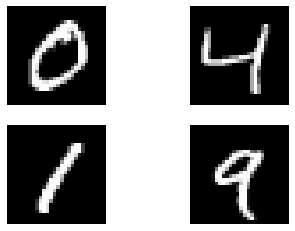

In [ ]:
f, axarr = plt.subplots(2,2)
axarr[0,0].imshow(x_train[1, 0], cmap="gray")
axarr[0,1].imshow(x_train[2, 0], cmap="gray")
axarr[1,0].imshow(x_train[3, 0], cmap="gray")
axarr[1,1].imshow(x_train[4, 0], cmap="gray")
np.vectorize(lambda ax:ax.axis('off'))(axarr);

Good! Let's now set up a few general setting before using torch...

In [ ]:
# switch to False to use CPU
use_cuda = True

use_cuda = use_cuda and torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu");
torch.manual_seed(1);

... and define our first conv-net! We will use 3 layers of convolutions and two fully connected layers:

In [ ]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 10, kernel_size=5)
        self.conv2 = nn.Conv2d(10, 20, kernel_size=5)
        self.conv2_drop = nn.Dropout2d()
        self.fc1 = nn.Linear(320, 50)
        self.fc2 = nn.Linear(50, 10)

    def forward(self, x):
        x = F.relu(F.max_pool2d(self.conv1(x), 2))
        x = F.relu(F.max_pool2d(self.conv2_drop(self.conv2(x)), 2))
        x = x.view(-1, 320)
        x = F.relu(self.fc1(x))
        x = F.dropout(x, training=self.training)
        x = self.fc2(x)
        return x

Then we can write the *train* and *test* functions. Note that for simplicity here we are not using PyTorch [Data Loaders](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html) but this is not recommended for efficiency.

In [ ]:
def train(model, device, x_train, t_train, optimizer, epoch):
    model.train()
    
    for start in range(0, len(t_train)-1, 256):
      end = start + 256
      x, y = torch.from_numpy(x_train[start:end]), torch.from_numpy(t_train[start:end]).long()
      x, y = x.to(device), y.to(device)
      
      optimizer.zero_grad()

      output = model(x)
      loss = F.cross_entropy(output, y)
      loss.backward()
      optimizer.step()
      #print(loss.item())
    print('Train Epoch: {} \tLoss: {:.6f}'.format(epoch, loss.item()))

def test(model, device, x_test, t_test):
    model.eval()
    test_loss = 0
    correct = 0
    for start in range(0, len(t_test)-1, 256):
      end = start + 256
      with torch.no_grad():
        x, y = torch.from_numpy(x_test[start:end]), torch.from_numpy(t_test[start:end]).long()
        x, y = x.to(device), y.to(device)
        output = model(x)
        test_loss += F.cross_entropy(output, y).item() # sum up batch loss
        pred = output.max(1, keepdim=True)[1] # get the index of the max logit
        correct += pred.eq(y.view_as(pred)).sum().item()

    test_loss /= len(t_test)
    print('Test set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(t_test),
        100. * correct / len(t_test)))
    return 100. * correct / len(t_test)

Then we are ready to instantiate our model and start the training!

In [ ]:
model = Net().to(device)
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

In [ ]:
for epoch in range(1, 3):
  train(model, device, x_train, t_train, optimizer, epoch)
  test(model, device, x_test, t_test)

Train Epoch: 1 	Loss: 0.760294
Test set: Average loss: 0.0013, Accuracy: 9024/10000 (90%)

Train Epoch: 2 	Loss: 0.493347
Test set: Average loss: 0.0007, Accuracy: 9435/10000 (94%)



Wow! 94% accuracy in such a short time. 

**Questions to explore:**

*   Can you find a better parametrization to improve the final accuracy?
*   Can you change the network architecture to improve the final accuracy?
*   Can you achieve the same performances with a smaller architecture?
*   What's the difference in accuracy if you change convolutions with fully connected layers?

Some tips here: http://rodrigob.github.io/are_we_there_yet/build/classification_datasets_results.html#4d4e495354

But what if now we want we the same model being able to solve a new task we encounter over time like a permuted version of the same MNIST? Let's define our custom function to permute it!

In [ ]:
def permute_mnist(mnist, seed):
    """ Given the training set, permute pixels of each img the same way. """

    np.random.seed(seed)
    print("starting permutation...")
    h = w = 28
    perm_inds = list(range(h*w))
    np.random.shuffle(perm_inds)
    # print(perm_inds)
    perm_mnist = []
    for set in mnist:
        num_img = set.shape[0]
        flat_set = set.reshape(num_img, w * h)
        perm_mnist.append(flat_set[:, perm_inds].reshape(num_img, 1, w, h))
    print("done.")
    return perm_mnist

In [ ]:
x_train2, x_test2 = permute_mnist([x_train, x_test], 0)

starting permutation...
done.


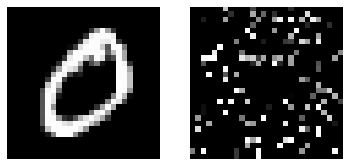

In [ ]:
f, axarr = plt.subplots(1,2)
axarr[0].imshow(x_train[1, 0], cmap="gray")
axarr[1].imshow(x_train2[2, 0], cmap="gray")
np.vectorize(lambda ax:ax.axis('off'))(axarr);

Amazing. Now let's see how our pre-trained model is working on both the original and the permuted MNIST dataset:

In [ ]:
print("Testing on the first task:")
test(model, device, x_test, t_test)

print("Testing on the second task:")
test(model, device, x_test2, t_test);

Testing on the first task:
Test set: Average loss: 0.0007, Accuracy: 9435/10000 (94%)

Testing on the second task:
Test set: Average loss: 0.0108, Accuracy: 1031/10000 (10%)



Mmmh... that's pretty bad, our model cannot generalize to this apparently very different new task! Well, we can just finetune our model using the new permuted training set!

In [ ]:
for epoch in range(1, 3):
  train(model, device, x_train2, t_train, optimizer, epoch)
  test(model, device, x_test2, t_test)

Train Epoch: 1 	Loss: 1.486630
Test set: Average loss: 0.0032, Accuracy: 7414/10000 (74%)

Train Epoch: 2 	Loss: 1.154427
Test set: Average loss: 0.0022, Accuracy: 8286/10000 (83%)



In [ ]:
print("Testing on the first task:")
test(model, device, x_test, t_test)

print("Testing on the second task:")
test(model, device, x_test2, t_test);

Testing on the first task:
Test set: Average loss: 0.0203, Accuracy: 2473/10000 (25%)

Testing on the second task:
Test set: Average loss: 0.0022, Accuracy: 8286/10000 (83%)



This is very annoying! Now we are not able to solve the original MNIST task anymore! :-( This is the phenomenon known in literature as **Catastrophic Forgetting**! In the following section we well compare three different strategies for learning continually (and trying to not forget!)

**Questions to explore:**

*   When the permuted MNIST benchmark has been firstly introduced? 
*   Can simple Dropout and Regularization techniques reduce forgetting?
*   In the permuted MNIST task, do convolutions still help increasing the accuracy?

Some tips here: https://papers.nips.cc/paper/5059-compete-to-compute

### CL Strategies

Let us now focus on some strategies for reducing catastrofic forgetting, one of the principal problems when learning continuously. in this section we will take a look at three different strategies:

1.   Naive
2.   Rehearsal
3.   Elastic Weight Consolidation (EWC)

and run it on a 3-tasks Permuted MNIST. Finally we will plot our results for comparison. For a more comprehensive overview on recent CL strategies for deep learning take a look at the recent paper "[Continuous Learning in Single-Incremental-Task Scenarios](https://arxiv.org/abs/1806.08568)".

Let's start by defining our 3 tasks with the function we have already introduced before:



In [ ]:
# task 1
task_1 = [(x_train, t_train), (x_test, t_test)]

# task 2
x_train2, x_test2 = permute_mnist([x_train, x_test], 1)
task_2 = [(x_train2, t_train), (x_test2, t_test)]

# task 3
x_train3, x_test3 = permute_mnist([x_train, x_test], 2)
task_3 = [(x_train3, t_train), (x_test3, t_test)]

# task list
tasks = [task_1, task_2, task_3]

starting permutation...
done.
starting permutation...
done.


#### Naive Strategy

The  *Naive* strategy, is the simple idea of continuing the back-prop process on the new batches/tasks. This is very simple, but at the same time very prone to forgetting as we have witnessed before. Let's how it works on three tasks:

In [ ]:
model = Net().to(device)
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

In [ ]:
naive_accs = []

for id, task in enumerate(tasks):
  avg_acc = 0
  print("Training on task: ", id)
  
  (x_train, t_train), _ = task
  
  for epoch in range(1, 2):
    train(model, device, x_train, t_train, optimizer, epoch)
    
  for id_test, task in enumerate(tasks):
    print("Testing on task: ", id_test)
    _, (x_test, t_test) = task
    acc = test(model, device, x_test, t_test)
    avg_acc = avg_acc + acc 
  
  naive_accs.append(avg_acc / 3)
  print("Avg acc: ", avg_acc / 3)
  

Training on task:  0
Train Epoch: 1 	Loss: 0.664137
Testing on task:  0
Test set: Average loss: 0.0013, Accuracy: 9028/10000 (90%)

Testing on task:  1
Test set: Average loss: 0.0113, Accuracy: 618/10000 (6%)

Testing on task:  2
Test set: Average loss: 0.0101, Accuracy: 1266/10000 (13%)

Avg acc:  36.373333333333335
Training on task:  1
Train Epoch: 1 	Loss: 1.698266
Testing on task:  0
Test set: Average loss: 0.0140, Accuracy: 1905/10000 (19%)

Testing on task:  1
Test set: Average loss: 0.0050, Accuracy: 6432/10000 (64%)

Testing on task:  2
Test set: Average loss: 0.0101, Accuracy: 1257/10000 (13%)

Avg acc:  31.98
Training on task:  2
Train Epoch: 1 	Loss: 1.598729
Testing on task:  0
Test set: Average loss: 0.0230, Accuracy: 1716/10000 (17%)

Testing on task:  1
Test set: Average loss: 0.0075, Accuracy: 3393/10000 (34%)

Testing on task:  2
Test set: Average loss: 0.0038, Accuracy: 7142/10000 (71%)

Avg acc:  40.836666666666666


**Questions to explore:**

*   Does the order of the tasks effect the final results? 

Some tips here: http://proceedings.mlr.press/v78/lomonaco17a/lomonaco17a.pdf

#### Rehearsal Strategy

Another simple CL idea is to carry on *all* or *part* of the previously encountered examples (of the previous tasks), shuffling them with the data of the current task. Using *all* the past data is near to the optimal performance we can desire at the end of the task sequence but at the expense of much bigger memory usage.

Let's start by defining a function to shuffle our data:



In [ ]:
def shuffle_in_unison(dataset, seed, in_place=False):
    """ Shuffle two (or more) list in unison. """

    np.random.seed(seed)
    rng_state = np.random.get_state()
    new_dataset = []
    for x in dataset:
        if in_place:
            np.random.shuffle(x)
        else:
            new_dataset.append(np.random.permutation(x))
        np.random.set_state(rng_state)

    if not in_place:
        return new_dataset

Now we can reset the model and optimizer and run our training over the tasks sequence:

In [ ]:
model = Net().to(device)
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

In [ ]:
rehe_accs = []
for id, task in enumerate(tasks):
  avg_acc = 0
  print("Training on task: ", id)
  
  (x_train, t_train), _ = task
  
  # for previous task
  for i in range(id):
    (past_x_train, past_t_train), _ = tasks[i]
    x_train = np.concatenate((x_train, past_x_train))
    t_train = np.concatenate((t_train, past_t_train))
  
  x_train, t_train = shuffle_in_unison([x_train, t_train], 0)
  
  for epoch in range(1, 2):
    train(model, device, x_train, t_train, optimizer, epoch)
    
  for id_test, task in enumerate(tasks):
    print("Testing on task: ", id_test)
    _, (x_test, t_test) = task
    acc = test(model, device, x_test, t_test)
    avg_acc = avg_acc + acc
   
  print("Avg acc: ", avg_acc / 3)
  rehe_accs.append(avg_acc/3)

Training on task:  0
Train Epoch: 1 	Loss: 0.587807
Testing on task:  0
Test set: Average loss: 0.0014, Accuracy: 9053/10000 (91%)

Testing on task:  1
Test set: Average loss: 0.0113, Accuracy: 576/10000 (6%)

Testing on task:  2
Test set: Average loss: 0.0101, Accuracy: 1036/10000 (10%)

Avg acc:  35.550000000000004
Training on task:  1
Train Epoch: 1 	Loss: 0.840963
Testing on task:  0
Test set: Average loss: 0.0008, Accuracy: 9422/10000 (94%)

Testing on task:  1
Test set: Average loss: 0.0037, Accuracy: 7504/10000 (75%)

Testing on task:  2
Test set: Average loss: 0.0101, Accuracy: 1094/10000 (11%)

Avg acc:  60.06666666666666
Training on task:  2
Train Epoch: 1 	Loss: 0.526181
Testing on task:  0
Test set: Average loss: 0.0006, Accuracy: 9514/10000 (95%)

Testing on task:  1
Test set: Average loss: 0.0021, Accuracy: 8493/10000 (85%)

Testing on task:  2
Test set: Average loss: 0.0024, Accuracy: 8271/10000 (83%)

Avg acc:  87.59333333333332


**Questions to explore:**

*   Can you find a way to reduce the number of examples of the previous tasks to maintain in memory? 
*   Can you find a good trade-off between memory overhead and final accuracy?
*   Why is shuffling needed here?

Some tips here: https://arxiv.org/abs/1809.05922

#### Elastic Weights Consolidation (EWC) Strategy

Elastic Weights Consolidation (EWC) is a common CL strategy firstly proposed in the paper: "[Overcoming catastrophic forgetting in neural networks](https://arxiv.org/abs/1612.00796)" for deep neural networks.

It is based on the computation of the importance of each weight (fisher information) and a squared regularization loss, penalizing changes in the most important wheights for the previous tasks.

It has the great advantage of **not using any** of the previous tasks data!

In [ ]:
fisher_dict = {}
optpar_dict = {}
ewc_lambda = 0.4

In [ ]:
model = Net().to(device)
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

Now we need to define an additional function to compute the fisher information for each weight at the end of each task:

In [ ]:
def on_task_update(task_id, x_mem, t_mem):

  model.train()
  optimizer.zero_grad()
  
  # accumulating gradients
  for start in range(0, len(t_mem)-1, 256):
      end = start + 256
      x, y = torch.from_numpy(x_mem[start:end]), torch.from_numpy(t_mem[start:end]).long()
      x, y = x.to(device), y.to(device)
      output = model(x)
      loss = F.cross_entropy(output, y)
      loss.backward()

  fisher_dict[task_id] = {}
  optpar_dict[task_id] = {}

  # gradients accumulated can be used to calculate fisher
  for name, param in model.named_parameters():
    
    optpar_dict[task_id][name] = param.data.clone()
    fisher_dict[task_id][name] = param.grad.data.clone().pow(2)

We need also to modify our *train* function to add the new regularization loss:

In [ ]:
def train_ewc(model, device, task_id, x_train, t_train, optimizer, epoch):
    model.train()

    for start in range(0, len(t_train)-1, 256):
      end = start + 256
      x, y = torch.from_numpy(x_train[start:end]), torch.from_numpy(t_train[start:end]).long()
      x, y = x.to(device), y.to(device)
      
      optimizer.zero_grad()

      output = model(x)
      loss = F.cross_entropy(output, y)
      
      ### magic here! :-)
      for task in range(task_id):
        for name, param in model.named_parameters():
          fisher = fisher_dict[task][name]
          optpar = optpar_dict[task][name]
          loss += (fisher * (optpar - param).pow(2)).sum() * ewc_lambda
      
      loss.backward()
      optimizer.step()
      #print(loss.item())
    print('Train Epoch: {} \tLoss: {:.6f}'.format(epoch, loss.item()))

Finally we can run the train over the three tasks sequence of th *Permuted MNIST*:

In [ ]:
ewc_accs = []
for id, task in enumerate(tasks):
  avg_acc = 0
  print("Training on task: ", id)
  
  (x_train, t_train), _ = task
  
  for epoch in range(1, 3):
    train_ewc(model, device, id, x_train, t_train, optimizer, epoch)
  on_task_update(id, x_train, t_train)
    
  for id_test, task in enumerate(tasks):
    print("Testing on task: ", id_test)
    _, (x_test, t_test) = task
    acc = test(model, device, x_test, t_test)
    avg_acc = avg_acc + acc
   
  print("Avg acc: ", avg_acc / 3)
  ewc_accs.append(avg_acc / 3)

Training on task:  0
Train Epoch: 1 	Loss: 0.827138
Train Epoch: 2 	Loss: 0.669446
Testing on task:  0
Test set: Average loss: 0.0007, Accuracy: 9455/10000 (95%)

Testing on task:  1
Test set: Average loss: 0.0116, Accuracy: 643/10000 (6%)

Testing on task:  2
Test set: Average loss: 0.0097, Accuracy: 1179/10000 (12%)

Avg acc:  37.589999999999996
Training on task:  1
Train Epoch: 1 	Loss: 1.990289
Train Epoch: 2 	Loss: 1.587910
Testing on task:  0
Test set: Average loss: 0.0068, Accuracy: 5656/10000 (57%)

Testing on task:  1
Test set: Average loss: 0.0032, Accuracy: 7797/10000 (78%)

Testing on task:  2
Test set: Average loss: 0.0110, Accuracy: 1193/10000 (12%)

Avg acc:  48.82
Training on task:  2
Train Epoch: 1 	Loss: 1.963383
Train Epoch: 2 	Loss: 1.951831
Testing on task:  0
Test set: Average loss: 0.0066, Accuracy: 6235/10000 (62%)

Testing on task:  1
Test set: Average loss: 0.0077, Accuracy: 3587/10000 (36%)

Testing on task:  2
Test set: Average loss: 0.0038, Accuracy: 7401/1

**Questions to explore:**

*   How much the `ewc_lambda` parameter effect the final results? 
*   Can you find a better parametrization to improve stability?
*   Can you find the memory overhead introduced by EWC with respect to the Naive approach?

Some tips here: https://arxiv.org/pdf/1805.06370.pdf

### Plot Results

To conclude, let's summerize our results in a nice plot! :-)

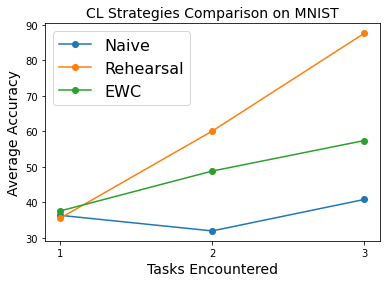

In [ ]:
plt.plot([1, 2, 3], naive_accs, '-o', label="Naive")
plt.plot([1, 2, 3], rehe_accs, '-o', label="Rehearsal")
plt.plot([1, 2, 3], ewc_accs, '-o', label="EWC")
plt.xlabel('Tasks Encountered', fontsize=14)
plt.ylabel('Average Accuracy', fontsize=14)
plt.title('CL Strategies Comparison on MNIST', fontsize=14);
plt.xticks([1, 2, 3])
plt.legend(prop={'size': 16});

**Questions to explore:**

*   What's the difference in terms of memory utilization among the three methods? 
*   Can you plot a similar graph highlighting the memory increase over time?

Some tips here: https://stackoverflow.com/questions/449560/how-do-i-determine-the-size-of-an-object-in-python/30316760

**Copyright (c) 2018. Continual AI. All rights reserved. **

See the accompanying LICENSE file in the GitHub repository for terms. 

*Date: 29-09-2018                                                             
Author: Vincenzo Lomonaco                                                    
E-mail: contact@continualai.org                                           
Website: continualai.org*                                               

## A simple Example of Continual Learning with Generative Replay

Generative Replay is a continual learning method that use a generative models to generate samples from past experiences. The idea is : by learning from actual data and generated data from the past we can learn without forgetting.

In this notebook, we take on of the simpliest setting : Mnist disjoint - 10 tasks

In the setting, we have 10 task with each time one class per task. There is no overlapping between task, and we can not use data from past tasks. 

The goal is to train a generative model to generate all the 10 classes of mnist even if a receive data from each classes one by one.

To do so we use Generative Replay !

- **At task 0 (T0) :**  We train a generator on real data (for Mnist only samples of 0 ) only and then we save it as G0. G0 will be used as a memory of T0.
- **At task 1 (T1) :**  We clone G0 as G1 and we train it with both real data (samples of 1) and generated data of T0 with G0. At the end of the task G1 learned to generate both 0 and 1. Then we delete G0, G1 will be use as a memory for **both** T0 and T1
- **At task 2 (T2) :** We clone G1 as G2 and ...

After 10 task if the generative models is efficient we are able to generate all the 10 classes by this method. (Here by default we will only train on 3 tasks but you can easily modify the notebook to do all the 10 tasks :) )

In this notebook we only train a generative model to experiment how it works, but this method could also be use to realize an efficient memory for classification algorithms or reinforcement learning algorithms !!


Let's start !

1. We Create the environment to execute the code, we install pytorch with cuda 8.0 for GPU acceleration.

In [ ]:
# http://pytorch.org/
from os import path
from wheel.pep425tags import get_abbr_impl, get_impl_ver, get_abi_tag
platform = '{}{}-{}'.format(get_abbr_impl(), get_impl_ver(), get_abi_tag())

accelerator = 'cu80' #'cu80' if path.exists('/opt/bin/nvidia-smi') else 'cpu'
print('Platform:', platform, 'Accelerator:', accelerator)

!pip install --upgrade --force-reinstall -q http://download.pytorch.org/whl/{accelerator}/torch-0.4.0-{platform}-linux_x86_64.whl torchvision

import torch
print('Torch', torch.__version__, 'CUDA', torch.version.cuda)

Platform: cp36-cp36m Accelerator: cu80
tcmalloc: large alloc 1073750016 bytes == 0x5ba4c000 @  0x7ff44315c2a4 0x591a07 0x5b5d56 0x502e9a 0x506859 0x502209 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x507641 0x502209 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x507641 0x504c28 0x502540 0x502f3d 0x507641
pymc3 3.6 has requirement joblib<0.13.0, but you'll have joblib 0.13.0 which is incompatible.
jupyter-console 6.0.0 has requirement prompt-toolkit<2.1.0,>=2.0.0, but you'll have prompt-toolkit 1.0.15 which is incompatible.
google-colab 0.0.1a1 has requirement six~=1.11.0, but you'll have six 1.12.0 which is incompatible.
featuretools 0.4.1 has requirement pandas>=0.23.0, but you'll have pandas 0.22.0 which is incompatible.
cufflinks 0.14.6 has requirement plotly>=3.0.0, but you'll have plotly 1.12.12 which is incompatible.
Torch 0.4.0 CUDA 8.0.61


2. We import all library needed for training and visualisation

In [ ]:
import torch
import torch.nn as nn
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from torch.autograd import Variable
from copy import deepcopy

3. We clone the continualAI repo ta get an easy to use data loader for mnist

In [ ]:
!git clone https://github.com/ContinualAI/colab.git continualai/colab

Cloning into 'continualai/colab'...
remote: Enumerating objects: 84, done.
remote: Total 84 (delta 0), reused 0 (delta 0), pack-reused 84
Unpacking objects: 100% (84/84), done.


4. We import mnist and inialize it

In [ ]:
!ls colab

extras	LICENSE  notebooks  README.md  scripts


In [ ]:
from continualai.colab.scripts import mnist
mnist.init()

Download complete.
Save complete.


5. We can now load the data set and get training and testing data and labels

In [ ]:
x_train, t_train, x_test, t_test = mnist.load()

print("x_train dim and type: ", x_train.shape, x_train.dtype)
print("t_train dim and type: ", t_train.shape, t_train.dtype)
print("x_test dim and type: ", x_test.shape, x_test.dtype)
print("t_test dim and type: ", t_test.shape, t_test.dtype)

x_train dim and type:  (60000, 1, 28, 28) float32
t_train dim and type:  (60000,) uint8
x_test dim and type:  (10000, 1, 28, 28) float32
t_test dim and type:  (10000,) uint8


6. We set a flag to use cuda for GPU acceleration and we fix the seed for reproducibility purpose

In [ ]:
# switch to False to use CPU
use_cuda = True

use_cuda = use_cuda and torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu");
torch.manual_seed(1);

7. Creation of a generator. We will use a GAN to achieve Generative Replay.

In [ ]:
class Generator(nn.Module):
    # Network Architecture is exactly same as in infoGAN (https://arxiv.org/abs/1606.03657)
    # Architecture : FC1024_BR-FC7x7x128_BR-(64)4dc2s_BR-(1)4dc2s_S
    def __init__(self):
        super(Generator, self).__init__()

        self.latent_dim = 1024
        self.input_height = 28
        self.input_width = 28
        self.input_dim = 62
        self.output_dim = 1

        self.fc = nn.Sequential(
            nn.Linear(self.input_dim, self.latent_dim),
            nn.BatchNorm1d(self.latent_dim),
            nn.ReLU(),
            nn.Linear(self.latent_dim, 128 * (self.input_height // 4) * (self.input_width // 4)),
            nn.BatchNorm1d(128 * (self.input_height // 4) * (self.input_width // 4)),
            nn.ReLU(),
        )
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 4, 2, 1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, self.output_dim, 4, 2, 1),
            nn.Sigmoid(),
        )

        self.maxPool = nn.MaxPool2d((2, 2), stride=(2, 2))
        self.Sigmoid = nn.Sigmoid()
        self.apply(self.weights_init)
    
    def reinit(self):
      self.apply(self.weights_init)

    def forward(self, input):
        input = input.view(-1, self.input_dim)
        x = self.fc(input)
        x = x.view(-1, 128, (self.input_height // 4), (self.input_width // 4))
        x = self.deconv(x)
        return x

    def weights_init(self, m):
        classname = m.__class__.__name__
        if classname.find('Conv') != -1:
            m.weight.data.normal_(0.0, 0.02)
        elif classname.find('BatchNorm') != -1:
            m.weight.data.normal_(1.0, 0.02)
            m.bias.data.fill_(0)

7. Here is the Discriminator of our GAN

In [ ]:
class Discriminator(nn.Module):
    # Network Architecture is exactly same as in infoGAN (https://arxiv.org/abs/1606.03657)
    # Architecture : (64)4c2s-(128)4c2s_BL-FC1024_BL-FC1_S
    def __init__(self):
        super(Discriminator, self).__init__()
        self.input_height = 28
        self.input_width = 28
        self.input_dim = 1
        self.output_dim = 1

        self.latent_dim = 1024

        shape = 128 * (self.input_height // 4) * (self.input_width // 4)

        self.fc1_1 = nn.Linear(784, self.latent_dim)
        self.fc1_2 = nn.Linear(10, self.latent_dim)
        self.fc2 = nn.Linear(self.latent_dim * 2, self.latent_dim // 2)
        self.fc2_bn = nn.BatchNorm1d(self.latent_dim // 2)
        self.fc3 = nn.Linear(self.latent_dim // 2, 256)
        self.fc3_bn = nn.BatchNorm1d(256)
        self.fc4 = nn.Linear(256, 1)

        self.conv = nn.Sequential(
            nn.Conv2d(self.input_dim, 64, 4, 2, 1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
        )
        self.fc = nn.Sequential(
            nn.Linear(shape, self.latent_dim),
            nn.BatchNorm1d(self.latent_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(self.latent_dim, self.output_dim),
            nn.Sigmoid(),
        )
        self.aux_linear = nn.Linear(shape, 10)
        self.softmax = nn.Softmax()
        self.apply(self.weights_init)
    
    def reinit(self):
      self.apply(self.weights_init)

    def weights_init(self, m):
        classname = m.__class__.__name__
        if classname.find('Conv') != -1:
            m.weight.data.normal_(0.0, 0.02)
        elif classname.find('BatchNorm') != -1:
            m.weight.data.normal_(1.0, 0.02)
            m.bias.data.fill_(0)

    def forward(self, input):
        x = self.conv(input)
        x = x.view(x.data.shape[0], 128 * (self.input_height // 4) * (self.input_width // 4))
        return self.fc(x)

8. The function get_iter_dataset makes possible to load data from only one particular class. It will help to load data class by class.

In [ ]:
# function to get digits from only one class
def get_iter_dataset(x_train, t_train, classe=None):
    if classe is not None:
        return x_train[np.where(t_train==classe)[0]]

9. The function "run_batch" train the Generator and Discriminator one a particular batch of data.

In [ ]:
def run_batch(G, D, G_optimizer, D_optimizer, x_):
      x_ = x_.view((-1, 1, 28, 28))
    
      # y_real and y_fake are the label for fake and true data
      y_real_ = Variable(torch.ones(x_.size(0), 1))
      y_fake_ = Variable(torch.zeros(x_.size(0), 1))
      if use_cuda:
        y_real_, y_fake_ = y_real_.cuda(0), y_fake_.cuda(0)

      z_ = torch.rand((x_.size(0), z_dim))

      x_, z_ = Variable(x_), Variable(z_)

      if use_cuda:
        x_, z_ = x_.cuda(0), z_.cuda(0)

      # update D network
      D_optimizer.zero_grad()

      D_real = D(x_)
      D_real_loss = BCELoss(D_real, y_real_[:x_.size(0)])

      G_ = G(z_)
      D_fake = D(G_)
      D_fake_loss = BCELoss(D_fake, y_fake_[:x_.size(0)])

      D_loss = D_real_loss + D_fake_loss

      D_loss.backward()
      D_optimizer.step()

      # update G network
      G_optimizer.zero_grad()

      G_ = G(z_)
      D_fake = D(G_)
      G_loss = BCELoss(D_fake, y_real_[:x_.size(0)])

      G_loss.backward()
      G_optimizer.step()

In [ ]:
#Declarations and Hyper-parameters

# Training hyper-parameter
nb_task = 3  # change this to 10 if you want the experiment of the full 10 classes setting
batch_size = 64
lr = 0.0002
z_dim = 62
epoch_number = 10
nb_samples = 10

G = Generator()
D = Discriminator()

# G and D are put in train mode
G.train()
D.train()

if use_cuda:
  G.cuda(0)
  D.cuda(0)

# Use of Adam optimizer 
G_optimizer = optim.Adam(G.parameters(), lr=lr)
D_optimizer = optim.Adam(D.parameters(), lr=lr)
BCELoss = nn.BCELoss()

### Training Generator without Replay
In the following cell we train the generator without using Generative Replay. It show what happen when the catastrophics forgetting appear. Each line of samples is ramdomly sampled from the generator at the end of each task. We can see that at the end of each task the generator is only able to generate data from the present and not anymore from the past task. 

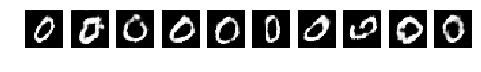

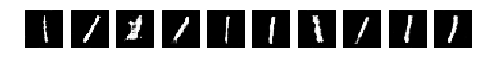

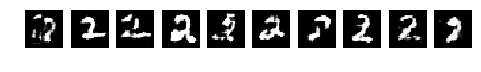

In [ ]:
for task in range(nb_task):
  
  data = get_iter_dataset(x_train, t_train, classe=task)
  nb_batch = int(len(data)/batch_size)
  
  for epoch in range(epoch_number):
    for index in range(nb_batch):
      x_=torch.FloatTensor(data[index*batch_size:(index+1)*batch_size])
      run_batch(G, D, G_optimizer, D_optimizer, x_)

  
  z_ = Variable(torch.rand((nb_samples, z_dim)))
  
  if use_cuda:
    z_ = z_.cuda(0)
  samples = G(z_).data
  samples = samples.cpu().numpy()
  #plt.plot(samples[0])
  
  f, axarr = plt.subplots(1,nb_samples)
  for j in range(nb_samples):
    axarr[j].imshow(samples[j, 0], cmap="gray")
  np.vectorize(lambda ax:ax.axis('off'))(axarr);

10. This function help to generate replayed data from the GAN use as memory (Gt-1)

In [ ]:
# New function to generate samples for replay
def get_replay(generator, batchsize):
  z_ = Variable(torch.rand((batchsize, z_dim)))
  if use_cuda:
    z_ = z_.cuda(0)
  return generator(z_).cpu()

###Training Generator with Replay

After seeing what happend when training without Generative Replay, we can now see how efficient generative replay is in this setting.

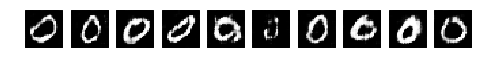

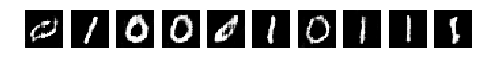

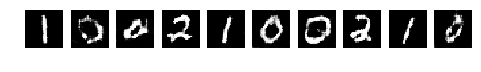

In [ ]:
# We reinit D and G to not cheat
G.reinit()
D.reinit()

for task in range(nb_task):
  
  data = get_iter_dataset(x_train, t_train, classe=task)
  nb_batch = int(len(data)/batch_size)
  
  for epoch in range(epoch_number):
    for index in range(nb_batch):
      x_=torch.FloatTensor(data[index*batch_size:(index+1)*batch_size])
       
      if task > 0 :
        # We concat a batch of previously learned data
        # the more there is past task more data need to be regenerate
        replay = get_replay(G_saved, batch_size*task)
        x_=torch.cat((x_,replay),0)
      
      
      run_batch(G, D, G_optimizer, D_optimizer, x_)
      
  G_saved = deepcopy(G)
  
  z_ = Variable(torch.rand((nb_samples, z_dim)))
  
  if use_cuda:
    z_ = z_.cuda(0)
  samples = G(z_).data
  samples = samples.cpu().numpy()
  #plt.plot(samples[0])
  
  f, axarr = plt.subplots(1,nb_samples)
  for j in range(nb_samples):
    axarr[j].imshow(samples[j, 0], cmap="gray")
  np.vectorize(lambda ax:ax.axis('off'))(axarr);

### Bibliographie

**Generative Models from the perspective of Continual Learning**
*Timothee Lesort, Hugo Caselles-Dupre, Michael Garcia-Ortiz,  Andrei Stoian  and David Filliat*

```
@ARTICLE{2018arXiv181209111L,
       author = {{Lesort}, Timoth{\'e}e and {Caselles-Dupr{\'e}}, Hugo and {Garcia-
        Ortiz}, Michael and {Stoian}, Andrei and {Filliat}, David},
        title = "{Generative Models from the perspective of Continual Learning}",
      journal = {arXiv e-prints},
     keywords = {Computer Science - Machine Learning, Computer Science - Artificial Intelligence, Computer Science - Computer Vision and Pattern Recognition},
         year = 2018,
        month = Dec,
          eid = {arXiv:1812.09111},
        pages = {arXiv:1812.09111},
archivePrefix = {arXiv},
       eprint = {1812.09111},
 primaryClass = {cs.LG},
       adsurl = {https://ui.adsabs.harvard.edu/\#abs/2018arXiv181209111L},
      adsnote = {Provided by the SAO/NASA Astrophysics Data System}
}
```


## Continuous Learning with Progressive Neural Networks

One way to eleminate forgetting while keeping the benefits of transfer learning is to expand the network architecture with every task. By doing this, one can increase the capacity of the network to learn new tasks while retaining its perfromance on older ones. An example approach to achieve CL via architecture expansion is [Progressive Neural Networks(PNN)](https://https://arxiv.org/pdf/1606.04671.pdf).

**PNN**

PNN works by having a part of the network (a column) dedicated to each task. Upon adding new tasks the previous columns weights get frozen so the network perfromance on those columns is fixed. To make the new columns benefit from the old columns knowledge through transfer learning, lateral connections `a` are added. By having a seperate lateral connections, the new column can learn from previous columns without decreasing the performance on the old tasks. 

The image below shows a network of 3 tasks upon adding the third task. The dashed lines are frozen weights to fix task 1 & 2 performance and `a` connections are used to link old tasks knowledge to the new task.

<img src="https://qph.fs.quoracdn.net/main-qimg-c1e7ad14cca99e0b97475ad014e02397.webp" align="center"> </img>

This network offers one the architecture-based techniques to solve CL. That being said, the expansion per task can be limiting when the number of tasks increases. This in addition to that the network expects to have the task-id at inference time are important drawbacks of this architecture. It's still intuitive and an important benchmark so we'll discuss how to make a simple PNN.


In [ ]:
# some initial imports
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torch.optim as optim
import torch.nn.functional as F

In [ ]:
# switch to False to use CPU
use_cuda = True

use_cuda = use_cuda and torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu");
torch.manual_seed(1);

In [ ]:
# Get MNIST data
!git clone https://github.com/ContinualAI/colab.git continualai/colab

from continualai.colab.scripts import mnist
mnist.init()

Cloning into 'continualai/colab'...
remote: Enumerating objects: 124, done.
remote: Counting objects: 100% (124/124), done.
remote: Compressing objects: 100% (78/78), done.
remote: Total 244 (delta 67), reused 88 (delta 41), pack-reused 120
Receiving objects: 100% (244/244), 10.23 MiB | 39.09 MiB/s, done.
Resolving deltas: 100% (109/109), done.
Download complete.
Save complete.



Extracting data/mnist/MNIST/raw/train-images-idx3-ubyte.gz to data/mnist/MNIST/raw



Extracting data/mnist/MNIST/raw/train-labels-idx1-ubyte.gz to data/mnist/MNIST/raw



Extracting data/mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to data/mnist/MNIST/raw



Extracting data/mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to data/mnist/MNIST/raw
Processing...


/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:479: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:143.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


Done!


In [ ]:
# we will construct 5 tasks of MNIST, where every task is responsible for 2 digits
x_train, t_train, x_test, t_test = mnist.load()
# tasks to use
task_classes_arr = [(0, 1), (2, 3), (4, 5), (6, 7), (8, 9)]
tasks_num = len(task_classes_arr) # 5

task_data = []
for i, task_classes in enumerate(task_classes_arr):
  train_mask = np.isin(t_train, task_classes)
  test_mask = np.isin(t_test, task_classes)
  x_train_task, t_train_task = x_train[train_mask], t_train[train_mask]
  x_test_task, t_test_task = x_test[test_mask], t_test[test_mask]

  task_data.append((x_train_task, t_train_task - (i * 2), 
                    x_test_task, t_test_task - (i * 2)))


First we need to build a network for each column and combine those later in the main network. A column is just like an ordinary network with the exception of the lateral connections from the previous columns. An important part is that all the previous columns need to be infered before the current column, so that it can use the output with the lateral connections.

To limit the expansion of the network we'll decrease the size on the columns of tasks that come after the first task. In the code we use a hidden layer of size `128` for task#1 and `32` for all the subsequent tasks.    

In [ ]:
class Column(nn.Module):
  def __init__(self,  col_id=0, hsize=128):
    super().__init__()
    # new layers per column
    self.l1 = nn.Linear(784, hsize)
    self.l2 = nn.Linear(hsize, 2)
    # lateral connections for old intermediate outputs
    # a set of connections per layer
    self.Us = nn.ModuleList()
    self.col_id = col_id
    for col_i in range(self.col_id):
      h = 128 if col_i == 0 else 32
      lateral = nn.Linear(h, 2)
      self.Us.append(lateral)

  def add_lateral(self, x, prev_cols, lateral_weights):
    """Compute the o/p of lateral connections.
     Returns zeros tensor for first column.
     lateral_weights ([int]): list of weights to control
     the lateral connections"""
    outputs = torch.zeros_like(x)
    for col_id, col in enumerate(prev_cols):
      input = col.outputs
      if lateral_weights:
        input = input * lateral_weights[col_id]
      layer = self.Us[col_id]
      outputs += layer(input)
    return outputs

  def freeze(self):
    "freezes all parameters of the column. To be used when adding new columns."
    for param in self.parameters():
      param.requires_grad = False

  def forward(self, x, prev_cols, lateral_weights):
    "lateral_weights ([int]): list of weights to control the lateral connections"
    # 1- Transfer Learning
    # for all previous columns, compute old transfered knowledge
    # and save it to the instance of the column
    for i, col in enumerate(prev_cols):
      # compute all layers first
      l_w = lateral_weights[:i+1]
      col(x, prev_cols[:i], l_w)

    # 2- New Knowledge
    # input/1st layer
    x = x.view(x.size(0), -1)
    x = F.relu(self.l1(x))
    # save intermediate outputs of current col
    self.outputs = x
    # last/2nd layer
    x = self.l2(x)
    # add lateral connextion o/p from all previous columns
    x += self.add_lateral(x, prev_cols=prev_cols,
                          lateral_weights=lateral_weights)

    return x

To create the whole network, we'll have a ModuleList that holds the columns. Upon adding a new task, all the columns are freezed and a new column with proper lateral connections is instantiated. For the forward pass we need to indicate which column to compute and it automatically computes all its previous columns. 

In [ ]:
class Net(nn.Module):
  def __init__(self):
    super().__init__()
    self.cols = nn.ModuleList()
  
  def add_column(self, hsize=128):
    # freeze all previous columns
    for col in self.cols:
      col.freeze()
    # create new column
    col_id = len(self.cols)
    col = Column(col_id, hsize)
    self.cols.append(col)

  def forward(self, x, id, lateral_weights=None):
    if lateral_weights is None:
      # all lateral connections are on by default
      lateral_weights = [1 for _ in range(id)]
    col = self.cols[id]
    return col(x, self.cols[:id], lateral_weights)
    

In [ ]:
# basic training and testing loops
def train(model, task_id, device, x_train, t_train,
          optimizer, epochs=10, log_training=False):
    for epoch in range(epochs):
      model.train()
      
      for start in range(0, len(t_train)-1, 256):
        end = start + 256
        x, y = torch.from_numpy(x_train[start:end]), torch.from_numpy(t_train[start:end]).long()
        x, y = x.to(device), y.to(device)
        
        optimizer.zero_grad()

        output = model(x, task_id)
        loss = F.cross_entropy(output, y)
        loss.backward()
        optimizer.step()
        if log_training:
          print('Train Epoch: {} \tLoss: {:.6f}'.format(epoch, loss.item()))

def test(model, task_id, device, x_test, t_test, lateral_weights=None):
    model.eval()
    test_loss = 0
    correct = 0
    for start in range(0, len(t_test)-1, 256):
      end = start + 256
      with torch.no_grad():
        x, y = torch.from_numpy(x_test[start:end]), torch.from_numpy(t_test[start:end]).long()
        x, y = x.to(device), y.to(device)
        output = model(x, task_id, lateral_weights=lateral_weights)
        test_loss += F.cross_entropy(output, y).item() # sum up batch loss
        pred = output.max(1, keepdim=True)[1] # get the index of the max logit
        correct += pred.eq(y.view_as(pred)).sum().item()

    test_loss /= len(t_test)
    return test_loss, 100. * correct / len(t_test)

In the next step we'll have a function that adds a column per task. In order to investigate how much the network have used old columns' output, we'll test once with turning on all the lateral connections and another with them off.

In [ ]:
def train_PNN(epochs=10):
  "Train all 5 taks using PNN"
  accs_grid_a = []
  accs_grid_no_a = []

  # to track the increase of the number of parameters
  parameters = []
  grad_parameters = []

  net = Net()
  for task_id in range(tasks_num):
    # train on current task
    x_train, t_train, _, _ = task_data[task_id]
    # smaller column sizes from 2nd task inwards to limit expansion
    if task_id > 0:
      net.add_column(hsize=32)
    else: net.add_column()
    optimizer = optim.SGD(net.parameters(), lr=0.01, momentum=0.9)
    # increase of parameters over time
    parameters.append(sum(p.numel() for p in net.parameters()))
    grad_parameters.append(sum(p.numel() for p in net.parameters() if p.requires_grad))
    train(net, task_id, device, x_train, t_train, optimizer,
          epochs=epochs, log_training=False)

    # test on all tasks with lateral connections `a`
    
    accs_a = []
    for id in range(0, task_id + 1):
      _, _, x_test, t_test = task_data[id]
      # we'll have the lateral weights as fully-on here
      l_w = [1] * id
      _, test_acc = test(net, id, device, x_test, t_test, lateral_weights=l_w)
      accs_a.append(test_acc)
  
    if task_id < (tasks_num - 1):
      accs_a.extend([np.nan] * (4 - task_id))
    accs_grid_a.append(accs_a)


    # test on all tasks without lateral connections `a`
    accs_no_a = []
    for id in range(0, task_id + 1):
      _, _, x_test, t_test = task_data[id]
      # we'll have the lateral weights as fully-off here
      l_w = [0] * id
      _, test_acc = test(net, id, device, x_test, t_test, lateral_weights=l_w)
      accs_no_a.append(test_acc)
  
    if task_id < (tasks_num - 1):
      accs_no_a.extend([np.nan] * (4 - task_id))
    accs_grid_no_a.append(accs_no_a)

  # return accuracies with and without lateral connections 
  return accs_grid_a, accs_grid_no_a, parameters, grad_parameters

In [ ]:
accs_a, accs_no_a, parameters, grad_parameters= train_PNN(epochs=15)

We can see from the below figure that the network uses some of the knowledge learnt from previous tasks to learn new tasks. As task number increases, its dependance on lateral connections increases (due to having more more connections as the task# progresses.) MNIST problem with multi-head setting is relatively simple though and with more complex tasks we can see more prononced releance on transfer learning from previous columns and can have a proxy for task similarity. A deeper analysis can be found in [the original paper](https://arxiv.org/pdf/1606.04671.pdf)

Text(0.5, 0, 'Task Number')

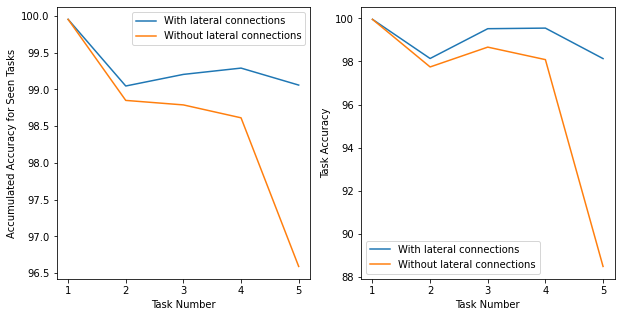

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].plot(range(1, 6), np.nanmean(accs_a, axis=1))
ax[0].plot(range(1, 6), np.nanmean(accs_no_a, axis=1))
ax[0].legend(['With lateral connections', 'Without lateral connections'])
ax[0].set_ylabel('Accumulated Accuracy for Seen Tasks')
ax[0].set_xlabel('Task Number')

ax[1].plot(range(1, 6), accs_a[-1])
ax[1].plot(range(1, 6), accs_no_a[-1])
ax[1].legend(['With lateral connections', 'Without lateral connections'])
ax[1].set_ylabel('Task Accuracy')
ax[1].set_xlabel('Task Number')

Since we add new column for every task, the number of parameters expands. The number of learnable parameters expands in more modest rate though as we are freezing old columns. In the figure below we can see the rate at which the parameters expands. Note that since we use smaller column size starting from task 2 (32 neurons vs. 128) the learnable parameters decrease at first then increases very slowly afterwards.

In [ ]:
# Number of learnable paramters decreases after task#1, increase by just 66 after task#2
print(grad_parameters)

[100738, 25444, 25510, 25576, 25642]


Text(0.5, 0, 'Task Number')

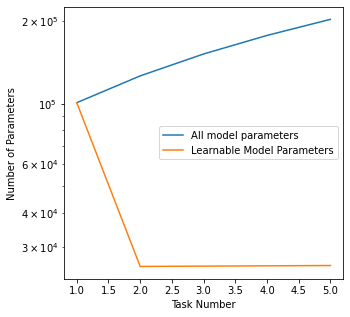

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.plot(range(1, 6), parameters)
ax.plot(range(1, 6), grad_parameters)
ax.set_yscale('log')
ax.legend(['All model parameters', 'Learnable Model Parameters'])
ax.set_ylabel('Number of Parameters')
ax.set_xlabel('Task Number')

# Homework

In this notebook, we saw multiple ways to deal with Neural Networks in dynamic scenarios of active learning, adaptive experimentation, and continous learning. In this homework you will be exploring each of these options with your own data and social scientific questions.

**1)** How could you use active learning in your project?

In [ ]:
active_learning = 'value' #@param {type:"string"}

**1a)** Implement Active Learning (in any form) using your social scientific data.

**2)** How would you use adaptive experimentation and bayesian optimisation in your project?

In [ ]:
adaptive_learning = 'value' #@param {type:"string"}

**2a)** Implement Adaptive Experimentation in any form in a way that is related to your project or research.

**3)** How would you use adaptive experimentation and bayesian optimisation in your project?

In [ ]:
continuous_learning = 'value' #@param {type:"string"}

**3a)** Implement Continuous Learning in any form in a way that is related to your project or research.